---
# Shoes, Sandals and Boots Image Classification Problem
---

## Enunciado

En esta actividad, el alumno debe **evaluar y comparar dos estrategias** para la **clasificación de imágenes** empleando el **dataset asignado**. El/La alumnx deberá resolver el reto proponiendo una solución válida **basada en aprendizaje profundo**, más concretamente en redes neuronales convolucionales (**CNNs**). Será indispensable que la solución propuesta siga el **pipeline visto en clase** para resolver este tipo de tareas de inteligencia artificial:

1.   **Carga** del conjunto de datos
2.   **Inspección** del conjunto de datos
3.   **Acondicionamiento** del conjunto de datos
4.   Desarrollo de la **arquitectura** de red neuronal y **entrenamiento** de la solución
5.   **Monitorización** del proceso de **entrenamiento** para la toma de decisiones
6.   **Evaluación** del modelo predictivo y planteamiento de la siguiente prueba experimental

### Estrategia 1: Entrenar desde cero o *from scratch*

La primera estrategia a comparar será una **red neuronal profunda** que el **alumno debe diseñar, entrenar y optimizar**. Se debe **justificar empíricamente** las decisiones que llevaron a la selección de la **arquitectura e hiperparámetros final**. Se espera que el alumno utilice todas las **técnicas de regularización** mostradas en clase de forma justificada para la mejora del rendimiento de la red neuronal (*weight regularization*, *dropout*, *batch normalization*, *data augmentation*, etc.).

### Estrategia 2: Red pre-entrenada

La segunda estrategia a comparar debe incluir la utilización de una **red preentrenada** con el dataset ImageNet, llevando a cabo tareas de ***transfer learning*** y ***fine-tuning*** para resolver la tarea de clasificación asignada. Deben **compararse al menos dos tipos de arquitecturas** (VGGs, ResNet50, Xception, InceptionV3, InceptionResNetV2, MobileNetV2, DenseNet, ResNet) y se debe **seleccionar la que mayor precisión proporcione** (información sobre las arquitecturas disponibles en https://keras.io/applications/). Se espera que el/la alumnx utilice todas las **técnicas de regularización** mostradas en clase de forma justificada para la mejora del rendimiento de la red neuronal (*weight regularization*, *dropout*, *batch normalization*, *data augmentation*, etc.).

# a) Instalaciones

In [ ]:
# Nos aseguramos que tenemos instalada la última versión de la API de Kaggle en Colab
!pip install --upgrade --force-reinstall --no-deps kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.7/79.7 kB 706.5 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.6.12-py3-none-any.whl size=102969 sha256=305a4ea5ec9f81dcdd48549f3ac7a945fab2ac167b5cdce2b906eb77ab3a162a
  Stored in directory: /root/.cache/pip/wheels/1e/0b/7c/50f8e89c3d2f82838dbd7afeddffbb9357003009ada98216c7
Successfully built kaggle
  Attempting uninstall: kaggle
    Found existing installation: kaggle 1.6.12
    Uninstalling kaggle-1.6.12:
      Successfully uninstalled kaggle-1.6.12


# b) Importaciones

In [ ]:
import csv
import datetime
import json
import logging
import os
import shutil
import sys
import zipfile
import math

import cv2
from google.colab import files
import keras
from keras.applications.resnet_v2 import preprocess_input
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import sklearn
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.applications import ResNet50V2, InceptionV3
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import BatchNormalization
from keras.layers import GlobalMaxPooling2D
from tensorflow.keras.initializers import he_normal

# 0. Montar la unidad de cola
Necesario para guardar el modelo entrenado

BASE_FOLDER ->  La carpeta para guardar los datos

In [ ]:
# SOLO PARA USO EN GOOGLE COLABORATORY
# Para conectar el notebook con la cuenta de gdrive
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

BASE_FOLDER = '/content/drive/My Drive/DL_VIU/' # Se debe garantizar que la carpeta docencia compartida se almacena en el directorio raíz de Google Drive. En caso contrario modificar este path

Mounted at /content/drive/


# 1. Carga del conjunto de datos

https://www.kaggle.com/docs/api

In [ ]:
# Seleccionar el API Token personal previamente descargado (fichero kaggle.json)
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"malenanunezmartinez","key":"cc183db94d37a6a35a250af3c276b1d7"}'}

In [ ]:
# Creamos un directorio en el que copiamos el fichero kaggle.json
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# Ya podemos listar los datasets disponibles en kaggle para su descarga
!kaggle datasets list -s 'shoe vs sandal vs boot'

ref                                                        title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
hasibalmuzdadid/shoe-vs-sandal-vs-boot-dataset-15k-images  Shoe vs Sandal vs Boot Image Dataset (15K Images)   47MB  2022-10-29 15:07:51           7458        157  0.9375           
utkarshsaxenadn/shoe-sandal-boot-classifier                Shoe Sandal Boot Classifier                        214MB  2022-09-27 07:00:59             94          7  1.0              


In [ ]:
# IMPORTANTE ANTES DE DESCARGAR UN DATASET !!!
# Antes de descargar el dataset debemos ir a https://www.kaggle.com/c/$nameCompetition/data y aceptar las "Competition Rules"
# En caso de no realizar el paso anterior al descargar el dataset obtenedremos el siguiente mensaje "403 - Forbidden"
# AHORA SI: Descarguemos un dataset de cierta competición
#!kaggle competitions download -c dogs-vs-cats-redux-kernels-edition

#NOTA: El nombre del dataset de competición a descargar se informará en el documento en el que se presenten las parejas formadas

In [ ]:
!kaggle datasets download -d 'hasibalmuzdadid/shoe-vs-sandal-vs-boot-dataset-15k-images'

Dataset URL: https://www.kaggle.com/datasets/hasibalmuzdadid/shoe-vs-sandal-vs-boot-dataset-15k-images
License(s): copyright-authors
 87% 41.0M/47.0M [00:00<00:00, 52.6MB/s]
100% 47.0M/47.0M [00:00<00:00, 56.4MB/s]


In [ ]:
# Creemos un directorio para descomprimir los datos
!mkdir my_dataset

In [ ]:
# Descomprimimos los datos y los dejamos listos para trabajar
%%capture
!unzip shoe-vs-sandal-vs-boot-dataset-15k-images.zip -d my_dataset

# 2. Inspección del conjunto de datos

In [ ]:
# Directorio

data_dir = '/content/my_dataset/Shoe vs Sandal vs Boot Dataset'
project_dir = '/content/my_dataset/project'
train_dir = os.path.join(project_dir, 'train')
val_dir = os.path.join(project_dir, 'val')
test_dir = os.path.join(project_dir, 'test')
preprocessed_data_dir = '/content/preprocessed_images'

## 2.1. Visualizar ejemplos de cada clase

In [ ]:
# Obtener la lista de clases (etiquetas)
classes = os.listdir(data_dir)
print("Clases disponibles:", classes)

Clases disponibles: ['Boot', 'Sandal', 'Shoe']


Ruta del subdirectorio final: /content/my_dataset/Shoe vs Sandal vs Boot Dataset/Boot
Número de fotos en la ruta: 5000


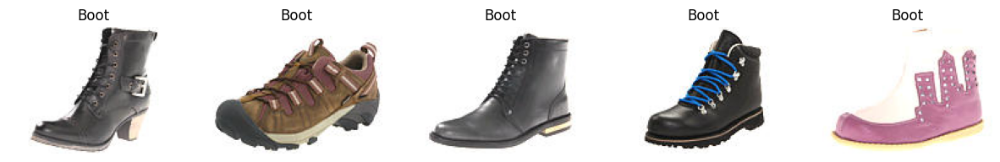

Ruta del subdirectorio final: /content/my_dataset/Shoe vs Sandal vs Boot Dataset/Sandal
Número de fotos en la ruta: 5000


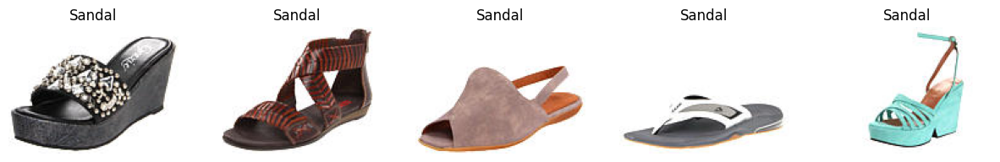

Ruta del subdirectorio final: /content/my_dataset/Shoe vs Sandal vs Boot Dataset/Shoe
Número de fotos en la ruta: 5000


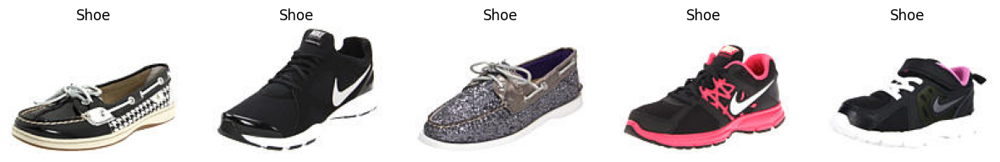

In [ ]:
def mostrar_imagenes(data_dir):
  """
  Función para mostrar 5 imágenes por cada carpeta que contenga imágenes.
  Args:
    data_dir (str): La ruta del directorio de datos.
  Returns:
    None
  """
  max_depth = 0
  for root, dirs, files in os.walk(data_dir):
    depth = root.count(os.sep) - data_dir.count(os.sep)
    if depth > max_depth and any(f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')) for f in files):
        max_depth = depth

  for root, dirs, files in os.walk(data_dir):
    depth = root.count(os.sep) - data_dir.count(os.sep)
    if depth == max_depth:
      print("Ruta del subdirectorio final:", root)
      print("Número de fotos en la ruta:", len(files))
      fig, axes = plt.subplots(1, 5, figsize=(15, 3))
      img_files = files[:5]
      for j, img_file in enumerate(img_files):
        img = Image.open(os.path.join(root, img_file))
        axes[j].imshow(img)
        axes[j].axis('off')
        axes[j].set_title(os.path.basename(root))
      plt.show()

# Llamar a la función
mostrar_imagenes(data_dir)

## 2.2. Analizar la distribución de las imágenes

In [ ]:
def analizar_distribucion_clases(data_dir):
  """
  Analiza la distribución de las clases en un directorio de datos.
  Args:
    data_dir (str): La ruta del directorio de datos que contiene subdirectorios con nombres de clases.
  Returns:
    None
  """
  # Obtener la lista de clases (subdirectorios)
  classes = os.listdir(data_dir)

  num_images_per_class = {}

  # Iterar sobre cada clase y contar el número de imágenes
  for cls in classes:
    num_images = len(os.listdir(os.path.join(data_dir, cls)))
    num_images_per_class[cls] = num_images

  print("Número de imágenes por clase:")
  for cls, num_images in num_images_per_class.items():
    print(f"{cls}: {num_images}")

# Llamar a la función
analizar_distribucion_clases(data_dir)


Número de imágenes por clase:
Boot: 5000
Sandal: 5000
Shoe: 5000


## 2.3. Mostrar el tamaño de las imágenes

In [ ]:
def mostrar_tamanio_imagenes(data_dir):
  """
  Muestra el tamaño de las imágenes por clase en un directorio de datos.
  Args:
    data_dir (str): La ruta del directorio de datos que contiene subdirectorios con nombres de clases.
  Returns:
    None
  """
  # Obtener la lista de clases (subdirectorios)
  classes = os.listdir(data_dir)

  sizes_per_class = {}

  # Iterar sobre cada clase y obtener el tamaño de cada imagen
  for cls in classes:
    img_paths = [os.path.join(data_dir, cls, img_file) for img_file in os.listdir(os.path.join(data_dir, cls))]
    sizes_per_class[cls] = [Image.open(img_path).size for img_path in img_paths]

  # Imprimir el tamaño máximo y mínimo de las imágenes por clase
  for cls, sizes in sizes_per_class.items():
    max_size = max(sizes)
    min_size = min(sizes)
    print(f"{cls}: Tamaño máximo: {max_size}, Tamaño mínimo: {min_size}")

# Llamar a la función
mostrar_tamanio_imagenes(data_dir)

Boot: Tamaño máximo: (136, 102), Tamaño mínimo: (136, 102)
Sandal: Tamaño máximo: (136, 102), Tamaño mínimo: (135, 102)
Shoe: Tamaño máximo: (136, 102), Tamaño mínimo: (136, 102)


# 3. Acondicionamiento del conjunto de datos


## 3.1 División de datos y creación de la estructura del directorio
- Creación una nueva estructura de carpetas train/ val/ y test/ para poder emplear flow_from_directory de ImageDataGenerator

In [ ]:
import os
import shutil
import random
from sklearn.model_selection import train_test_split

def split_and_copy_data(data_dir, project_dir, train_dir, val_dir, test_dir):
    """
    Función que divide un conjunto de imágenes en datos de entrenamiento, validación y prueba, y los copia en carpetas dentro de un directorio de proyecto
    Args:
        data_dir (str): La ruta del directorio de datos que contiene subdirectorios con nombres de clases.
    Returns:
        None
    """
    # Crear la carpeta principal 'project' si no existe
    if not os.path.exists(project_dir):
        os.makedirs(project_dir)

    # Crear las carpetas train/, val/ y test/ si no existen
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    if not os.path.exists(val_dir):
        os.makedirs(val_dir)
    if not os.path.exists(test_dir):
        os.makedirs(test_dir)

    # Obtener la lista de todas las imágenes en la carpeta de origen
    images_per_class = {}
    classes = os.listdir(data_dir)
    for cls in classes:
        images_per_class[cls] = [os.path.join(data_dir, cls, img_file) for img_file in os.listdir(os.path.join(data_dir, cls))]

    # Mezclar el orden de las imágenes sin mezclar por clases
    for cls, images in images_per_class.items():
        random.shuffle(images)

    # Dividir los datos en conjuntos de entrenamiento, validación y prueba para cada clase
    train_images_per_class = {}
    val_images_per_class = {}
    test_images_per_class = {}
    for cls, img in images_per_class.items():
        # Calcular los tamaños de los conjuntos de datos
        num_images = len(img)
        train_size = int(0.7 * num_images)
        val_size = int(0.15 * num_images)
        test_size = num_images - train_size - val_size

        # Dividir las imágenes en conjuntos de entrenamiento, validación y prueba
        train_images, remaining = train_test_split(img, train_size=train_size, random_state=42)
        val_images, test_images = train_test_split(remaining, train_size=val_size, random_state=42)

        train_images_per_class[cls] = train_images
        val_images_per_class[cls] = val_images
        test_images_per_class[cls] = test_images

    # Copiar las imágenes de entrenamiento a la carpeta correspondiente
    for cls, images in train_images_per_class.items():
        destination_cls_train = os.path.join(train_dir, cls)
        if not os.path.exists(destination_cls_train):
            os.makedirs(destination_cls_train)
        for img in images:
            shutil.copy2(img, destination_cls_train)

    # Copiar las imágenes de validación a la carpeta correspondiente
    for cls, images in val_images_per_class.items():
        destination_cls_val = os.path.join(val_dir, cls)
        if not os.path.exists(destination_cls_val):
            os.makedirs(destination_cls_val)
        for img in images:
            shutil.copy2(img, destination_cls_val)

    # Copiar las imágenes de prueba a la carpeta correspondiente
    for cls, images in test_images_per_class.items():
        destination_cls_test = os.path.join(test_dir, cls)
        if not os.path.exists(destination_cls_test):
            os.makedirs(destination_cls_test)
        for img in images:
            shutil.copy2(img, destination_cls_test)

    print("Datos divididos y copiados correctamente.")

# Llamar a la función
split_and_copy_data(data_dir, project_dir, train_dir, val_dir, test_dir)


Datos divididos y copiados correctamente.


Ruta del subdirectorio final: /content/my_dataset/project/val/Boot
Número de fotos en la ruta: 750


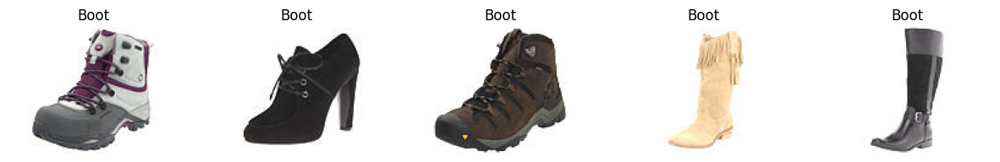

Ruta del subdirectorio final: /content/my_dataset/project/val/Sandal
Número de fotos en la ruta: 750


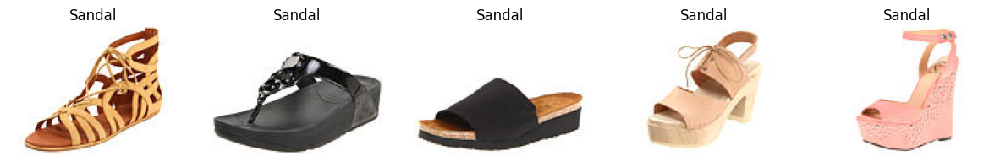

Ruta del subdirectorio final: /content/my_dataset/project/val/Shoe
Número de fotos en la ruta: 750


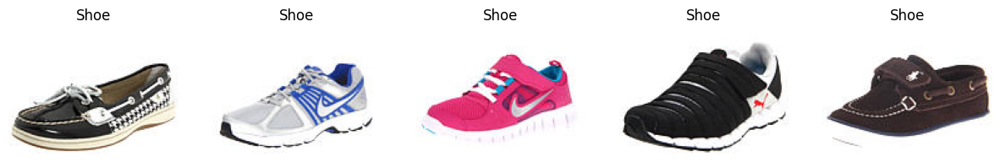

Ruta del subdirectorio final: /content/my_dataset/project/test/Boot
Número de fotos en la ruta: 750


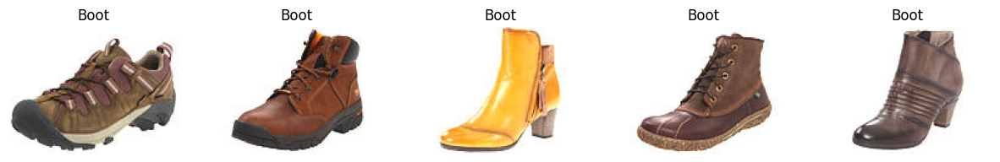

Ruta del subdirectorio final: /content/my_dataset/project/test/Sandal
Número de fotos en la ruta: 750


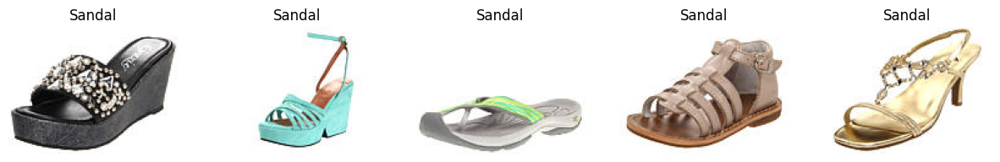

Ruta del subdirectorio final: /content/my_dataset/project/test/Shoe
Número de fotos en la ruta: 750


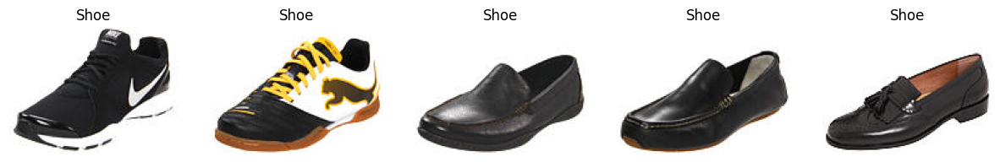

Ruta del subdirectorio final: /content/my_dataset/project/train/Boot
Número de fotos en la ruta: 3500


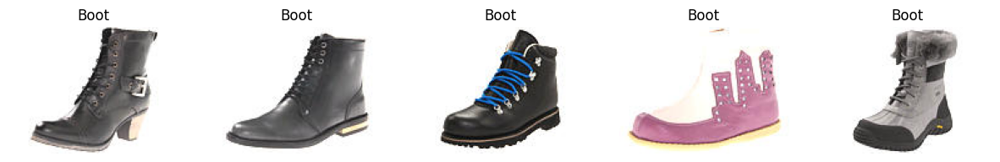

Ruta del subdirectorio final: /content/my_dataset/project/train/Sandal
Número de fotos en la ruta: 3500


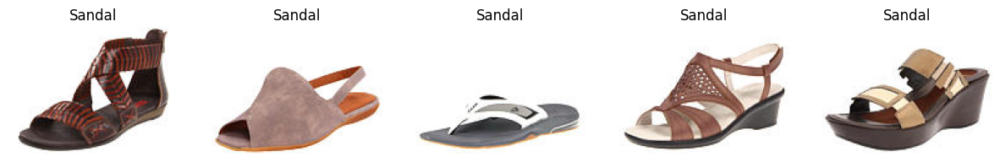

Ruta del subdirectorio final: /content/my_dataset/project/train/Shoe
Número de fotos en la ruta: 3500


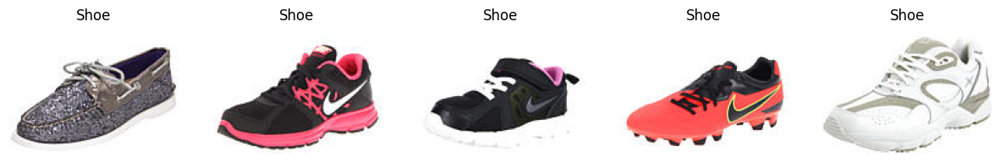

In [ ]:
# Comprobar que las imágenes se han distribuido bien
mostrar_imagenes(project_dir)

## 3.2. Preprocesamiento del conjunto datos
- Carga de datos
- Generación de etiquetas
- Redimensionar todas las imágenes al mismo tamaño para que sean compatibles con la entrada de la red neuronal
- Normalizar los valores de píxeles para que estén en un rango específico
- One-hot Encoding

In [ ]:
"""
# Definir las clases
classes = os.listdir(data_dir)
num_classes = len(classes)

# Listas para almacenar imágenes y etiquetas
train_images = []
train_labels = []
test_images = []
test_labels = []

# Función para cargar imágenes y etiquetas
def load_data(data_dir):
    for i, class_name in enumerate(classes):
        class_dir = os.path.join(data_dir, class_name)
        for filename in os.listdir(class_dir):
            img_path = os.path.join(class_dir, filename)
            img = cv2.imread(img_path) # Convertir la imagen a un array de NumPy (alto, ancho, canales)
            img = cv2.resize(img, (128, 128))  # Redimensionar la imagen si es necesario
            img = img / 255.0  # Normalizar la imagen
            if data_dir == train_dir:
                train_images.append(img)
                train_labels.append(i)
            elif data_dir == test_dir:
                test_images.append(img)
                test_labels.append(i)


# Cargar datos de entrenamiento y test
load_data(train_dir)
load_data(test_dir)

# Convertir a numpy arrays y realizar one-hot encoding
x_train = np.array(train_images)
y_train = to_categorical(np.array(train_labels), num_classes)

# IMPORTANTE: Si las imágenes no tienen el mismo tamaño, es posible que train_images no sea un array homogéneo. Es por eso que se recomienda volver a convertir a array.

x_test = np.array(test_images)
y_test = to_categorical(np.array(test_labels), num_classes)

# Verificar las dimensiones de los arrays
print("Dimensiones de x_train:", x_train.shape)
print("Dimensiones de y_train:", y_train.shape)
print("Dimensiones de x_test:", x_test.shape)
print("Dimensiones de y_test:", y_test.shape)
"""

'\n# Definir las clases\nclasses = os.listdir(data_dir)\nnum_classes = len(classes)\n\n# Listas para almacenar imágenes y etiquetas\ntrain_images = []\ntrain_labels = []\ntest_images = []\ntest_labels = []\n\n# Función para cargar imágenes y etiquetas\ndef load_data(data_dir):\n    for i, class_name in enumerate(classes):\n        class_dir = os.path.join(data_dir, class_name)\n        for filename in os.listdir(class_dir):\n            img_path = os.path.join(class_dir, filename)\n            img = cv2.imread(img_path) # Convertir la imagen a un array de NumPy (alto, ancho, canales)\n            img = cv2.resize(img, (128, 128))  # Redimensionar la imagen si es necesario\n            img = img / 255.0  # Normalizar la imagen\n            if data_dir == train_dir:\n                train_images.append(img)\n                train_labels.append(i)\n            elif data_dir == test_dir:\n                test_images.append(img)\n                test_labels.append(i)\n\n\n# Cargar datos de 

## 3.3. Creación de la instancia de la clase ImageDataGenerator
Se instancia un objeto de la clase ImageDataGenerator para poder emplear el método flow_from_directory con el objetivo de:
  1. Realizar *batch data flow*: Se utilizara para generar lotes de datos de imágenes en tiempo real a medida que se necesitan, para no sobrecargar la memoria RAM
  2. Se utilizará para realizar *data augmentation* en el caso de ser necesario

Cuando se usa ImageDataGenerator.flow_from_directory con class_mode='categorical', las etiquetas se asignan automáticamente en formato one-hot encoding. Esto significa que cada etiqueta se representa como un vector binario donde un único elemento tiene valor 1 y el resto de elementos tienen valor 0, correspondiente a la clase de la imagen.

Por ejemplo, si tenemos clases ('Boot', 'Sandal' y 'Shoe'), las etiquetas se representarán de la siguiente manera en one-hot encoding:
- 'Boot': [1, 0, 0]
- 'Sandal': [0, 1, 0]
- 'Shoe': [0, 0, 1]

In [ ]:
# IMPORTANTE: Si no especificas steps_per_epoch, el número de pasos por época será igual al número total de muestras de entrenamiento dividido por el tamaño del lote (batch_size)

# Crear generadores de imágenes para entrenamiento y prueba
train_datagen = ImageDataGenerator(
        # rescale=1./255, # Normalizar las imágenes
        preprocessing_function=preprocess_input, # Para aplicar la normalización de ImageNet
        )

val_datagen = ImageDataGenerator(
        # rescale=1./255, # Normalizar las imágenes
        preprocessing_function=preprocess_input, # Para aplicar la normalización de ImageNet
        )

test_datagen = ImageDataGenerator(
    # rescale=1./255 # Normalizar las imágenes
    preprocessing_function=preprocess_input # Para aplicar la normalización de ImageNet
    )

# Imágenes de entrenamiento
train_generator_32 = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224,224),  # Redimensionar las imágenes
        class_mode='categorical', # Utilizar one-hot encoding para las etiquetas
        batch_size=32,
        shuffle=True)

# Imágenes de validación
val_generator_32 = train_datagen.flow_from_directory(
        val_dir,
        target_size=(224,224),  # Redimensionar las imágenes
        class_mode='categorical', # Utilizar one-hot encoding para las etiquetas
        batch_size=32)

# Imágenes de prueba
test_generator_32 = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224,224),  # Redimensionar las imágenes
        class_mode='categorical', # Utilizar one-hot encoding para las etiquetas
        batch_size=32)

Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


### 3.3.1. Resumen y verificaciones
- Resolución de imágenes: 224x224
- Normalización: noralización ImageNet (preprocess_input)
- Balance de clases: Correcta. Ver nº de imágenes por carpeta arriba
- Verificación de directorios: Correcto. Ver nombres arriba.
- Parámetros de generador:
  - batch_size
  - class_mode='categorical': Codificamos las etiquetas one-hot
    - Shoe: [1, 0, 0]
    - Sandal: [0, 1, 0]
    - Boot: [0, 0, 1]

In [ ]:
# next() -> Obtener el primer lote de 32 muestras
# Obtener la primera imagen y etiqueta del conjunto de entrenamiento
trainX, trainY = next(train_generator_32)
first_train_image = trainX[0]
first_train_label = trainY[0]

# Obtener la primera imagen y etiqueta del conjunto de validación
valX, valY = next(val_generator_32)
first_val_image = valX[0]
first_val_label = valY[0]

# Obtener la primera imagen y etiqueta del conjunto de prueba
testX, testY = next(test_generator_32)
first_test_image = testX[0]
first_test_label = testY[0]


In [ ]:
print(first_train_image.shape)
print(first_train_image)

(224, 224, 3)
[[[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 ...

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]]


In [ ]:
print(first_train_label.shape)
print(first_train_label)

(3,)
[0. 1. 0.]


In [ ]:
print("Tamaño de las imágenes de entrenamiento:", train_generator_32.target_size)
print("Tamaño de las imágenes de validación:", val_generator_32.target_size)
print("Tamaño de las imágenes de prueba:", test_generator_32.target_size)

Tamaño de las imágenes de entrenamiento: (224, 224)
Tamaño de las imágenes de validación: (224, 224)
Tamaño de las imágenes de prueba: (224, 224)


# 4. Desarrollo de la arquitectura de red neuronal y entrenamiento de la solución

Una arquitectura típica de clasificación de imágenes suele incluir al menos una capa convolucional, una capa de agrupamiento (pooling layer), una o más capas densas (dense layers) y, posiblemente, una capa de aplanamiento (flatten layer).

Empezamos con una arquitectura relativamente pequeña y sencilla e iremos aumentando la complejidad y ajustando la red para mejorar los resultados.

Cabe señalar que en este apartado también se ha incluido el punto **"5. Monitorización del proceso de entrenamiento para la toma de decisiones"**, ya que se ha realizado para cada arquitectura desarrollada; así como el punto **"6. Evaluación del modelo predictivo"**, para verificar el correcto funcionamiento de los modelos creados.

## 4.1. Estrategia 1: Red *From Scratch*

La primera estrategia consiste en diseñar, entrenar y optimizar una red profunda desde cero o from scarch. Aunque las arquitecturas pre-entrenadas como las que se verán en las siguientes secciones son conocidas por su eficacia y capacidad de aprendizaje profundo, optar por entrenar una red desde cero permite experimentar con diferentes arquitecturas, ajustando la estructura de la red según las necesidades específicas del conjunto de datos. Esto nos permitirá explorar y comprender las ventajas y limitaciones de las diferentes arquitecturas utilizadas, lo que podría resultar en un modelo más adaptado y optimizado para la tarea específica de clasificación de imágenes de zapatos, sandalias y botas. Además, tendremos un control total sobre todos los aspectos del proceso de entrenamiento, desde la inicialización de pesos hasta la elección de la función de pérdida y el algoritmo de optimización.

Por otro lado, una vez que haya completado el entrenamiento de la red desde cero, se comparará su rendimiento con modelos pre-entrenados utilizando arquitecturas como ResNet y InceptionV3. Se espera que los modelos pre-entrenados superen en rendimiento al modelo entrenado desde cero en términos de precisión y eficiencia computacional. Esta comparación no solo servirá para validar la efectividad de las arquitecturas pre-entrenadas la tarea específica de clasificación de imágenes de zapatos, sandalias y botas, sino también para proporcionar una referencia clara del rendimiento relativo entre el enfoque de entrenamiento desde cero y el uso de modelos pre-entrenados.

### 4.1.1 Construir una CNN simple: scratch_V1

Empezamos con una arquitectura muy simple, para ver como se comporta e ir añadiendo capas según las necesidades que se detecten. El objetivo es encontrar la arquitectura más sencilla que de buenos resultados, ya que estamos limitados en tiempo y recursos computacionales. Una CNN sencilla con uno o dos conjuntos de capas convolucionales y de agrupamiento puede lograr resultados decentes para muchas tareas.

Empezaremos creando una red con los hiperparámetros más habituales e iremos tomando decisiones según los resultados.


*   Batch size: 32

En cuanto a la topología, elegimos una estructura muy simple:

*   Base model: compuesto por un único bloque convolucional formado por una capa convolucional con la función de activación ReLu y un maxPooling de 2x2 para reducir en número de parámetros. El "stride" por defecto es 1, es decir, el filtro se moverá de un píxel a otro (sin saltarse ninguno). El "padding" en la capa de convolución sería el valor predeterminado en Keras, que es "valid". Es decir, el output tendrá menor dimensión que el input. En cuanto al kernel usaremos un tamaño 3X3, uno de los más usados. Por último, la función de activación será la ReLu por la misma razón.

*   Top model: Flatten, y dos densas. Una con activación relu y otra con softmax para clasificar en tres clases, esta última capa estará presente en todos los modelos.

In [ ]:
# Inicializar el modelo
scratch_V1 = Sequential()

########################## BASE MODEL ###############
#BLOQUE CONVOLUCIONAL 1
scratch_V1.add(Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)))
scratch_V1.add(MaxPooling2D((2, 2)))

########################## TOP MODEL ######
scratch_V1.add(Flatten())
scratch_V1.add(Dense(128, activation='relu'))
scratch_V1.add(Dense(3, activation='softmax'))

# Compilar el modelo
scratch_V1.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

scratch_V1.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 516128)            0         
                                                                 
 dense_8 (Dense)             (None, 128)               66064512  
                                                                 
 dense_9 (Dense)             (None, 3)                 387       
                                                                 
Total params: 66065795 (252.02 MB)
Trainable params: 66065795 (252.02 MB)
Non-trainable params: 0 (0.00 Byte)
__________

### 4.1.2 Entrenar una red neuronal convolucional: scratch_V1

In [ ]:
# Entrenar el modelo
#history_scratch_V1 = scratch_V1.fit(
    #train_generator,
    #epochs=20,
    #validation_data=validation_generator,
    #)

# model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(x_val, y_val))
# No hay que definir el batch_size, ya se ha definido en la carga de datos mediante flow_from_directory


Epoch 1/20
300/300 [==============================] - 48s 149ms/step - loss: 50.2246 - accuracy: 0.8077 - val_loss: 31.4921 - val_accuracy: 0.8004
Epoch 2/20
300/300 [==============================] - 32s 107ms/step - loss: 12.5173 - accuracy: 0.8851 - val_loss: 5.4311 - val_accuracy: 0.9279
Epoch 3/20
300/300 [==============================] - 32s 108ms/step - loss: 6.2322 - accuracy: 0.9184 - val_loss: 3.7788 - val_accuracy: 0.9329
Epoch 4/20
300/300 [==============================] - 30s 100ms/step - loss: 2.5136 - accuracy: 0.9453 - val_loss: 4.1694 - val_accuracy: 0.9287
Epoch 5/20
300/300 [==============================] - 33s 109ms/step - loss: 1.8671 - accuracy: 0.9575 - val_loss: 5.6907 - val_accuracy: 0.9129
Epoch 6/20
300/300 [==============================] - 32s 106ms/step - loss: 1.0941 - accuracy: 0.9681 - val_loss: 3.3882 - val_accuracy: 0.9379
Epoch 7/20
300/300 [==============================] - 33s 108ms/step - loss: 0.7798 - accuracy: 0.9751 - val_loss: 3.2874 - val

##### 4.1.2.1 Guardar y subir el modelo y el historial de entrenamiento: modelo scratch_V1

In [ ]:
# # Guardar el modelo en formato HDF5
#scratch_V1.save(BASE_FOLDER+"scratch_V1.h5") #(X)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo JSON
#with open(BASE_FOLDER + 'scratch_V1.json', 'w') as f:
    #json.dump(history_scratch_V1.history, f)

Cargamos el modelo

In [ ]:
# Cargar el modelo
scratch_V1 = load_model(BASE_FOLDER + "scratch_V1.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'scratch_V1.json', 'r') as f:
    scratch_V1_history = json.load(f)


##### 4.1.2.2. Monitorizar el proceso de entrenamiento (Evaluación del modelo durante el entrenamiento): modelo scratch_V1

<Axes: >

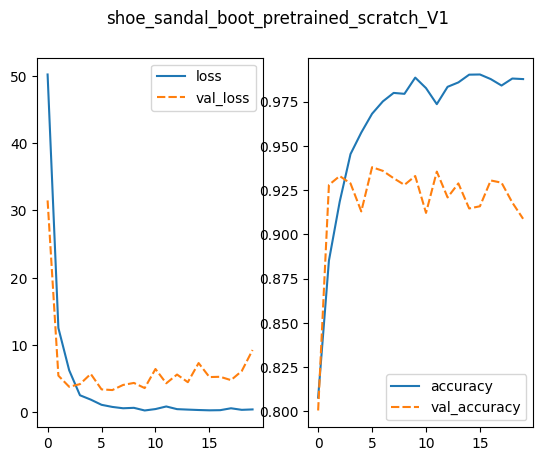

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_scratch_V1_df = pd.DataFrame.from_dict(scratch_V1_history)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_scratch_V1')
sns.lineplot(ax=axes[0], data=history_scratch_V1_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_scratch_V1_df[['accuracy', 'val_accuracy']])

Analizando el gráfico obtenemos varias conclusiones:

1. Pérdida del entrenamiento:  La pérdida de entrenamiento disminuye de manera consistente, lo que indica que el modelo está mejorando en términos de ajuste a los datos.
2. Pérdida de la validación:  La pérdida de validación disminuye de manera consistente en las primeras épocas, pero luego se vuelve irregular, lo que indica que el modelo se está sobrajustando y no generaliza del todo bien los nuevos datos.
3. Precisión del entrenamiento: La precisión del entrenamiento parece aumentar rápidamente durante las primeras épocas, lo que indica que el modelo está aprendiendo bien los datos de entrenamiento.
4.   Precisión de la validación: La precisión de la validación aumenta inicialmente. Sin embargo, a medida que avanza el entrenamiento, la precisión de la validación parece estancarse o incluso disminuir, lo que puede tener dos razones: el modelo es demasiado simple y no generaliza bien o el modelo puede estar sobreajustando los datos de entrenamiento.



##### 4.1.2.3 Métricas de rendimiento: modelo scratch_V1

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss, val_accuracy = scratch_V1.evaluate(validation_generator) #steps=len(validation_generator)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

75/75 [==============================] - 7s 68ms/step - loss: 9.8797 - accuracy: 0.9050
Validation Loss: 9.879728317260742
Validation Accuracy: 0.9049999713897705


Estos valores indican que, al evaluar tu modelo en el conjunto de datos de validación después del entrenamiento, el modelo obtiene una pérdida de de 9.248 y una precisión de aproximadamente el 90.9%. Esto significa que, para ser un modelo tan sencillo, tiene un rendimiento bastante bueno en la tarea de clasificación, pero aún puede haber espacio para mejorar, por ejemplo, el overfitting.

### 4.1.3. Construir una CNN algo más compleja: scratch_V2

Vamos a crear un segundo modelo, algo más compleja ya que se pretende mejorar la precisión del modelo. Mantenemos la mayoría de hiperaparametros.


*   Base model: compuesto dos bloques convolucionales. El primero de ellos contiene dos capas convolucionales con 32 filtros y un maxpooling de 2x2. La activación ReLU se aplica después de la convolución para introducir no linealidades en la red. El segundo de ellos tiene la misma estructura pero se usan 64 filtros.

*   Top model: se mantiene igual.








In [ ]:
scratch_V2 = Sequential()

########################## BASE MODEL ###############
#BLOQUE CONVOLUCIONAL 1
scratch_V2.add(layers.Conv2D(32,(3,3),input_shape=(256,256,3),activation='relu'))
scratch_V2.add(layers.Conv2D(32,(3,3),activation='relu'))
scratch_V2.add(layers.MaxPooling2D((2,2)))

#BLOQUE CONVOLUCIONAL 2
scratch_V2.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2.add(layers.MaxPooling2D((2,2)))

########################## TOP MODEL ######
scratch_V2.add(layers.Flatten())
scratch_V2.add(layers.Dense(128,activation='relu'))
scratch_V2.add(layers.Dense(3,activation='softmax'))
# Compilar el modelo
scratch_V2.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )
scratch_V2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 252, 252, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 126, 126, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 124, 124, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 122, 122, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 61, 61, 64)        0         
 g2D)                                                   

### 4.1.4. Entrenar una red neuronal convolucional: scratch_V2


In [ ]:
# Entrenar el modelo
#history_scratch_V2 = scratch_V2.fit(
 #   train_generator,
  #  epochs=20,
   # validation_data=validation_generator,
    #)

Epoch 1/20
300/300 [==============================] - 62s 172ms/step - loss: 2.3431 - accuracy: 0.8543 - val_loss: 0.2126 - val_accuracy: 0.9279
Epoch 2/20
300/300 [==============================] - 46s 155ms/step - loss: 0.0674 - accuracy: 0.9783 - val_loss: 0.1765 - val_accuracy: 0.9379
Epoch 3/20
300/300 [==============================] - 51s 170ms/step - loss: 0.0146 - accuracy: 0.9962 - val_loss: 0.1654 - val_accuracy: 0.9508
Epoch 4/20
300/300 [==============================] - 48s 158ms/step - loss: 0.0043 - accuracy: 0.9998 - val_loss: 0.1776 - val_accuracy: 0.9517
Epoch 5/20
300/300 [==============================] - 72s 240ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.1823 - val_accuracy: 0.9538
Epoch 6/20
300/300 [==============================] - 57s 189ms/step - loss: 6.3125e-04 - accuracy: 1.0000 - val_loss: 0.2189 - val_accuracy: 0.9504
Epoch 7/20
300/300 [==============================] - 51s 171ms/step - loss: 3.7340e-04 - accuracy: 1.0000 - val_loss: 0.2000 

#####  4.1.4.1. Guardar y subir el modelo y el historial de un entrenamiento: modelo scratch_V2

In [ ]:
# # Guardar el modelo en formato HDF5
#scratch_V2.save(BASE_FOLDER+"scratch_V2.h5") #(X)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo JSON
#with open(BASE_FOLDER + 'scratch_V2.json', 'w') as f:
    #json.dump(history_scratch_V2.history, f)

In [ ]:
# Cargar el modelo
scratch_V2= load_model(BASE_FOLDER + "scratch_V2.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'scratch_V2.json', 'r') as f:
    history_scratch_V2= json.load(f)


#### 4.1.4.2. Monitorizar el proceso de entrenamiento (Evaluación del modelo durante el entrenamiento): modelo scratch_V2

<Axes: >

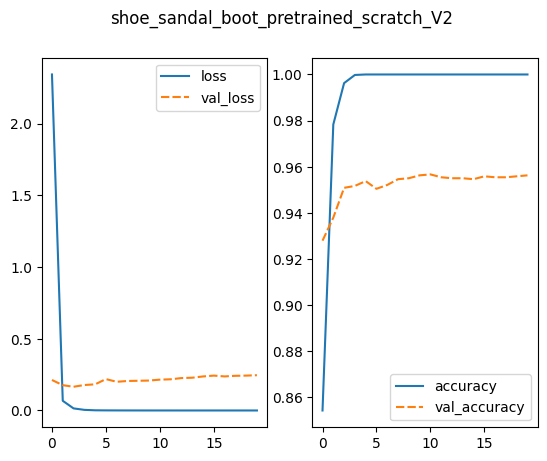

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_scratch_V2_df = pd.DataFrame.from_dict(history_scratch_V2)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('scratch_V2')
sns.lineplot(ax=axes[0], data=history_scratch_V2_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_scratch_V2_df[['accuracy', 'val_accuracy']])

#### 4.1.4.3 Métricas de rendimiento: modelo scratch_V2

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss, val_accuracy = scratch_V2.evaluate(validation_generator) #steps=len(validation_generator)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

75/75 [==============================] - 8s 76ms/step - loss: 0.2447 - accuracy: 0.9546
Validation Loss: 0.24474571645259857
Validation Accuracy: 0.9545833468437195


Vemos como el número de parámetros aumenta, ya que hemos aumentado la profundidad de la red.

Hemos conseguido nuestro objetivo que era mejorar el accuracy del modelo. Ahora tenemos una precisión de 95%. Sin embargo, se detecta un claro overfitting.

A continuación, analizamos de manera más concreta la información que nos da el gráfico. Por un lado, nos fijamos en la pérdida y el accuacy del conjunto de entrenamiento. Vemos como la pérdida cae rápidamente y de manera constante, tomando un valor extremadamente bajo en las primeras etapas del entrenamiento, lo cual es una señal positiva. Además, el accuracy también es muy alto, alcanzando el 100% al final del entrenamiento. Esto indica que el modelo está aprendiendo muy bien los datos de entrenamiento.

Por otro lado, evaluamos lo relativo al conjunto de validación. La pérdida disminuye inicialmente, pero luego parece estabilizarse o aumentar ligeramente después de cierto punto, lo que puede indicar que el modelo comienza a sobreajustarse a los datos de entrenamiento. Aunque el accuracy sigue siendo bastante alto, lo que sugiere que el modelo generaliza bien a datos no vistos.

Por último, se aprecia claramente modelo podría haber convergido después de unas pocas épocas, dada la disminución de la pérdida y el aumento del accuracy. Continuar entrenando más allá de este punto podría llevar a un sobreajuste mayor. Es necesario reducir el número de épocas.

En resumen, parece que este segundo modelo es mejor que el anterior. Aunque es computacionalmente más costoso, debido al aumento de parámetros entregables. El modelo ha aprendido relativamente bien datos de entrenamiento y generaliza bien a datos no vistos, pero podría haber cierto grado de sobreajuste, ya que la pérdida en los datos de validación comienza a estabilizarse. Se propone disminuir el número de épocas y aplicar distintas técnicas para tratar el overfitting.

### 4.1.5. Gestión de overfitting con dropout: scratch_V2_dropout

Vamos a intentar probar diferentes técnicas para lidiar con el overfitting, a la vez que intentamos mejorar el accuracy. Para ello, aplicamos drop out y reducimos el número de parámetros sustituyendo una de las capas pooling con una capa pooling más agresiva, con un tamaño de 3x3. Ha sido necesario bajar el número de épocas a 16 (Google Colab no permitía un entrenamiento más largo, para este modelo). Añadimos shuflle en el entrenamiiento de la red neuronal, para que se cambie el oriden aleatoriamente de los datos de entrenamiento antes de cada época.

In [ ]:
from tensorflow.keras.layers import Dropout

scratch_V2_aug_dropout = Sequential()

# BLOQUE CONVOLUCIONAL 1
scratch_V2_aug_dropout.add(layers.Conv2D(32,(3,3),input_shape=(256,256,3),activation='relu'))
scratch_V2_aug_dropout.add(layers.Conv2D(32,(3,3),activation='relu'))
scratch_V2_aug_dropout.add(layers.MaxPooling2D((2,2)))

# BLOQUE CONVOLUCIONAL 2
scratch_V2_aug_dropout.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2_aug_dropout.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2_aug_dropout.add(layers.MaxPooling2D((3,3)))

# Aplicar Dropout después de la última capa convolucional)
scratch_V2_aug_dropout.add(Dropout(0.2))

# TOP MODEL
scratch_V2_aug_dropout.add(layers.Flatten())
scratch_V2_aug_dropout.add(layers.Dense(128,activation='relu'))
scratch_V2_aug_dropout.add(layers.Dense(3,activation='softmax'))

# Compilar el modelo
scratch_V2_aug_dropout.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

scratch_V2_aug_dropout.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 conv2d_5 (Conv2D)           (None, 252, 252, 32)      9248      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 126, 126, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 124, 124, 64)      18496     
                                                                 
 conv2d_7 (Conv2D)           (None, 122, 122, 64)      36928     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 40, 40, 64)        0         
 g2D)                                                 

### 4.1.6. Entrenar una red neuronal convolucional: scratch_V2_dropout


In [ ]:
# Entrenar el modelo
#history_scratch_V2_aug_dropout = scratch_V2_aug_dropout.fit(train_generator, epochs=16, validation_data=validation_generator, shuffle=True)


Epoch 1/16
300/300 [==============================] - 80s 260ms/step - loss: 2.1460 - accuracy: 0.8246 - val_loss: 0.1465 - val_accuracy: 0.9475
Epoch 2/16
300/300 [==============================] - 63s 209ms/step - loss: 0.1835 - accuracy: 0.9364 - val_loss: 0.1350 - val_accuracy: 0.9533
Epoch 3/16
300/300 [==============================] - 63s 209ms/step - loss: 0.1079 - accuracy: 0.9606 - val_loss: 0.1639 - val_accuracy: 0.9479
Epoch 4/16
300/300 [==============================] - 67s 222ms/step - loss: 0.0623 - accuracy: 0.9790 - val_loss: 0.1157 - val_accuracy: 0.9638
Epoch 5/16
300/300 [==============================] - 68s 225ms/step - loss: 0.0420 - accuracy: 0.9873 - val_loss: 0.1768 - val_accuracy: 0.9479
Epoch 6/16
300/300 [==============================] - 63s 211ms/step - loss: 0.0264 - accuracy: 0.9924 - val_loss: 0.1220 - val_accuracy: 0.9629
Epoch 7/16
300/300 [==============================] - 62s 208ms/step - loss: 0.0190 - accuracy: 0.9947 - val_loss: 0.1405 - val_ac

#####  4.1.6.1. Guardar y subir el modelo y el historial de un entrenamiento: modelo scratch_V2_dropout

In [ ]:
# # Guardar el modelo en formato HDF5
#scratch_V2_aug_dropout.save(BASE_FOLDER+"scratch_V2_dropout.h5") #(X)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo JSON
#with open(BASE_FOLDER+'scratch_V2_dropout.json', 'w') as f:
    #json.dump(history_scratch_V2_dropout.history, f)

In [ ]:
# Cargar el modelo
scratch_V2_dropout = load_model(BASE_FOLDER + "scratch_V2_dropout.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'scratch_V2_dropout.json', 'r') as f:
    history_scratch_V2_dropout= json.load(f)

#### 4.1.6.2. Monitorizar el proceso de entrenamiento (Evaluación del modelo durante el entrenamiento): modelo scratch_V2_dropout

<Axes: >

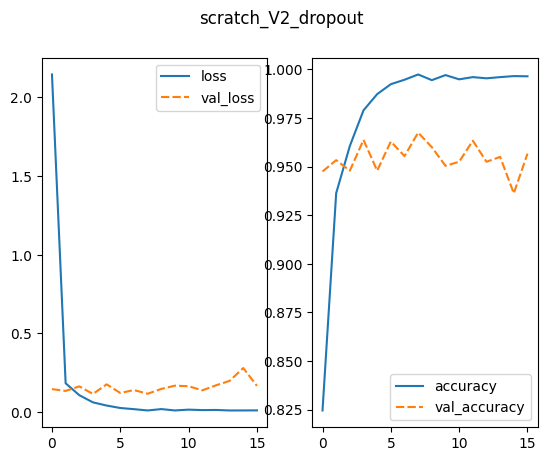

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_scratch_V2_dropoutdf = pd.DataFrame.from_dict(history_scratch_V2_dropout)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('scratch_V2_dropout')
sns.lineplot(ax=axes[0], data=history_scratch_V2_dropoutdf[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_scratch_V2_dropoutdf[['accuracy', 'val_accuracy']])

#### 4.1.6.3 Métricas de rendimiento: modelo scratch_V2_dropout

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss, val_accuracy = scratch_V2_dropout.evaluate(validation_generator)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

75/75 [==============================] - 16s 152ms/step - loss: 0.1753 - accuracy: 0.9554
Validation Loss: 0.17530940473079681
Validation Accuracy: 0.9554166793823242


Hemos mejorado las métricas de pérdida y la accuracy, considerablemente. Se detecta algo de overfitting. Es decir, la utilización el dropout no ha sido suficiente para eliminar el overfitting completamente. En el gráfico del accuracy se ve como la métrica correspondiente a los datos de entrenamiento va aumentando, mientras la de validación se comporta irregularmente. Por ello, se considera necesario probar más medidas para la gestión del overfitting. Aún así, el modelo obtiene unas métricas de evaluación bastante buenas, ya que el modelo es capaz de clasificar correctamente el 95.54% de los datos de validación.


### 4.1.7 Aplicar Data Augmentation: scratch_V2_augmentation_v2

Una de las técnicas más utilizada para evitar el overfitting es 'Data Augmentation' que consiste en aplicar transformaciones simples y aleatorias a los datos de entrenamiento existentes para crear nuevas instancias que son variantes realistas de los datos originales.

In [ ]:
# Generador de imágenes para entrenamiento y prueba con data augmentation
train_datagen_augmentation = ImageDataGenerator(
    preprocessing_function=preprocess_input, # Preprocesamiento empleado en ResNet
    rotation_range=15,          # Rotación aleatoria en el rango de 0 a 15 grados
    width_shift_range=0.2,      # Desplazamiento aleatorio horizontal
    height_shift_range=0.2,     # Desplazamiento aleatorio vertical
    shear_range=0.2,            # Cizallamiento aleatorio
    zoom_range=0.2,             # Zoom aleatorio
    horizontal_flip=True,       # Volteo horizontal aleatorio
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Imágenes de entrenamiento con data augmentation
train_generator_augmentation_32 = train_datagen_augmentation.flow_from_directory(
    train_dir,
    class_mode='categorical',
    batch_size=32,
    shuffle=True
)

# Imágenes de validación sin data augmentation
val_generator_32 = test_datagen.flow_from_directory(
    val_dir,
    class_mode='categorical',
    batch_size=32,
)

# Imágenes de prueba sin data augmentation
test_generator_32 = test_datagen.flow_from_directory(
    test_dir,
    class_mode='categorical',
    batch_size=32
)

De cara a ver el impacto que tiene la técnica Data Augmentation por si misma, se han eliminado los cambios aplicados en el modelo scratch_V2_dropout. Es decir, esta modelo es el mismo que scratch_V2 pero entrenandolo con los datos tras realizarles el aumento.

In [ ]:
scratch_V2_augmentation_v2 = Sequential()

########################## BASE MODEL ###############
#BLOQUE CONVOLUCIONAL 1
scratch_V2_augmentation_v2.add(layers.Conv2D(32,(3,3),input_shape=(256,256,3),activation='relu'))
scratch_V2_augmentation_v2.add(layers.Conv2D(32,(3,3),activation='relu'))
scratch_V2_augmentation_v2.add(layers.MaxPooling2D((2,2)))

#BLOQUE CONVOLUCIONAL 2
scratch_V2_augmentation_v2.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2_augmentation_v2.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2_augmentation_v2.add(layers.MaxPooling2D((2,2)))


########################## TOP MODEL ######
scratch_V2_augmentation_v2.add(layers.Flatten())
scratch_V2_augmentation_v2.add(layers.Dense(128,activation='relu'))
scratch_V2_augmentation_v2.add(layers.Dense(3,activation='softmax'))
# Compilar el modelo
scratch_V2_augmentation_v2.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )
scratch_V2_augmentation_v2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 252, 252, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 126, 126, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 124, 124, 64)      18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 122, 122, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 61, 61, 64)        0         
 g2D)                                                   

### 4.1.8. Entrenar una red neuronal convolucional: scratch_V2_augmentation_v2


In [ ]:
# Entrena tu modelo utilizando el generador de datos aumentados
# history_scratch_V2_augmentation= scratch_V2_augmentation_v2.fit(train_generator_augmentation_32, epochs=16, validation_data=val_generator_32, shuffle=True)

Epoch 1/16
329/329 [==============================] - 229s 645ms/step - loss: 4.8091 - accuracy: 0.6083 - val_loss: 0.6080 - val_accuracy: 0.7364
Epoch 2/16
329/329 [==============================] - 213s 648ms/step - loss: 0.6821 - accuracy: 0.7028 - val_loss: 0.5156 - val_accuracy: 0.7898
Epoch 3/16
329/329 [==============================] - 206s 625ms/step - loss: 0.5833 - accuracy: 0.7511 - val_loss: 0.4492 - val_accuracy: 0.8080
Epoch 4/16
329/329 [==============================] - 216s 656ms/step - loss: 0.5515 - accuracy: 0.7673 - val_loss: 0.4250 - val_accuracy: 0.8240
Epoch 5/16
329/329 [==============================] - 209s 636ms/step - loss: 0.5150 - accuracy: 0.7929 - val_loss: 0.4244 - val_accuracy: 0.8324
Epoch 6/16
329/329 [==============================] - 210s 637ms/step - loss: 0.4884 - accuracy: 0.8040 - val_loss: 0.3739 - val_accuracy: 0.8378
Epoch 7/16
329/329 [==============================] - 205s 622ms/step - loss: 0.4657 - accuracy: 0.8118 - val_loss: 0.3109 -

#### 4.1.8.1. Guardar y subir el modelo y el historial de un entrenamiento: modelo scratch_V2_augmentation_v2

In [ ]:
# # Guardar el modelo en formato HDF5
# scratch_V2_augmentation_v2.save(BASE_FOLDER+"scratch_V2_augmentation_v2.h5") #(X)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo JSON
# with open(BASE_FOLDER+'scratch_V2_augmentation_v2.json', 'w') as f:
    # json.dump(history_scratch_V2_augmentation.history, f)

In [ ]:
# Cargar el modelo
scratch_V2_augmentation_v2 = load_model(BASE_FOLDER + "scratch_V2_augmentation_v2.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'scratch_V2_augmentation_v2.json', 'r') as f:
    history_scratch_V2_augmentation_v2= json.load(f)

#### 4.1.8.2. Monitorizar el proceso de entrenamiento (Evaluación del modelo durante el entrenamiento): modelo scratch_V2_augmentation_v2

<Axes: >

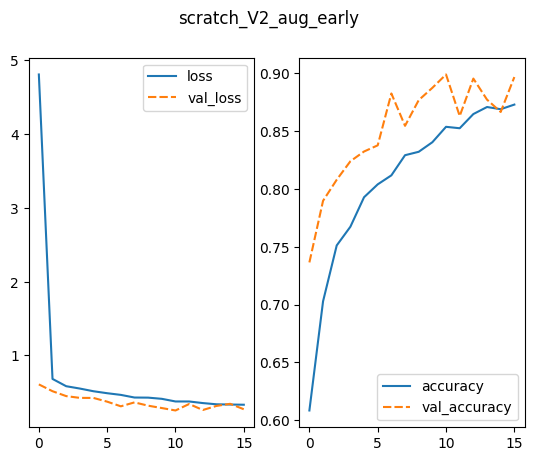

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_scratch_V2_augmentation_v2df = pd.DataFrame.from_dict(history_scratch_V2_augmentation_v2)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('scratch_V2_augmentation_v2')
sns.lineplot(ax=axes[0], data=history_scratch_V2_augmentation_v2df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_scratch_V2_augmentation_v2df[['accuracy', 'val_accuracy']])

Ambos gráficos muestran claramente que al usar Data Augmentation, se ha eliminado el overfitting. Sin embargo, el hecho de que la pérdida de validación sea más baja que la de entrenamiento y que el accuracy de validación sea más grande que el de entrenamiento nos llevan a concluir que este modelo sufre de underfitting. Es decir, hemos cambiado tanto los datos de entrada que el modelo es demasiado simple para aprenderlos por completo.

#### 4.1.8.3 Métricas de rendimiento: modelo scratch_V2_augmentation_v2

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss, val_accuracy = scratch_V2_augmentation_v2.evaluate(val_generator_32) #steps=len(validation_generator)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

71/71 [==============================] - 13s 184ms/step - loss: 0.2711 - accuracy: 0.8969
Validation Loss: 0.27113795280456543
Validation Accuracy: 0.8968889117240906


Tal y como se detectaba en los gráficos, los resultados son peores que los obtenidos en los modelos anteriores, pero son interesantes para nuestro análisis. Vemos como al usar Data Augmentation desaparece el overfitting, dando lugar al underfitting. Se podría decir que el modelo no aprende del todo bien los datos de entrenamiento y esto hace que se pierda también la capacidad de generalización, ya que no se ha entrenado el modelo lo suficientemente bien. Una posible solución sería complicar el modelo aumentando el número de capas ocultas. Descartamos este modelo.

### 4.1.9. Gestión del Overfitting: scratch_V2_aug_early

En este modelo se van a añadir capas de Batch Normalization, para mejorar la estabilidad y el rendimiento del modelo durante el entrenamiento. Además, en vez de determinar un número de épocas "a ojo" utilizaremos la técnica early stopping. Esta técnica evita el sobreajuste y mejora la generalización del modelo. Utilizaremos Data Augmentation para evitar el overfitting. Por último, sustituimos la capa Flatten por un Globalmaxpooling que reduce el número de parámetros.

In [ ]:
from tensorflow.keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.layers import GlobalMaxPooling2D

scratch_V2_aug_early = Sequential()

# BLOQUE CONVOLUCIONAL 1
scratch_V2_aug_early.add(layers.Conv2D(32,(3,3),input_shape=(256,256,3),activation='relu'))
scratch_V2_aug_early.add(layers.Conv2D(32,(3,3),activation='relu'))
scratch_V2_aug_early.add(BatchNormalization())
scratch_V2_aug_early.add(layers.MaxPooling2D((2,2)))

# BLOQUE CONVOLUCIONAL 2
scratch_V2_aug_early.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2_aug_early.add(BatchNormalization())
scratch_V2_aug_early.add(layers.Conv2D(64,(3,3),activation='relu'))
scratch_V2_aug_early.add(BatchNormalization())
scratch_V2_aug_early.add(layers.MaxPooling2D((3,3)))

# Aplicar Dropout después de la última capa convolucional)
scratch_V2_aug_early.add(Dropout(0.2))

# TOP MODEL
scratch_V2_aug_early.add(GlobalMaxPooling2D())
scratch_V2_aug_early.add(layers.Dense(128,activation='relu'))
scratch_V2_aug_early.add(BatchNormalization())
scratch_V2_aug_early.add(layers.Dense(3,activation='softmax'))

# Compilar el modelo
scratch_V2_aug_early.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

scratch_V2_aug_early.summary()


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 254, 254, 32)      896       
                                                                 
 conv2d_23 (Conv2D)          (None, 252, 252, 32)      9248      
                                                                 
 batch_normalization_10 (Ba  (None, 252, 252, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 126, 126, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_24 (Conv2D)          (None, 124, 124, 64)      18496     
                                                                 
 batch_normalization_11 (Ba  (None, 124, 124, 64)     

### 4.1.10. Entrenar una red neuronal convolucional: scratch_V2_aug_early


Definimos el Early Stopping, que se usará durante el entrenamiento de la red neuronal definida en el apartado anterior. Esta técnica se utiliza para monitorear la pérdida en el conjunto de validación (val_loss) y detener el entrenamiento si no hay mejora después de 5 épocas (patience=5). Además, restaura los pesos del modelo al mejor modelo encontrado durante el entrenamiento (restore_best_weights=True).

In [ ]:
# Definir Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',  # Monitoriza la pérdida en el conjunto de validación
    patience=5,           # Detiene el entrenamiento si no hay mejora después de 5 épocas
    restore_best_weights=True  # Restaura los pesos del modelo al mejor modelo encontrado
)

In [ ]:
# Entrenar el modelo con Early Stopping
history_scratch_V2_aug_early = scratch_V2_aug_early.fit(
    train_generator_augmentation_32,
    epochs=100,  # Número máximo de épocas
    validation_data=val_generator_32,
    callbacks=[early_stopping]  # Se pasa Early Stopping como una lista de callbacks
, shuffle=True)


Epoch 1/100
329/329 [==============================] - 273s 640ms/step - loss: 0.9531 - accuracy: 0.5609 - val_loss: 0.8091 - val_accuracy: 0.6462
Epoch 2/100
329/329 [==============================] - 205s 623ms/step - loss: 0.7795 - accuracy: 0.6551 - val_loss: 0.7069 - val_accuracy: 0.7000
Epoch 3/100
329/329 [==============================] - 201s 611ms/step - loss: 0.6888 - accuracy: 0.7023 - val_loss: 0.6402 - val_accuracy: 0.7449
Epoch 4/100
329/329 [==============================] - 207s 629ms/step - loss: 0.5974 - accuracy: 0.7549 - val_loss: 0.5365 - val_accuracy: 0.8000
Epoch 5/100
329/329 [==============================] - 206s 625ms/step - loss: 0.5327 - accuracy: 0.7830 - val_loss: 0.5185 - val_accuracy: 0.7973
Epoch 6/100
329/329 [==============================] - 207s 629ms/step - loss: 0.4701 - accuracy: 0.8094 - val_loss: 0.4725 - val_accuracy: 0.8156
Epoch 7/100
329/329 [==============================] - 203s 615ms/step - loss: 0.4386 - accuracy: 0.8236 - val_loss: 0

##### 4.1.10.1. Guardar y subir el modelo y el historial de un entrenamiento: modelo scratch_V2

In [ ]:
# # Guardar el modelo en formato HDF5
s# cratch_V2_aug_early.save(BASE_FOLDER+"scratch_V2_aug_early.h5") #(X)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo JSON
# with open(BASE_FOLDER+'scratch_V2_aug_early.json', 'w') as f:
    # json.dump(history_scratch_V2_aug_early.history, f)

In [ ]:
# Cargar el modelo
scratch_V2_aug_early = load_model(BASE_FOLDER + "scratch_V2_aug_early.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'scratch_V2_aug_early.json', 'r') as f:
    history_scratch_V2_aug_early= json.load(f)

##### 4.1.10.2. Monitorizar el proceso de entrenamiento (Evaluación del modelo durante el entrenamiento): modelo scratch_V2_aug_early

<Axes: >

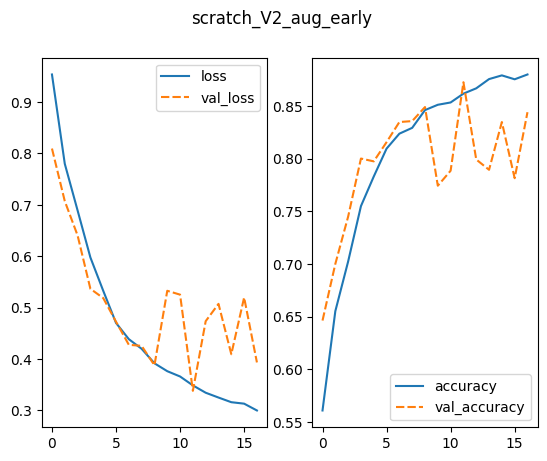

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_scratch_V2_aug_earlydf = pd.DataFrame.from_dict(history_scratch_V2_aug_early)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('scratch_V2_aug_early')
sns.lineplot(ax=axes[0], data=history_scratch_V2_aug_earlydf[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_scratch_V2_aug_earlydf[['accuracy', 'val_accuracy']])

Se detecta un leve overfiting, pero teniendo en cuenta la escala de los gráficos no es algo desmesurado. Lo preocupante es que el accuracy es bastante bajo en comparación con el obtenido en el mejor modelo hasta el momento, el modelo scratch_V2_dropout tenía un accuracy de 0.95.

##### 4.1.10.3. Métricas de rendimiento: scratch_V2_aug_early

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss, val_accuracy = scratch_V2_aug_early.evaluate(validation_generator_augmentation) #steps=len(validation_generator)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

75/75 [==============================] - 41s 545ms/step - loss: 0.3574 - accuracy: 0.8575
Validation Loss: 0.3574303090572357
Validation Accuracy: 0.8575000166893005


Tanto la pérdida como la accuracy de los datos de validación han empeorado.  Descartamos este modelo ya que scratch_V2_dropout obtiene mejores resultados.

### 4.1.11. Añadir padding e inicializador de pesos: scratch_V2_aug_he_normal

En este modelo vamos a combinar la mayoría de técnicas usadas previamente.  Nuestro base model va a estar formado por dos bloques convolucionales parecidos. Se componen de dos capas convolucionales y a cada uan de ellas le sigue un BatchNormalization y un Pooling 2x2. Al final de cada bloque hemos añadido un dropout de 40%.

Además, se ha añadido un inicializador de kernel en cada una de las capas densas. Con esto se pretende mantener la varianza de las activaciones a lo largo de las capas de la red, lo que puede ayudar a mejorar el entrenamiento y la convergencia de la red neuronal. También se ha añadido la opción padding='same', para mantener la información espacial de la entrada al aplicar el filtro de convolución.

In [ ]:
scratch_V2_aug_he_normal = Sequential()

# BLOQUE CONVOLUCIONAL 1
scratch_V2_aug_he_normal.add(layers.Conv2D(32,(3,3),input_shape=(256,256,3),activation='relu', kernel_initializer=he_normal()))
scratch_V2_aug_he_normal.add(layers.MaxPooling2D(pool_size=(2, 2),padding='same'))
scratch_V2_aug_he_normal.add(BatchNormalization())
scratch_V2_aug_he_normal.add(layers.Conv2D(32,(3,3),activation='relu',kernel_initializer=he_normal()))
scratch_V2_aug_he_normal.add(layers.MaxPooling2D(pool_size=(2, 2),padding='same'))
scratch_V2_aug_he_normal.add(BatchNormalization())
scratch_V2_aug_he_normal.add(Dropout(0.4))

# BLOQUE CONVOLUCIONAL 2
scratch_V2_aug_he_normal.add(layers.Conv2D(64,(3,3),activation='relu',kernel_initializer=he_normal()))
scratch_V2_aug_he_normal.add(layers.MaxPooling2D(pool_size=(2, 2),padding='same'))
scratch_V2_aug_he_normal.add(BatchNormalization())
scratch_V2_aug_he_normal.add(layers.Conv2D(64,(3,3),activation='relu',kernel_initializer=he_normal()))
scratch_V2_aug_he_normal.add(layers.MaxPooling2D(pool_size=(2, 2),padding='same'))
scratch_V2_aug_he_normal.add(BatchNormalization())
scratch_V2_aug_he_normal.add(Dropout(0.4))


# TOP MODEL
scratch_V2_aug_he_normal.add(GlobalMaxPooling2D())
scratch_V2_aug_he_normal.add(layers.Dense(128, activation='relu',kernel_initializer=he_normal()))
scratch_V2_aug_he_normal.add(Dense(64,activation="relu"))
scratch_V2_aug_he_normal.add(layers.Dense(3, activation='softmax',kernel_initializer=he_normal(),))


scratch_V2_aug_he_normal.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

scratch_V2_aug_he_normal.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 127, 127, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 63, 63, 32)        0         
 g2D)                                                            
                                                        

### 4.1.12. Entrenar una red neuronal convolucional: scratch_V2_aug_he_normal


In [ ]:
#Complie
scratch_V2_aug_he_normal.compile(loss = 'categorical_crossentropy',
                optimizer = 'Adam',
                metrics = ['accuracy'])

In [ ]:
# Entrenar el modelo con Early Stopping
# history_scratch_V2_aug_he_normal = scratch_V2_aug_he_normal.fit(
     #  train_generator_augmentation_32,
    # epochs=100,  # Número máximo de épocas
    # validation_data=val_generator_32,
    # callbacks=[early_stopping]  # Se pasa Early Stopping como una lista de callbacks
# , shuffle=True)

Epoch 1/100
329/329 [==============================] - 188s 543ms/step - loss: 0.7960 - accuracy: 0.6732 - val_loss: 0.5838 - val_accuracy: 0.7849
Epoch 2/100
329/329 [==============================] - 179s 543ms/step - loss: 0.5331 - accuracy: 0.7836 - val_loss: 0.4614 - val_accuracy: 0.8324
Epoch 3/100
329/329 [==============================] - 177s 539ms/step - loss: 0.4568 - accuracy: 0.8175 - val_loss: 0.4292 - val_accuracy: 0.8693
Epoch 4/100
329/329 [==============================] - 175s 531ms/step - loss: 0.3970 - accuracy: 0.8396 - val_loss: 0.4182 - val_accuracy: 0.8547
Epoch 5/100
329/329 [==============================] - 179s 545ms/step - loss: 0.3600 - accuracy: 0.8560 - val_loss: 0.4488 - val_accuracy: 0.8169
Epoch 6/100
329/329 [==============================] - 177s 537ms/step - loss: 0.3465 - accuracy: 0.8637 - val_loss: 0.6825 - val_accuracy: 0.6516
Epoch 7/100
329/329 [==============================] - 181s 551ms/step - loss: 0.3244 - accuracy: 0.8758 - val_loss: 0

##### 4.1.12.1. Guardar y subir el modelo y el historial de un entrenamiento: modelo scratch_V2_aug_he_normal

In [ ]:
# Guardar el modelo en formato HDF5
# scratch_V2_aug_he_normal.save(BASE_FOLDER+"scratch_V2_aug_he_normal.h5") #(X)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Guardar el historial de entrenamiento en un archivo JSON
# with open(BASE_FOLDER+'scratch_V2_aug_he_normal.json', 'w') as f:
    # json.dump(history_scratch_V2_aug_he_normal.history, f)

In [ ]:
# Cargar el modelo
 scratch_V2_aug_he_normal = load_model(BASE_FOLDER + "scratch_V2_aug_he_normal.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
 with open(BASE_FOLDER + 'scratch_V2_aug_he_normal.json', 'r') as f:
    history_scratch_V2_aug_he_normal= json.load(f)

##### 4.1.12.2. Monitorizar el proceso de entrenamiento (Evaluación del modelo durante el entrenamiento): modelo scratch_V2_aug_he_normal

<Axes: >

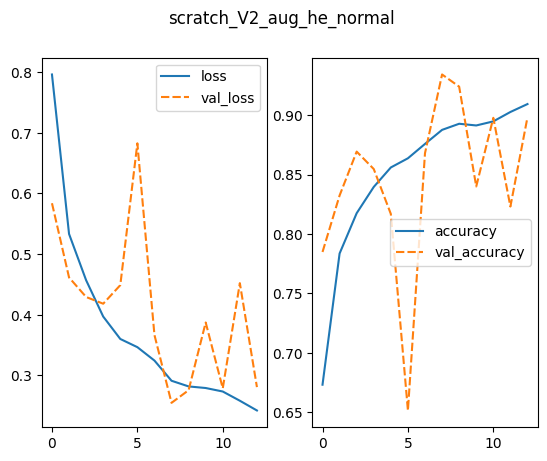

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_scratch_V2_aug_he_normal = pd.DataFrame.from_dict(history_scratch_V2_aug_he_normal)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('scratch_V2_aug_he_normal')
sns.lineplot(ax=axes[0], data=history_scratch_V2_aug_he_normal[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_scratch_V2_aug_he_normal[['accuracy', 'val_accuracy']])

Los gráficos muestran que se ha llegado a un accuracy mejor que en el modelo anterior. Tanto la pérdida como el accuracy tiene muchas irregularidades que parece que a medida que aumentan las épocas disminuyen. Es posible que si siguieramos entrenando se terminarán estabilizando, pero al incluir un erarly stoping con pacience 5 el modelo deja de entrenarse cuando en 5 épocas no ha conseguido resultados mejores.

##### 4.1.12.3. Métricas de rendimiento: scratch_V2_aug_he_normal

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss, val_accuracy = scratch_V2_aug_he_normal.evaluate(val_generator_32)
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)

71/71 [==============================] - 11s 132ms/step - loss: 0.2407 - accuracy: 0.9302
Validation Loss: 0.24073800444602966
Validation Accuracy: 0.93022221326828


Tal y como hemos dicho hemos mejorado las métricas respecto a modelos anteriores, sin llegar a ser tan buenas como el modelo scratch_V2_dropout.

### 4.1.13 Elegir el mejor modelo

Vamos a elegir los dos modelos que mejores resultados nos han dado, vamos a evaluarlos en el conjuto test y elegiremos el que mejor generalice datos nuevos. Teniendo en cuenta las métricas obtenidas en los datos de validación se espera que el modelo scratch_V2_dropout generalice mejor los datos de test. Resumimos los resultados obtenidos mediante una tabla:

| Modelo | Loss | Accuracy |
| --- | --- | --- |
| scratch_V1 | 9,8797 | 0,9049 |  
| scratch_V2 | 0,2447| 0,9545 |
| scratch_V2_dropout | 0,1753 | 0,9554|
| scratch_V2_augmentation_v2 | 0,2711 |0,8968 |
| scratch_V2_aug_early_v2 | 0,3574 | 0,8575|
| scratch_V2_aug_he_normal | 0,2407 | 0,9302|

#### 4.1.13.1 Predicción y evaluación : scratch_V2_aug_he_normal

Características del modelo:


Características del modelo scratch_V2_dropout
*   Batch size: 32

En cuanto a la topología, elegimos una estructura muy simple:

*       Base model: compuesto por dos bloque convolucionales formados por dos capas convolucionales con la función de activación ReLu y un maxPooling de 2x2  (con padding=same) y un batch normalization tras cada una de ellas. El "stride" por defecto es 1 y el "padding" es "valid". En cuanto al kernel usaremos un tamaño 3X3. Por último, la función de activación será la ReLu por la misma razón. Después de cada bloque se realiza un dropout de 40%.

*   Top model: GlobalMaxPoling, y tres densas. Las dos primeras con la función de activación ReLu y otra con softmax para clasificar en tres clases, esta últimam capa estará presente en todos los modelos.

En cada capa se ha usado un inicializador de pesos.

Se ha usado el optimizador Adam con un learning rate de 0.0001.


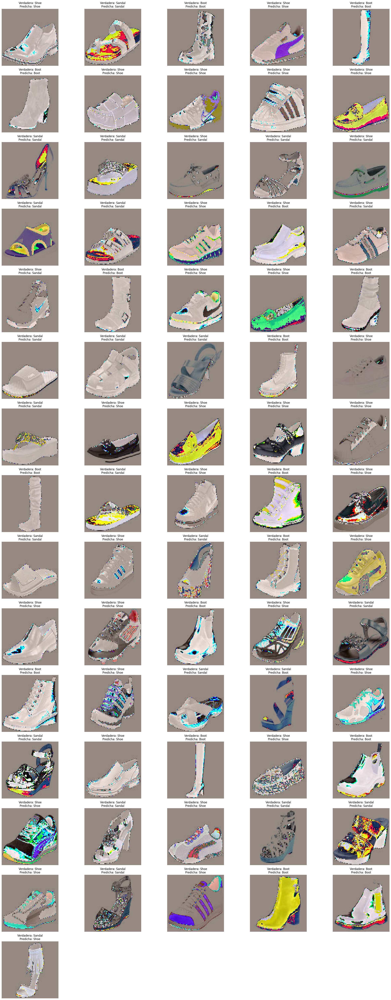

Accuracy: 0.9373333333333334
Precisión: 0.9374915299455141


NameError: name 'recall_score' is not defined

1/1 [==============================] - 0s 48ms/step


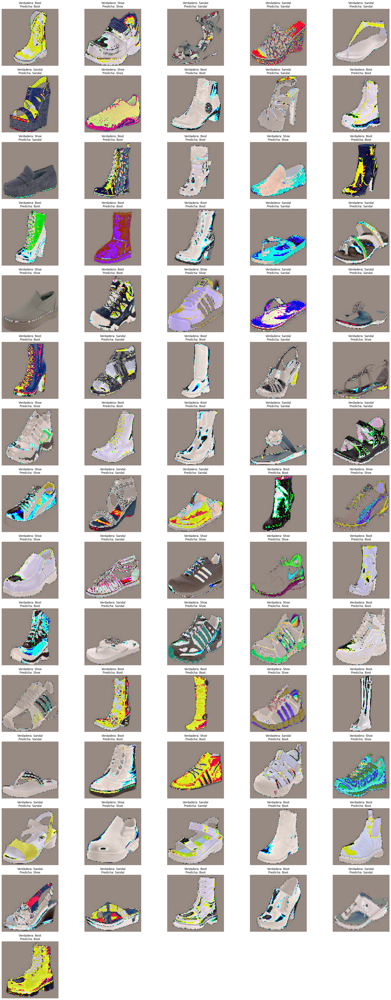

Accuracy: 0.9373333333333334
Precisión: 0.9374915299455141
Recall: 0.9373333333333334
F1-score: 0.9370920770686997
Total predicted images: 2250


In [ ]:
# Restablecer el generador de datos
test_generator_32.reset()

# Definir las etiquetas de clase
class_labels = list(test_generator_32.class_indices.keys())

# Variables para almacenar las predicciones y etiquetas reales
predictions = []
true_labels = []

# Calcular el número de imágenes por batch size
total_images = test_generator_32.n
batch_size = 32
num_images = math.ceil(total_images / batch_size)

# Calcular el número de filas y columnas necesarias
num_rows = math.ceil(num_images / 5)
num_cols = min(num_images, 5)

# Definir el tamaño de la figura basado en el número de filas y columnas
plt.figure(figsize=(5*num_cols, 4*num_rows))

# Iterar sobre las imágenes y obtener las predicciones
for i in range(num_images):
    # Obtener la siguiente imagen del generador
    image, label = next(test_generator_32)

    # Redimensionar la imagen al tamaño esperado por el modelo (Para solucionar el error al no poner un tamaño adecuado en los modelos de fine-tunning)
    image_resized = tf.image.resize(image, (256, 256))

    # Realizar la predicción con el modelo
    prediction = scratch_V2_aug_he_normal.predict(image_resized)

    # Obtener la clase predicha y verdadera
    predicted_class = np.argmax(prediction, axis=1)
    true_class = np.argmax(label, axis=1)

    # Agregar las predicciones y etiquetas reales a las listas
    predictions.extend(predicted_class)
    true_labels.extend(true_class)

    # Convertir la imagen al formato adecuado
    image = image[0]  # Tomar solo la primera imagen del lote
    image = image.astype('uint8')  # Convertir los valores de píxeles a enteros de 8 bits sin signo

    # Obtener la etiqueta predicha y verdadera
    predicted_class_label = class_labels[predicted_class[0]]
    true_class_label = class_labels[true_class[0]]

    # Mostrar la imagen real junto con la etiqueta predicha y la verdadera
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.title(f'Verdadera: {true_class_label}\nPredicha: {predicted_class_label}')
    plt.axis('off')

# Ajustar automáticamente el diseño de la figura
plt.tight_layout()
plt.show()

# Calcular la precisión utilizando accuracy_score
accuracy = accuracy_score(true_labels, predictions)
print(f'Accuracy: {accuracy}')

# Calcular la precisión
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precisión: {precision}')

# Calcular el recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall}')

# Calcular el F1-score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-score: {f1}')

# Calcular el número total de imágenes predichas
total_predicted_images = len(predictions)
print(f'Total predicted images: {total_predicted_images}')


Vemos como obtenemos métriacas relativamente buenas:  

Accuracy: 0.9373333333333334\
Precisión: 0.9374915299455141\
Recall: 0.9373333333333334\
F1-score: 0.9370920770686997

*   El Accuracy nos indica que 93.73% de las predicciones realizadas por el modelo son correctas.
*   El F1-score es del 93.71%. Esto indica que el modelo tiene un buen equilibrio entre la precisión y el recall en la clasificación de las instancias positivas y negativas.

Otra manera de representar los aciertos en las predicciones es mediante una matriz de confusión.

[[735   4  11]
 [ 31 682  37]
 [ 22  36 692]]


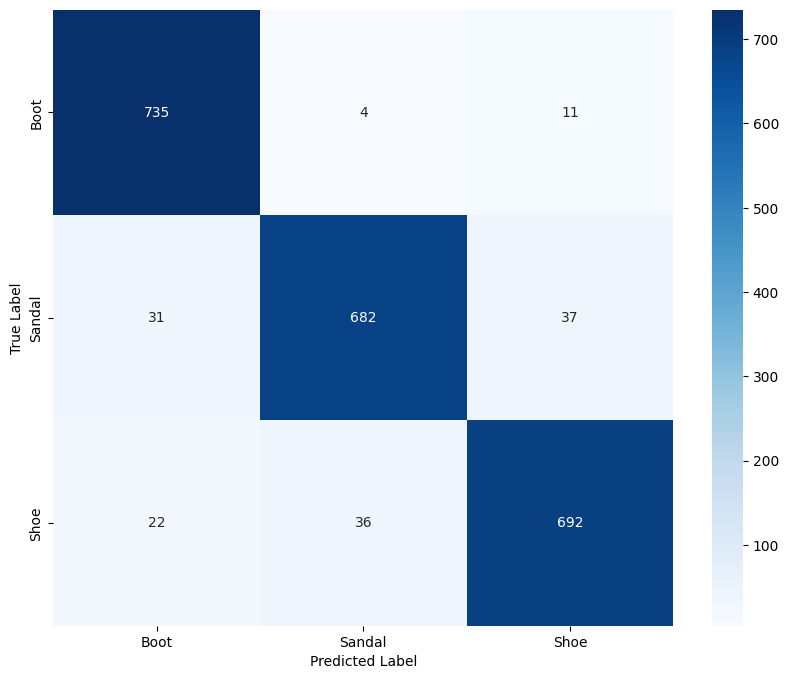

In [ ]:
# Crear la matriz de confusión
conf_matrix = confusion_matrix(true_labels, predictions)
print(conf_matrix)

# Convertir a dataframe
confusion_df = pd.DataFrame(conf_matrix, index=class_labels, columns=class_labels)

# Establecer los nombres de los ejes x e y para mejorar la legibilidad del mapa de calor
confusion_df.index.name = 'True Label'
confusion_df.columns.name = 'Predicted Label'

# Visualizar la matriz de confusión utilizando un mapa de calor de seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues')
plt.show()

La matriz de confusión, al igual que las métricas ya comentadas, dejan ver que a pesar de que nuestro modelo falle en ciertas ocasiones, es capaz de clasificar correctamente la mayoría de las imagenes.

#### 4.1.13.2 Predicción y evaluación : scratch_V2_dropout

Características del modelo scratch_V2_dropout

*   Batch size: 32

En cuanto a la topología, elegimos una estructura muy simple:

*   Base model: compuesto por dos bloque convoluciónal formados por dos capas convolucionales con la función de activación ReLu y un maxPooling de 2x2 tras el primer bloque y uno de 3X3 tras el segundo bloque. El "stride" por defecto es 1 y el "padding" es "valid". En cuanto al kernel usaremos un tamaño 3X3, uno de los más usados. Por último, la función de activación será la ReLu por la misma razón. Después de ambos bloques se realiza un dropout de 20%.

*   Top model: Flatten, y dos densas. Una con activación relu y otra con softmax para clasificar en tres clases, esta últimam capa estará presente en todos los modelos.

Se ha usado el optimizador Adam con un learning rate de 0.0001.

In [ ]:
# Restablecer el generador de datos
test_generator_32.reset()

# Definir las etiquetas de clase
class_labels = list(test_generator_32.class_indices.keys())

# Variables para almacenar las predicciones y etiquetas reales
predictions = []
true_labels = []

# Calcular el número de imágenes por batch size
total_images = test_generator_32.n
batch_size = 32
num_images = math.ceil(total_images / batch_size)

# Calcular el número de filas y columnas necesarias
num_rows = math.ceil(num_images / 5)
num_cols = min(num_images, 5)

# Definir el tamaño de la figura basado en el número de filas y columnas
plt.figure(figsize=(5*num_cols, 4*num_rows))

# Iterar sobre las imágenes y obtener las predicciones
for i in range(num_images):
    # Obtener la siguiente imagen del generador
    image, label = next(test_generator_32)

    # Redimensionar la imagen al tamaño esperado por el modelo
    image_resized = tf.image.resize(image, (256, 256))

    # Realizar la predicción con el modelo
    prediction = scratch_V2_dropout.predict(image_resized)

    # Obtener la clase predicha y verdadera
    predicted_class = np.argmax(prediction, axis=1)
    true_class = np.argmax(label, axis=1)

    # Agregar las predicciones y etiquetas reales a las listas
    predictions.extend(predicted_class)
    true_labels.extend(true_class)

    # Convertir la imagen al formato adecuado
    image = image[0]  # Tomar solo la primera imagen del lote
    image = image.astype('uint8')  # Convertir los valores de píxeles a enteros de 8 bits sin signo

    # Obtener la etiqueta predicha y verdadera
    predicted_class_label = class_labels[predicted_class[0]]
    true_class_label = class_labels[true_class[0]]

    # Mostrar la imagen real junto con la etiqueta predicha y la verdadera
    #  plt.subplot(num_rows, num_cols, i+1)
     # plt.imshow(image)
     # plt.title(f'Verdadera: {true_class_label}\nPredicha: {predicted_class_label}')
     # plt.axis('off')

# Ajustar automáticamente el diseño de la figura
  #plt.tight_layout()
  #plt.show()

# Calcular la precisión utilizando accuracy_score
accuracy = accuracy_score(true_labels, predictions)
print(f'Accuracy: {accuracy}')

# Calcular la precisión
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precisión: {precision}')

# Calcular el recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall}')

# Calcular el F1-score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-score: {f1}')

# Calcular el número total de imágenes predichas
total_predicted_images = len(predictions)
print(f'Total predicted images: {total_predicted_images}')


1/1 [==============================] - 1s 938ms/step
Accuracy: 0.9853333333333333
Precisión: 0.9853415220662676
Recall: 0.9853333333333333
F1-score: 0.985335378745725
Total predicted images: 2250


<Figure size 2500x6000 with 0 Axes>

[[739   7   4]
 [  2 739   9]
 [  6   5 739]]


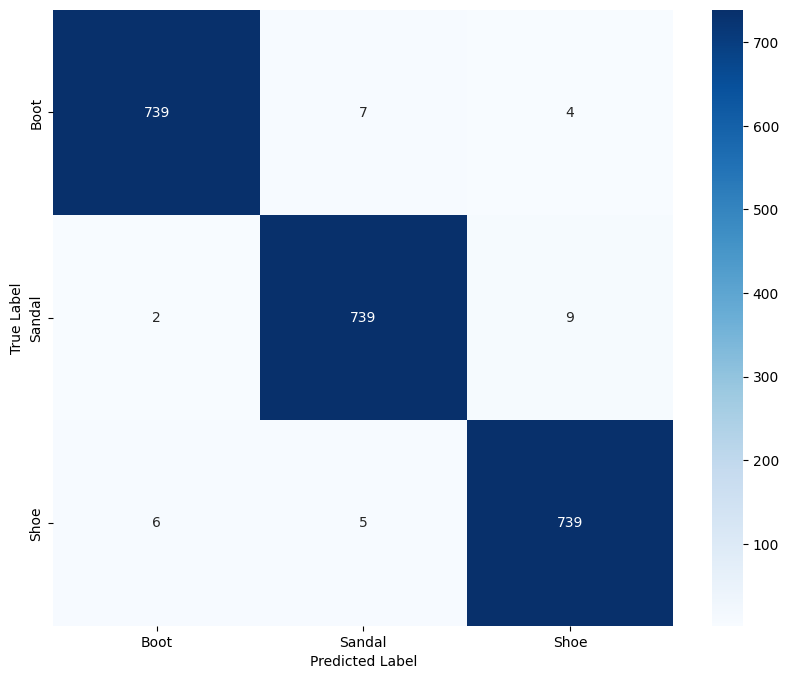

In [ ]:
# Crear la matriz de confusión
conf_matrix = confusion_matrix(true_labels, predictions)
print(conf_matrix)

# Convertir a dataframe
confusion_df = pd.DataFrame(conf_matrix, index=class_labels, columns=class_labels)

# Establecer los nombres de los ejes x e y para mejorar la legibilidad del mapa de calor
confusion_df.index.name = 'True Label'
confusion_df.columns.name = 'Predicted Label'

# Visualizar la matriz de confusión utilizando un mapa de calor de seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues')
plt.show()

Analizamos las métricas de este segundo modelo:

*   Accuracy: El 98.53% de las predicciones realizadas por el modelo son correctas, es decir, la capacidad de predicción de este modelo es mucho mayor que la del modelo anteriormete evaluado.
*   El F1-score es del 98.53% . Esto indica que el equilibrio entre la precisión y el recall en la clasificación de las instancias positivas y negativas es mucho mejor que el del anterior modelo analizado.


En conclusión, el mejor modelo obtenido mediante la estrategia from Scratch es el scratch_V2_dropout. A continuación, se detalla el modelo seleccionado:

Arquitectura:\
BASE MODEL

* Capa convolucional con 32 neuronas, kernel 3x3 y activación ReLu
* Capa convolucional con 32 neuronas, kernel 3x3 y activación ReLu    
* MaxPooling 2x2

* Capa convolucional con 64 neuronas, kernel 3x3 y activación ReLu
* Capa convolucional con 64 neuronas, kernel 3x3 y activación ReLu
* MaxPooling 3x3
* Dropout 20%

TOP MODEL

* Flatten
* Capa densa de 128 neuronas y activación ReLu
* Capa densa de 3 neuronas y activación softmax

Algoritmo de entrenamiento:

* Learning Rate: 0.0001
* Número de épocas: 16
* Batch Size: 32
* Optimizador Adam
* Función de pérdida Categorical Crossentropy

Regularización aplicada:

* Dropout (0.2)

Evaluación:

* Validation Loss: 0.17530940473079681
* Validation Accuracy: 0.9554166793823242


## 4.2. Estrategia 2a: Red pre-entrenada - Transfer Learning (ResNet)

**ResNet**

ResNet es una de las arquitecturas de redes neuronales convolucionales más exitosas y ampliamente utilizadas en la actualidad. Ha demostrado su eficacia en una variedad de conjuntos de datos y tareas de clasificación de imágenes.

 ResNet es una arquitectura muy profunda. Esto le permite capturar características complejas en los datos de imagen, lo que puede ser beneficioso para problemas de clasificación que implican objetos con características detalladas y variadas.

La clave de ResNet es su uso de conexiones residuales, que permiten que los gradientes se propaguen más fácilmente a través de la red durante el entrenamiento. Esto ayuda a mitigar el problema de desvanecimiento de gradientes y facilita el entrenamiento de redes muy profundas.

Al utilizar una versión pre-entrenada de ResNet, se puede aprovechar el conocimiento aprendido por la red en el conjunto de datos ImageNet. Esto puede ser útil ya que la red pre-entrenada puede haber aprendido características generales útiles que se pueden transferir a la tarea específica de clasificación de imágenes de zapatos, sandalias y botas.

### 4.2.1. Construir una CNN

#### 4.2.1.1. Cargar la topología de CNN sin la capa de clasificación final (base model - ResNet)

La red pre-entrenada de ResNet50 espera imágenes de 224x224 píxeles como entrada.

In [ ]:
# documentacion https://keras.io/applications/

# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
    )

base_model_resnet.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                         

#### 4.2.1.2. Crear el top model y congelar todas las capas convolucionales (Transfer Learning)

In [ ]:
# Congelar las capas del modelo base
base_model_resnet.trainable = False

# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_v1 = Sequential(name='ssb_resnet_v1')
sequential_model_resnet_v1.add(base_model_resnet)

In [ ]:
# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_v1.add(Flatten())
sequential_model_resnet_v1.add(Dense(256, activation='relu'))
sequential_model_resnet_v1.add(Dense(3, activation='softmax'))

sequential_model_resnet_v1.summary()

Model: "ssb_resnet_v1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense (Dense)               (None, 256)               25690368  
                                                                 
 dense_1 (Dense)             (None, 3)                 771       
                                                                 
Total params: 49255939 (187.90 MB)
Trainable params: 25691139 (98.00 MB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


### 4.2.2. Compilar y entrenar (fit) una red neuronal convolucional

In [ ]:
# Compilar el modelo
sequential_model_resnet_v1.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_v1 = sequential_model_resnet_v1.fit(
    train_generator_32,
    epochs=100,
    validation_data=val_generator_32,
    callbacks=[early_stopping]
    )
"""

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_v1 = sequential_model_resnet_v1.fit(\n    train_generator_32,\n    epochs=100,\n    validation_data=val_generator_32,\n    callbacks=[early_stopping]\n    )\n"

#### 4.2.2.1. Guardar y subir el modelo y el historial de entrenamiento

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_v1.save(BASE_FOLDER+"ssb_resnet_v1_32_256.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_v1.save(BASE_FOLDER+"ssb_resnet_v1_32_256.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256.json', 'w') as f:
    json.dump(history_resnet_v1.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256.json', 'w') as f:\n    json.dump(history_resnet_v1.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_v1 = load_model(BASE_FOLDER + "ssb_resnet_v1_32_256.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256.json', 'r') as f:
    loaded_history_ssb_resnet_v1 = json.load(f)


#### 4.2.2.2. Monitorizar el proceso de entrenamiento (Evalución del Modelo durante el entrenamiento)

<Axes: >

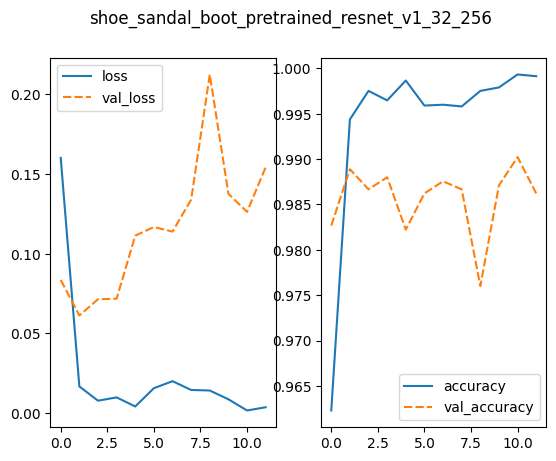

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_ssb_resnet_v1_df = pd.DataFrame.from_dict(loaded_history_ssb_resnet_v1)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_v1_32_256')
sns.lineplot(ax=axes[0], data=history_ssb_resnet_v1_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_ssb_resnet_v1_df[['accuracy', 'val_accuracy']])

In [ ]:
# fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_v1.png')

La *loss curve* debería caer rápidamente en una línea relativamente suave con pocas fluctuaciones o ninguna.  
La *val_loss curve* debería decrecer junto con la *loss curve*.  
La *accuracy* debería aumentar rápidamente en una línea relativamente suave sin apenas fluctuaciones.  
La curva *val_accuracy curve* debería comportarse de forma similar.

En este caso, la pérdida de entrenamiento sigue disminuyendo, mientra que la pérdida de validación empieza a aumentar en el transcurso de las épocas. Del mismo modo, la precisión del conjunto de validación tampoco mejora durante las épocas.

Esto es una prueba de **overfitting** en estos gráficos. Si un modelo está sobreajustado, significa que funciona excepcionalmente bien en los datos de entrenamiento, pero mal en los datos de validación. La sobreadaptación se produce cuando el modelo ha aprendido a memorizar el ruido y los patrones específicos de los datos de entrenamiento en lugar de generalizar las relaciones subyacentes. Como resultado, el modelo no funciona bien con datos nuevos que no se han visto porque se ha especializado demasiado en el conjunto de entrenamiento.

Las principales características de un modelo sobreajustado son:
  - **Alta precisión de entrenamiento, baja precisión de validación:** El modelo alcanza una alta precisión en los datos de entrenamiento, pero una precisión significativamente menor en los datos de validación (o prueba).
  - **Pérdida de entrenamiento pequeña, pérdida de validación grande:** La pérdida de entrenamiento es baja, lo que indica que las predicciones del modelo coinciden con las etiquetas verdaderas del conjunto de entrenamiento. Sin embargo, la pérdida de validación es alta, lo que indica que las predicciones del modelo están lejos de las etiquetas verdaderas del conjunto de validación.

Para **abordar el sobreajuste**, se realizarán las siguientes acciones:
- **Reducir la complejidad** del modelo utilizando menos capas o unidades para que sea menos propenso al sobreajuste.
- Recoger **más datos de entrenamiento** si es posible para proporcionar al modelo un conjunto de datos diverso y representativo.
- **Aumentar los datos** para aumentar artificialmente el tamaño de los datos de entrenamiento e **introducir variabilidad**.
  - **Emplear técnicas de regularización** existentes como:
    - Regualarización L1 y L2
    - Dropout
    - Batch Normalization
    - Data Augmentation
    - Early Stopping

  En este caso, el primer entrnamiento ya se ha realizado con **Early Stopping**, ya que es podría decirse que la técnica más común para evitar el sobreajuste (severo).

#### 4.2.2.3. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v1, val_accuracy_v1 = loaded_sequential_model_resnet_v1.evaluate(val_generator_32, verbose=2)
print("Validation Loss:", val_loss_v1)
print("Validation Accuracy:", val_accuracy_v1)

130/130 - 18s - loss: 0.0195 - accuracy: 0.9964 - 18s/epoch - 141ms/step
Validation Loss: 0.01945103332400322
Validation Accuracy: 0.9963890314102173


In [ ]:
rendimiento = {
    'v1_32_256':{
        'Validation Loss': val_loss_v1,
        'Validation Accuracy': val_accuracy_v1,
        'Number of Epochs': len(loaded_history_ssb_resnet_v1['loss'])
    }
}

In [ ]:
rendimiento

{'v1_32_256': {'Validation Loss': 0.01945103332400322,
  'Validation Accuracy': 0.9963890314102173,
  'Number of Epochs': 12}}

### 4.2.3. Aplicar Dropout Batch Normalization y GlobalAveragePooling2D

Un paso muy común en las arquitecturas de Deep Learning es añadir una capa de **BatchNormalization** que aprendera cómo escalar los valores de entrada. Esta capa normaliza las activaciones de cada capa de la red, reduciendo el desplazamiento interno de las covariables. Esto puede mejorar la estabilidad del entrenamiento y reducir la necesidad de un abandono agresivo o un decaimiento del peso.


Otra de las técnicas de regularización más versátiles es el **Dropout**. El dropout significa esencialmente que durante cada ciclo de entrenamiento se desactiva una fracción aleatoria de los nodos de la capa densa. Consiste en "descartar" aleatoriamente una fracción de neuronas durante el entrenamiento. Esto significa que durante cada iteración de entrenamiento, algunas neuronas se eliminan temporalmente de la red. El abandono reduce la interdependencia entre neuronas, evitando que la red dependa demasiado de neuronas específicas y haciéndola más robusta. De estsa manera, a la red le resulta mucho más difícil memorizar características concretas.

Por último, la capa **Flatten** aumenta drásticamente el número de parámetros en la red al transformar cada mapa de características en un vector unidimensional, lo que podría conducir a un mayor riesgo de sobreajuste, especialmente en modelos profundos como ResNet50. En este sentido, la capa **GlobalAveragePooling2D** es preferible porque reduce la dimensionalidad promediando los valores en cada mapa de características, lo que no solo ayuda a prevenir el sobreajuste al reducir la complejidad del modelo, sino que también preserva la información semántica de las características aprendidas por ResNet50, manteniendo así la eficacia del modelo pre-entrenado. Esto permite una adaptación más eficiente a nuevos conjuntos de datos, ya que la información relevante se conserva de manera más efectiva.

#### 4.2.3.1. Construir la arquitectura de la CNN a partir de la red pre-enetrenada (ResNet - Transfer Learning)

In [ ]:
# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
    )

#base_model_resnet.summary()

In [ ]:
# Congelar las capas del modelo base
base_model_resnet.trainable = False

# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_v1_PL_BN_DO = Sequential(name='ssb_resnet_v1_PL_BN_DO')
sequential_model_resnet_v1_PL_BN_DO.add(base_model_resnet)

# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_v1_PL_BN_DO.add(GlobalAveragePooling2D())
sequential_model_resnet_v1_PL_BN_DO.add(Dense(256, activation='relu'))
sequential_model_resnet_v1_PL_BN_DO.add(BatchNormalization())  # Agregar batch normalization
sequential_model_resnet_v1_PL_BN_DO.add(Dropout(0.5))  # Agregar dropout
sequential_model_resnet_v1_PL_BN_DO.add(Dense(3, activation='softmax'))

sequential_model_resnet_v1_PL_BN_DO.summary()

Model: "ssb_resnet_v1_PL_BN_DO"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 batch_normalization (Batch  (None, 256)               1024      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 3)      

#### 4.2.3.2. Compilar el modelo

In [ ]:
# Compilar el modelo
sequential_model_resnet_v1_PL_BN_DO.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

#### 4.2.3.3. Entrenar el modelo

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_v1_PL_BN_DO = sequential_model_resnet_v1_PL_BN_DO.fit(
    train_generator_32,
    epochs=100,
    validation_data=val_generator_32,
    callbacks=[early_stopping]
    )
"""

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_v1_PL_BN_DO = sequential_model_resnet_v1_PL_BN_DO.fit(\n    train_generator_32,\n    epochs=100,\n    validation_data=val_generator_32,\n    callbacks=[early_stopping]\n    )\n"

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_v1_PL_BN_DO.save(BASE_FOLDER+"ssb_resnet_v1_32_256_PL_BN_DO.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_v1_PL_BN_DO.save(BASE_FOLDER+"ssb_resnet_v1_32_256_PL_BN_DO.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256_PL_BN_DO.json', 'w') as f:
    json.dump(history_resnet_v1_PL_BN_DO.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256_PL_BN_DO.json', 'w') as f:\n    json.dump(history_resnet_v1_PL_BN_DO.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_v1_PL_BN_DO = load_model(BASE_FOLDER + "ssb_resnet_v1_32_256_PL_BN_DO.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256_PL_BN_DO.json', 'r') as f:
    loaded_history_ssb_resnet_v1_PL_BN_DO = json.load(f)


#### 4.2.3.4. Monitorizar le proceso de entrenamiento

<Axes: >

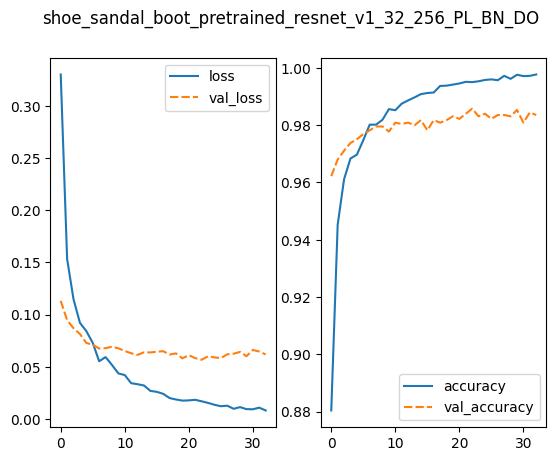

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_ssb_resnet_v1_PL_BN_DO_df = pd.DataFrame.from_dict(loaded_history_ssb_resnet_v1_PL_BN_DO)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_v1_32_256_PL_BN_DO')
sns.lineplot(ax=axes[0], data=history_ssb_resnet_v1_PL_BN_DO_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_ssb_resnet_v1_PL_BN_DO_df[['accuracy', 'val_accuracy']])

Con este modelo se ha reducido un poco el sobreajuste, ya que las pérdidas de entrenamiento y validación están ahora más cerca entre sí, y la pérdida de validación alcanza ahora una meseta y no sigue aumentando. Sin embargo, no se ha evitado por completo el sobreajuste.

In [ ]:
# fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_v1_32_256_PL_BN_DO.png')

#### 4.2.3.5. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v1_PL_BN_DO, val_accuracy_v1_PL_BN_DO = loaded_sequential_model_resnet_v1_PL_BN_DO.evaluate(val_generator_32, verbose=2)
print("Validation Loss:", val_loss_v1_PL_BN_DO)
print("Validation Accuracy:", val_accuracy_v1_PL_BN_DO)

130/130 - 12s - loss: 0.0175 - accuracy: 0.9966 - 12s/epoch - 95ms/step
Validation Loss: 0.017473746091127396
Validation Accuracy: 0.9966297745704651


In [ ]:
rendimiento.update({
    'v1_32_256_PL_BN_DO':{
        'Validation Loss': val_loss_v1_PL_BN_DO,
        'Validation Accuracy': val_accuracy_v1_PL_BN_DO,
        'Number of Epochs': len(loaded_history_ssb_resnet_v1_PL_BN_DO['loss'])
    }
})

In [ ]:
rendimiento

{'v1_32_256': {'Validation Loss': 0.01945103332400322,
  'Validation Accuracy': 0.9963890314102173,
  'Number of Epochs': 12},
 'v1_32_256_PL_BN_DO': {'Validation Loss': 0.017473746091127396,
  'Validation Accuracy': 0.9966297745704651,
  'Number of Epochs': 33}}

### 4.2.4. Aplicar Data Augmentation

Tras estuidar el *classification_report* obtenido en la anterior arquitectura, se puede ver que hay un gran sobreajuste en los datos, ya que la *accuracy* de los datos de entrenamiento y validación difieren mucho de los datos de prueba.

Otra técnica muy común para reducir el overfiting es realizar **Data Augmentation**. El aumento de datos es una técnica en la que los datos de entrenamiento se aumentan artificialmente aplicando diversas transformaciones como rotación, escalado, volteo y recorte para crear nuevos ejemplos. Esto aumenta la diversidad de los datos de entrenamiento y ayuda al modelo a generalizar mejor los datos no vistos.

Además, en las anteriores *learning curves*, se puede observar un *gap* importante entre la curva de entenamiento y la curva de validación. Esto sucede cuando el dataset de entrenamiento es insuficiente. Para remediarlo también se usa aumento de datos.

#### 4.2.4.1. Creación de la instancia de la clase ImageDataGenerator con Data Augmentation

In [ ]:
# Generador de imágenes para entrenamiento y prueba con data augmentation
train_datagen_augmentation = ImageDataGenerator(
    preprocessing_function=preprocess_input, # Preprocesamiento empleado en ResNet
    rotation_range=15,          # Rotación aleatoria en el rango de 0 a 15 grados
    width_shift_range=0.2,      # Desplazamiento aleatorio horizontal
    height_shift_range=0.2,     # Desplazamiento aleatorio vertical
    shear_range=0.2,            # Cizallamiento aleatorio
    zoom_range=0.2,             # Zoom aleatorio
    horizontal_flip=True,       # Volteo horizontal aleatorio
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Imágenes de entrenamiento con data augmentation
train_generator_augmentation_32 = train_datagen_augmentation.flow_from_directory(
    train_dir,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=32,
    shuffle=True
)

# Imágenes de validación sin data augmentation
val_generator_32 = test_datagen.flow_from_directory(
    val_dir,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=32,
)

# Imágenes de prueba sin data augmentation
test_generator_32 = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=32
)

Found 13663 images belonging to 3 classes.
Found 4154 images belonging to 3 classes.
Found 4154 images belonging to 3 classes.


#### 4.2.4.2. Construir la arquitectura de la CNN a partir de la red pre-enetrenada (ResNet - Transfer Learning)

In [ ]:
# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
    )

#base_model_resnet.summary()

In [ ]:
# Congelar las capas del modelo base
base_model_resnet.trainable = False

# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_v1_PL_BN_DO_DA = Sequential(name='ssb_resnet_v1_PL_BN_DO_DA')
sequential_model_resnet_v1_PL_BN_DO_DA.add(base_model_resnet)

# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_v1_PL_BN_DO_DA.add(GlobalAveragePooling2D())
sequential_model_resnet_v1_PL_BN_DO_DA.add(Dense(256, activation='relu'))
sequential_model_resnet_v1_PL_BN_DO_DA.add(BatchNormalization())  # Agregar batch normalization
sequential_model_resnet_v1_PL_BN_DO_DA.add(Dropout(0.5))  # Agregar dropout
sequential_model_resnet_v1_PL_BN_DO_DA.add(Dense(3, activation='softmax'))

sequential_model_resnet_v1_PL_BN_DO_DA.summary()

Model: "ssb_resnet_v1_PL_BN_DO_DA"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_4 (Dense)             (None, 256)               524544    
                                                                 
 batch_normalization_1 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_5 (Dense)             (None, 3)   

#### 4.2.4.3. Compilar el modelo

In [ ]:
# Compilar el modelo
sequential_model_resnet_v1_PL_BN_DO_DA.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

#### 4.2.4.4. Entrenar el modelo

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_v1_PL_BN_DO_DA = sequential_model_resnet_v1_PL_BN_DO_DA.fit(
    train_generator_augmentation_32,
    epochs=100,
    validation_data=val_generator_32,
    callbacks=[early_stopping]
    )
  """

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_v1_PL_BN_DO_DA = sequential_model_resnet_v1_PL_BN_DO_DA.fit(\n    train_generator_augmentation_32,\n    epochs=100,\n    validation_data=val_generator_32,\n    callbacks=[early_stopping]\n    )\n  "

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_v1_PL_BN_DO_DA.save(BASE_FOLDER+"ssb_resnet_v1_32_256_PL_BN_DO_DA.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_v1_PL_BN_DO_DA.save(BASE_FOLDER+"ssb_resnet_v1_32_256_PL_BN_DO_DA.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256_PL_BN_DO_DA.json', 'w') as f:
    json.dump(history_resnet_v1_PL_BN_DO_DA.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256_PL_BN_DO_DA.json', 'w') as f:\n    json.dump(history_resnet_v1_PL_BN_DO_DA.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_v1_PL_BN_DO_DA = load_model(BASE_FOLDER + "ssb_resnet_v1_32_256_PL_BN_DO_DA.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_32_256_PL_BN_DO_DA.json', 'r') as f:
    loaded_history_ssb_resnet_v1_PL_BN_DO_DA = json.load(f)


#### 4.2.4.5. Monitorizar le proceso de entrenamiento

<Axes: >

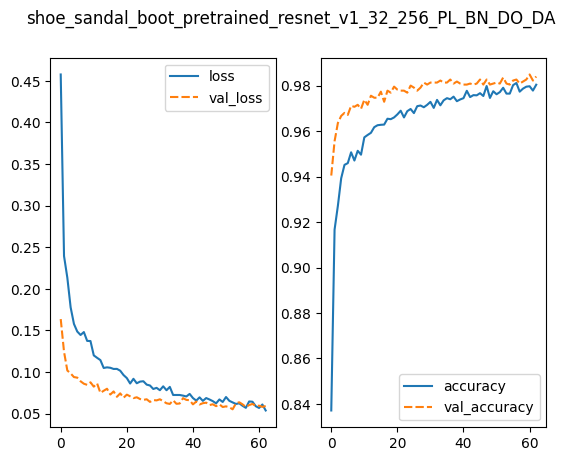

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_ssb_resnet_v1_PL_BN_DO_DA_df = pd.DataFrame.from_dict(loaded_history_ssb_resnet_v1_PL_BN_DO_DA)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_v1_32_256_PL_BN_DO_DA')
sns.lineplot(ax=axes[0], data=history_ssb_resnet_v1_PL_BN_DO_DA_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_ssb_resnet_v1_PL_BN_DO_DA_df[['accuracy', 'val_accuracy']])

In [ ]:
# fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_v1_32_256_PL_BN_DO_DA.png')

#### 4.2.4.6. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v1_PL_BN_DO_DA, val_accuracy_v1_PL_BN_DO_DA = loaded_sequential_model_resnet_v1_PL_BN_DO_DA.evaluate(val_generator_32, verbose=2)
print("Validation Loss:", val_loss_v1_PL_BN_DO_DA)
print("Validation Accuracy:", val_accuracy_v1_PL_BN_DO_DA)

130/130 - 13s - loss: 0.0247 - accuracy: 0.9928 - 13s/epoch - 97ms/step
Validation Loss: 0.02470310591161251
Validation Accuracy: 0.9927780628204346


In [ ]:
rendimiento.update({
    'v1_32_256_PL_BN_DO_DA':{
        'Validation Loss': val_loss_v1_PL_BN_DO_DA,
        'Validation Accuracy': val_accuracy_v1_PL_BN_DO_DA,
        'Number of Epochs': len(loaded_history_ssb_resnet_v1_PL_BN_DO_DA['loss'])
    }
})

In [ ]:
rendimiento

{'v1_32_256': {'Validation Loss': 0.01945103332400322,
  'Validation Accuracy': 0.9963890314102173,
  'Number of Epochs': 12},
 'v1_32_256_PL_BN_DO': {'Validation Loss': 0.017473746091127396,
  'Validation Accuracy': 0.9966297745704651,
  'Number of Epochs': 33},
 'v1_32_256_PL_BN_DO_DA': {'Validation Loss': 0.02470310591161251,
  'Validation Accuracy': 0.9927780628204346,
  'Number of Epochs': 63}}

### 4.2.5. Aumento del tamaño del lote a 64

El gráfico continúa siendo inestable. Esto significa que en cada paso de actualización, los pesos de la red se actualizan de tal forma que la périda a veces aumenta mucho y a veces disminuye micho. Esto podría indicar que:

- Los pesos se actualizan demasiado en cada paso de aprendizaje y se necesita una tasa de aprendizaje menor
- Hay una gran variación en los datos, lo que lleva al optimizador a cambiar los pesos en diferentes direcciones en cada paso de aprendizaje. Esto prodría solucionarse presentando más datos en cada paso de aprendizaje, esto es, aumentando el tamaño del lote.

Vamos a probar el segundo punto.

La aparición de picos en la pérdida de validación, especialmente después de la época 7, es un signo claro de que el modelo está teniendo problemas. Estos picos indican que el modelo está teniendo dificultades para generalizar a datos nuevos y desconocidos, lo que puede deberse a una complejidad excesiva en el modelo o a una falta de regularización.

Se va a aumenta el batch size para verificar si se obtiene un mejor resultado.

#### 4.2.5.1. Creación de la instancia de la clase ImageDataGenerator con Data Augmentation y Batch Size de 64

In [ ]:
# Generador de imágenes para entrenamiento y prueba con data augmentation
train_datagen_augmentation = ImageDataGenerator(
    preprocessing_function=preprocess_input, # Preprocesamiento empleado en ResNet
    rotation_range=15,          # Rotación aleatoria en el rango de 0 a 15 grados
    width_shift_range=0.2,      # Desplazamiento aleatorio horizontal
    height_shift_range=0.2,     # Desplazamiento aleatorio vertical
    shear_range=0.2,            # Cizallamiento aleatorio
    zoom_range=0.2,             # Zoom aleatorio
    horizontal_flip=True,       # Volteo horizontal aleatorio
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Imágenes de entrenamiento con data augmentation
train_generator_augmentation_64 = train_datagen_augmentation.flow_from_directory(
    train_dir,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=64,
    shuffle=True
)

# Imágenes de validación sin data augmentation
val_generator_64 = test_datagen.flow_from_directory(
    val_dir,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=64,
)

# Imágenes de prueba sin data augmentation
test_generator_64 = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=64
)

Found 13663 images belonging to 3 classes.
Found 4154 images belonging to 3 classes.
Found 4154 images belonging to 3 classes.


#### 4.2.5.2. Construir la arquitectura de la CNN a partir de la red pre-enetrenada (ResNet - Transfer Learning)

In [ ]:
# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
    )

#base_model_resnet.summary()

In [ ]:
# Congelar las capas del modelo base
base_model_resnet.trainable = False

# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_v1_PL_BN_DO_DA_64 = Sequential(name='ssb_resnet_v1_PL_BN_DO_DA_64')
sequential_model_resnet_v1_PL_BN_DO_DA_64.add(base_model_resnet)

# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_v1_PL_BN_DO_DA_64.add(GlobalAveragePooling2D())
sequential_model_resnet_v1_PL_BN_DO_DA_64.add(Dense(256, activation='relu'))
sequential_model_resnet_v1_PL_BN_DO_DA_64.add(BatchNormalization())  # Agregar batch normalization
sequential_model_resnet_v1_PL_BN_DO_DA_64.add(Dropout(0.5))  # Agregar dropout
sequential_model_resnet_v1_PL_BN_DO_DA_64.add(Dense(3, activation='softmax'))

sequential_model_resnet_v1_PL_BN_DO_DA_64.summary()

Model: "ssb_resnet_v1_PL_BN_DO_DA_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_6 (Dense)             (None, 256)               524544    
                                                                 
 batch_normalization_2 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 3)

#### 4.2.5.3. Compilar el modelo

In [ ]:
# Compilar el modelo
sequential_model_resnet_v1_PL_BN_DO_DA_64.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

#### 4.2.5.4. Entrenar el modelo

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_v1_PL_BN_DO_DA_64 = sequential_model_resnet_v1_PL_BN_DO_DA_64.fit(
    train_generator_augmentation_64,
    epochs=100,
    validation_data=val_generator_64,
    callbacks=[early_stopping]
    )
"""

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_v1_PL_BN_DO_DA_64 = sequential_model_resnet_v1_PL_BN_DO_DA_64.fit(\n    train_generator_augmentation_64,\n    epochs=100,\n    validation_data=val_generator_64,\n    callbacks=[early_stopping]\n    )\n"

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_v1_PL_BN_DO_DA_64.save(BASE_FOLDER+"ssb_resnet_v1_64_256_PL_BN_DO_DA.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_v1_PL_BN_DO_DA_64.save(BASE_FOLDER+"ssb_resnet_v1_64_256_PL_BN_DO_DA.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_64_256_PL_BN_DO_DA.json', 'w') as f:
    json.dump(history_resnet_v1_PL_BN_DO_DA_64.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER + 'history_ssb_resnet_v1_64_256_PL_BN_DO_DA.json', 'w') as f:\n    json.dump(history_resnet_v1_PL_BN_DO_DA_64.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_v1_PL_BN_DO_DA_64 = load_model(BASE_FOLDER + "ssb_resnet_v1_64_256_PL_BN_DO_DA.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_v1_64_256_PL_BN_DO_DA.json', 'r') as f:
    loaded_history_ssb_resnet_v1_PL_BN_DO_DA_64 = json.load(f)


#### 4.2.5.5. Monitorizar le proceso de entrenamiento

<Axes: >

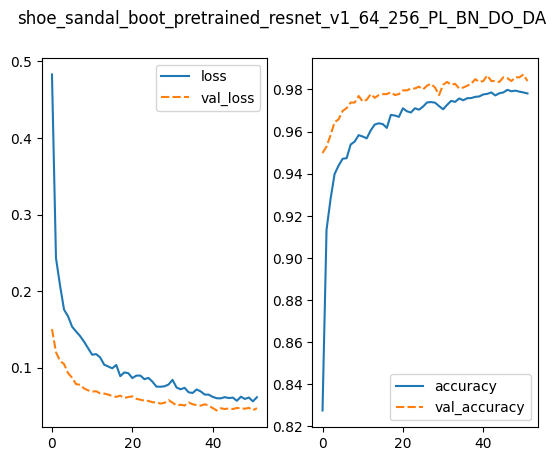

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_ssb_resnet_v1_PL_BN_DO_DA_64_df = pd.DataFrame.from_dict(loaded_history_ssb_resnet_v1_PL_BN_DO_DA_64)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_v1_64_256_PL_BN_DO_DA')
sns.lineplot(ax=axes[0], data=history_ssb_resnet_v1_PL_BN_DO_DA_64_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_ssb_resnet_v1_PL_BN_DO_DA_64_df[['accuracy', 'val_accuracy']])

In [ ]:
# fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_v1_64_256_PL_BN_DO_DA.png')

#### 4.2.5.6. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v1_PL_BN_DO_DA_64, val_accuracy_v1_PL_BN_DO_DA_64 = loaded_sequential_model_resnet_v1_PL_BN_DO_DA_64.evaluate(val_generator_64, verbose=2)
print("Validation Loss:", val_loss_v1_PL_BN_DO_DA_64)
print("Validation Accuracy:", val_accuracy_v1_PL_BN_DO_DA_64)

65/65 - 22s - loss: 0.0245 - accuracy: 0.9937 - 22s/epoch - 335ms/step
Validation Loss: 0.024509461596608162
Validation Accuracy: 0.993740975856781


In [ ]:
rendimiento.update({
    'v1_32_256_PL_BN_DO_DA_64':{
        'Validation Loss': val_loss_v1_PL_BN_DO_DA_64,
        'Validation Accuracy': val_accuracy_v1_PL_BN_DO_DA_64,
        'Number of Epochs': len(loaded_history_ssb_resnet_v1_PL_BN_DO_DA_64['loss'])
    }
})

In [ ]:
rendimiento

{'v1_32_256': {'Validation Loss': 0.01945103332400322,
  'Validation Accuracy': 0.9963890314102173,
  'Number of Epochs': 12},
 'v1_32_256_PL_BN_DO': {'Validation Loss': 0.017473746091127396,
  'Validation Accuracy': 0.9966297745704651,
  'Number of Epochs': 33},
 'v1_32_256_PL_BN_DO_DA': {'Validation Loss': 0.02470310591161251,
  'Validation Accuracy': 0.9927780628204346,
  'Number of Epochs': 63},
 'v1_32_256_PL_BN_DO_DA_64': {'Validation Loss': 0.024509461596608162,
  'Validation Accuracy': 0.993740975856781,
  'Number of Epochs': 52}}

## 4.3. Estrategia 2b: Red pre-entrenada - Fine-Tunning (ResNet)

Tras revisar todas las arquitecturas creadas en Transfer Learning, se ha verificado que la que red que mejor resultados da es la siguiente:
- *Arquitectura:*
  - Resnet50v2 base model
  - GlobalAveragePooling2D (reshaping layer)
  - Capa densa con 256 neuronas y activación ReLU
  - Batch Normalization (regularización)
  - Dropout 50% (regularización)
  - Capa densa con 3 neuronas y activación SofMax (output layer)
- *Algoritmo de entrenamiento:*
  - Learning Rate: 0.0001
  - Número de épocas: 52 (número obtenido mediante Early Stopping)
  - Batch Size: 64
  - Optimizador Adam
  - Función de pérdida Categorical Crossentropy
- *Regularización aplicada:*
  - Data Augmentation
  - Early Stopping
  - Batch Normalization
  - Dropout (0.5)

Para adaptar la red pre-entrenada ResNet a nuestro conjunto de datos específico, el cual puede tener características ligeramente diferentes al conjunto de datos original en el que se entrenó ResNet, se van a ajustar los pesos de las últimas capas mientras se mantienen fijos los pesos de las capas anteriores.

La primera decisión que se debe tomar es seleccionar cuantas capas se descongelarán, permitiendo un equilibrio entre la adaptación a un nuevo conjunto de datos específico y la preservación del conocimiento aprendido en las capas pre-entrenadas.

ResNet (Residual Network) fue originalmente desarrollada para la tarea de clasificación de imágenes en el desafío ImageNet Large Scale Visual Recognition Challenge (ILSVRC). Este desafío consistía en clasificar imágenes en 1,000 categorías diferentes. ResNet fue presentada por He et al. en su artículo "Deep Residual Learning for Image Recognition" en 2015. Por lo tanto, la tarea de clasificación de imágenes en tres categorías (zapatos, sandalias y botas) es similar en el sentido de que ambas implican la clasificación de imágenes.

Las últimas capas de ResNet son más específicas para las clases en las que se entrenó originalmente, esto es, para las 1000 clases de ImageNet. Como nuestra tarea implica una clasificación diferente (entre zapatos, sandalias y botas),ajustaremos estas capas para que se adapten a nuestra tarea específica y permitir que se adapten a tu conjunto de datos.


### 4.3.1. Construir la arquitectura de la CNN a partir de la red pre-enetrenada (ResNet - Fine Tunning)

En los siguientes tres modelos, el input_shape no se ha definido de manera correcta. En vez de 244 se ha definido a 256.

#### 4.3.1.1. Cargar la topología de CNN sin la capa de clasificación final (base model - ResNet)

In [ ]:
# documentacion https://keras.io/applications/

# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet_FT_5E = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(256, 256, 3)
    )

#base_model_resnet_FT_5E.summary()

#### 4.3.1.2. Crear el top model y congelar las primeras 4 etapas convolucionales (13 bloques) (Fine-Tunning)

In [ ]:
# Congelamos las capas de los 4 etapas convolucionales, el quinto se re-entrena

for layer in base_model_resnet_FT_5E.layers:
    if 'conv5_' in layer.name:
        layer.trainable = True
    elif 'post' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
# Verficiamos que las capas se han descongelado correctamente
for layer in base_model_resnet_FT_5E.layers:
    print(f'Layer: {layer.name}, Trainable: {layer.trainable}')

Layer: input_6, Trainable: False
Layer: conv1_pad, Trainable: False
Layer: conv1_conv, Trainable: False
Layer: pool1_pad, Trainable: False
Layer: pool1_pool, Trainable: False
Layer: conv2_block1_preact_bn, Trainable: False
Layer: conv2_block1_preact_relu, Trainable: False
Layer: conv2_block1_1_conv, Trainable: False
Layer: conv2_block1_1_bn, Trainable: False
Layer: conv2_block1_1_relu, Trainable: False
Layer: conv2_block1_2_pad, Trainable: False
Layer: conv2_block1_2_conv, Trainable: False
Layer: conv2_block1_2_bn, Trainable: False
Layer: conv2_block1_2_relu, Trainable: False
Layer: conv2_block1_0_conv, Trainable: False
Layer: conv2_block1_3_conv, Trainable: False
Layer: conv2_block1_out, Trainable: False
Layer: conv2_block2_preact_bn, Trainable: False
Layer: conv2_block2_preact_relu, Trainable: False
Layer: conv2_block2_1_conv, Trainable: False
Layer: conv2_block2_1_bn, Trainable: False
Layer: conv2_block2_1_relu, Trainable: False
Layer: conv2_block2_2_pad, Trainable: False
Layer: con

### 4.3.2. Compilar y entrenar (fit) una red neuronal convolucional

In [ ]:
# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_FT_5E = Sequential(name='ssb_resnet_FT_5E')
sequential_model_resnet_FT_5E.add(base_model_resnet_FT_5E)

# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_FT_5E.add(GlobalAveragePooling2D())
sequential_model_resnet_FT_5E.add(Dense(256, activation='relu'))
sequential_model_resnet_FT_5E.add(BatchNormalization())  # Agregar batch normalization
sequential_model_resnet_FT_5E.add(Dropout(0.5))  # Agregar dropout
sequential_model_resnet_FT_5E.add(Dense(3, activation='softmax'))

# Compilar el modelo
sequential_model_resnet_FT_5E.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

# Mostrar el resumen del modelo
sequential_model_resnet_FT_5E.summary()

Model: "ssb_resnet_FT_5E"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d_3  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_8 (Dense)             (None, 256)               524544    
                                                                 
 batch_normalization_3 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_9 (Dense)             (None, 3)            

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_FT_5E = sequential_model_resnet_FT_5E.fit(
    train_generator_augmentation_64,
    epochs=100, # Se ha aumentado el número de épocas porque se ha aplicado Early Stopping
    validation_data=val_generator_64,
    callbacks=[early_stopping]
)
"""

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_FT_5E = sequential_model_resnet_FT_5E.fit(\n    train_generator_augmentation_64,\n    epochs=100, # Se ha aumentado el número de épocas porque se ha aplicado Early Stopping\n    validation_data=val_generator_64,\n    callbacks=[early_stopping]\n)\n"

#### 4.3.2.1. Guardar y subir el modelo y el historial de entrenamiento

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_FT_5E.save(BASE_FOLDER+"ssb_resnet_FT_5E.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_FT_5E.save(BASE_FOLDER+"ssb_resnet_FT_5E.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER+'history_ssb_resnet_FT_5E.json', 'w') as f:
    json.dump(history_resnet_FT_5E.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER+'history_ssb_resnet_FT_5E.json', 'w') as f:\n    json.dump(history_resnet_FT_5E.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_FT_5E = load_model(BASE_FOLDER + "ssb_resnet_FT_5E.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_FT_5E.json', 'r') as f:
    loaded_history_resnet_FT_5E = json.load(f)

#### 4.3.2.2. Monitorizar el proceso de entrenamiento (Evalución del Modelo durante el entrenamiento)

<Axes: >

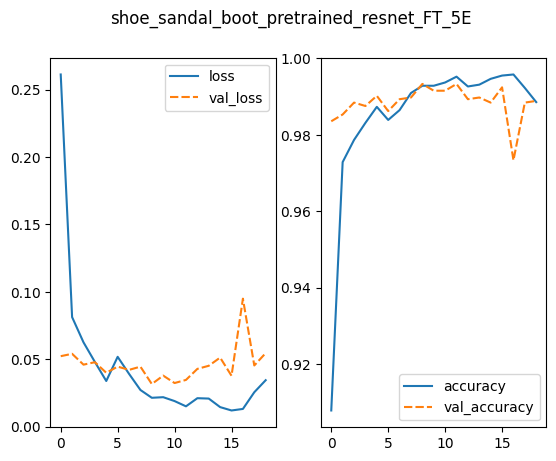

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_resnet_FT_5E_df = pd.DataFrame.from_dict(loaded_history_resnet_FT_5E)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_FT_5E')
sns.lineplot(ax=axes[0], data=history_resnet_FT_5E_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_resnet_FT_5E_df[['accuracy', 'val_accuracy']])

En estas curvas de validación, se puede observar un ruido considerable. Los picos grandes en las curvas de validación pueden ser indicativos de **overfitting**. Una posible causa podría ser que el modelo esté memorizando el conjunto de entrenamiento en lugar de aprender patrones generales que se puedan aplicar a datos nuevos.

Además, la pérdida de entrenamiento disminuye mientras que la de validación está estancada. Esto también es un indicativo de overfitting.

Se van a desbloquear menos bloques para reducir el overfirring.


In [ ]:
# fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_FT_5E.png')

#### 4.3.2.3. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_FT_5E, val_accuracy_FT_5E = loaded_sequential_model_resnet_FT_5E.evaluate(val_generator_64, verbose = True)
print("Validation Loss:", val_loss_FT_5E)
print("Validation Accuracy:", val_accuracy_FT_5E)

65/65 [==============================] - 13s 175ms/step - loss: 0.0078 - accuracy: 0.9981
Validation Loss: 0.007794676348567009
Validation Accuracy: 0.9980741739273071


In [ ]:
rendimiento.update({
    'FT_5E':{
        'Validation Loss': val_loss_FT_5E,
        'Validation Accuracy': val_accuracy_FT_5E,
        'Numer of Epochs': len(loaded_history_resnet_FT_5E['loss'])
    }
})

### 4.3.3. Descongelar el útlimo bloque convolucional (bloque 16) (Fine-Tunning)

#### 4.3.3.1. Construir la arquitectura de la CNN a partir de la red pre-enetrenada (ResNet - Fine Tunning)

In [ ]:
# documentacion https://keras.io/applications/

# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet_FT_16B = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(256, 256, 3)
    )

#base_model_resnet_FT_16B.summary()

In [ ]:
# Congelamos las capas de los 15 primeros bloques convolucionales, el 16 se reentrena
for layer in base_model_resnet_FT_16B.layers:
    if 'conv5_block3' in layer.name:
        layer.trainable = True
    elif 'post' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
# Verficiamos que las capas se han descongelado correctamente
for layer in base_model_resnet_FT_16B.layers:
    print(f'Layer: {layer.name}, Trainable: {layer.trainable}')

Layer: input_7, Trainable: False
Layer: conv1_pad, Trainable: False
Layer: conv1_conv, Trainable: False
Layer: pool1_pad, Trainable: False
Layer: pool1_pool, Trainable: False
Layer: conv2_block1_preact_bn, Trainable: False
Layer: conv2_block1_preact_relu, Trainable: False
Layer: conv2_block1_1_conv, Trainable: False
Layer: conv2_block1_1_bn, Trainable: False
Layer: conv2_block1_1_relu, Trainable: False
Layer: conv2_block1_2_pad, Trainable: False
Layer: conv2_block1_2_conv, Trainable: False
Layer: conv2_block1_2_bn, Trainable: False
Layer: conv2_block1_2_relu, Trainable: False
Layer: conv2_block1_0_conv, Trainable: False
Layer: conv2_block1_3_conv, Trainable: False
Layer: conv2_block1_out, Trainable: False
Layer: conv2_block2_preact_bn, Trainable: False
Layer: conv2_block2_preact_relu, Trainable: False
Layer: conv2_block2_1_conv, Trainable: False
Layer: conv2_block2_1_bn, Trainable: False
Layer: conv2_block2_1_relu, Trainable: False
Layer: conv2_block2_2_pad, Trainable: False
Layer: con

In [ ]:
# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_FT_16B = Sequential(name='ssb_resnet_FT_16B')
sequential_model_resnet_FT_16B.add(base_model_resnet_FT_16B)

# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_FT_16B.add(GlobalAveragePooling2D())
#sequential_model_resnet_PL_BN_DO_ES.add(Flatten())
sequential_model_resnet_FT_16B.add(Dense(256, activation='relu'))
sequential_model_resnet_FT_16B.add(BatchNormalization())  # Agregar batch normalization
sequential_model_resnet_FT_16B.add(Dropout(0.5))  # Agregar dropout
sequential_model_resnet_FT_16B.add(Dense(3, activation='softmax'))

# Mostrar el resumen del modelo
sequential_model_resnet_FT_16B.summary()

Model: "ssb_resnet_FT_16B"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d_5  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_12 (Dense)            (None, 256)               524544    
                                                                 
 batch_normalization_5 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_13 (Dense)            (None, 3)           

#### 4.3.3.2. Compilar el modelo

In [ ]:
# Compilar el modelo
sequential_model_resnet_FT_16B.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

#### 4.3.3.3. Entrenar el modelo

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_FT_16B = sequential_model_resnet_FT_16B.fit(
    train_generator_augmentation_64,
    epochs=100, # Se ha aumentado el número de épocas porque se ha aplicado Early Stopping
    validation_data=val_generator_64,
    callbacks=[early_stopping]
)
"""

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_FT_16B = sequential_model_resnet_FT_16B.fit(\n    train_generator_augmentation_64,\n    epochs=100, # Se ha aumentado el número de épocas porque se ha aplicado Early Stopping\n    validation_data=val_generator_64,\n    callbacks=[early_stopping]\n)\n"

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_FT_16B.save(BASE_FOLDER+"ssb_resnet_FT_16B.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_FT_16B.save(BASE_FOLDER+"ssb_resnet_FT_16B.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER+'history_ssb_resnet_FT_16B.json', 'w') as f:
    json.dump(history_resnet_FT_16B.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER+'history_ssb_resnet_FT_16B.json', 'w') as f:\n    json.dump(history_resnet_FT_16B.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_FT_16B = load_model(BASE_FOLDER + "ssb_resnet_FT_16B.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_FT_16B.json', 'r') as f:
    loaded_history_resnet_FT_16B = json.load(f)

#### 4.3.3.4. Monitorizar le proceso de entrenamiento

<Axes: >

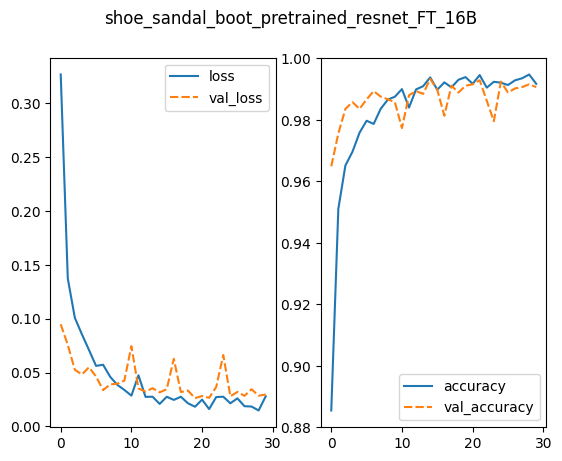

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_resnet_FT_16B_df = pd.DataFrame.from_dict(loaded_history_resnet_FT_16B)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_FT_16B')
sns.lineplot(ax=axes[0], data=history_resnet_FT_16B_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_resnet_FT_16B_df[['accuracy', 'val_accuracy']])

Este modelo se ha comportado mucho mejor que el anterior. Aunque se siga presenciando ruido, la pérdida de validación ha disminuido junto con la de entrenamiento.

In [ ]:
#fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_FT_16B.png')

#### 4.3.3.5. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_FT_16B, val_accuracy_FT_16B = loaded_sequential_model_resnet_FT_16B.evaluate(val_generator_64, verbose = True)
print("Validation Loss:", val_loss_FT_16B)
print("Validation Accuracy:", val_accuracy_FT_16B)

65/65 [==============================] - 14s 190ms/step - loss: 0.0098 - accuracy: 0.9961
Validation Loss: 0.00981892365962267
Validation Accuracy: 0.9961482882499695


In [ ]:
rendimiento.update({
    'FT_16B':{
        'Validation Loss': val_loss_FT_16B,
        'Validation Accuracy': val_accuracy_FT_16B
    }
})

In [ ]:
rendimiento['FT_16B']['Numer of Epochs'] = len(loaded_history_resnet_FT_16B['loss'])

In [ ]:
rendimiento

{'v1_32_256': {'Validation Loss': 0.01945103332400322,
  'Validation Accuracy': 0.9963890314102173,
  'Number of Epochs': 12},
 'v1_32_256_PL_BN_DO': {'Validation Loss': 0.017473746091127396,
  'Validation Accuracy': 0.9966297745704651,
  'Number of Epochs': 33},
 'v1_32_256_PL_BN_DO_DA': {'Validation Loss': 0.02470310591161251,
  'Validation Accuracy': 0.9927780628204346,
  'Number of Epochs': 63},
 'v1_32_256_PL_BN_DO_DA_64': {'Validation Loss': 0.024509461596608162,
  'Validation Accuracy': 0.993740975856781,
  'Number of Epochs': 52},
 'FT_5E': {'Validation Loss': 0.007794676348567009,
  'Validation Accuracy': 0.9980741739273071,
  'Numer of Epochs': 19},
 'FT_16B': {'Validation Loss': 0.00981892365962267,
  'Validation Accuracy': 0.9961482882499695,
  'Numer of Epochs': 30}}

### 4.3.4. Congelar las primeras 3 etapas convolucionales (Fine-Tunning)

#### 4.3.4.1. Construir la arquitectura de la CNN a partir de la red pre-enetrenada (ResNet - Fine Tunning)

In [ ]:
# documentacion https://keras.io/applications/

# Instancial el modelo base ResNet con los pesos pre-entrenados
base_model_resnet_FT_4E = ResNet50V2(
    weights='imagenet',
    include_top=False,
    input_shape=(256, 256, 3)
    )

#base_model_resnet_FT_4E.summary()

In [ ]:
# Congelamos las capas de los 3 etapas convolucionales, el cuarto se re-entrena

for layer in base_model_resnet_FT_4E.layers:
    if 'conv4_' in layer.name:
        layer.trainable = True
    elif 'conv5_' in layer.name:
        layer.trainable = True
    elif 'post' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
# Verficiamos que las capas se han descongelado correctamente
for layer in base_model_resnet_FT_4E.layers:
    print(f'Layer: {layer.name}, Trainable: {layer.trainable}')

Layer: input_8, Trainable: False
Layer: conv1_pad, Trainable: False
Layer: conv1_conv, Trainable: False
Layer: pool1_pad, Trainable: False
Layer: pool1_pool, Trainable: False
Layer: conv2_block1_preact_bn, Trainable: False
Layer: conv2_block1_preact_relu, Trainable: False
Layer: conv2_block1_1_conv, Trainable: False
Layer: conv2_block1_1_bn, Trainable: False
Layer: conv2_block1_1_relu, Trainable: False
Layer: conv2_block1_2_pad, Trainable: False
Layer: conv2_block1_2_conv, Trainable: False
Layer: conv2_block1_2_bn, Trainable: False
Layer: conv2_block1_2_relu, Trainable: False
Layer: conv2_block1_0_conv, Trainable: False
Layer: conv2_block1_3_conv, Trainable: False
Layer: conv2_block1_out, Trainable: False
Layer: conv2_block2_preact_bn, Trainable: False
Layer: conv2_block2_preact_relu, Trainable: False
Layer: conv2_block2_1_conv, Trainable: False
Layer: conv2_block2_1_bn, Trainable: False
Layer: conv2_block2_1_relu, Trainable: False
Layer: conv2_block2_2_pad, Trainable: False
Layer: con

In [ ]:
# Crear un modelo secuencial y añadir la red ResNet50V2 pre-entrenada
sequential_model_resnet_FT_4E = Sequential(name='ssb_resnet_FT_4E')
sequential_model_resnet_FT_4E.add(base_model_resnet_FT_4E)

# Añadir capas adicionales para adaptar la red al nuevo problema
sequential_model_resnet_FT_4E.add(GlobalAveragePooling2D())
sequential_model_resnet_FT_4E.add(Dense(256, activation='relu'))
sequential_model_resnet_FT_4E.add(BatchNormalization())  # Agregar batch normalization
sequential_model_resnet_FT_4E.add(Dropout(0.5))  # Agregar dropout
sequential_model_resnet_FT_4E.add(Dense(3, activation='softmax'))

# Mostrar el resumen del modelo
sequential_model_resnet_FT_4E.summary()

Model: "ssb_resnet_FT_4E"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 8, 8, 2048)        23564800  
                                                                 
 global_average_pooling2d_6  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_14 (Dense)            (None, 256)               524544    
                                                                 
 batch_normalization_6 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_6 (Dropout)         (None, 256)               0         
                                                                 
 dense_15 (Dense)            (None, 3)            

#### 4.3.4.2. Compilar el modelo

In [ ]:
# Compilar el modelo
sequential_model_resnet_FT_4E.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

#### 4.3.4.3. Entrenar el modelo

In [ ]:
"""
# Definir early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

# Entrenar el modelo con early stopping
history_resnet_FT_4E = sequential_model_resnet_FT_4E.fit(
    train_generator_augmentation_64,
    epochs=100, # Se ha aumentado el número de épocas porque se ha aplicado Early Stopping
    validation_data=val_generator_64,
    callbacks=[early_stopping]
)
"""

"\n# Definir early stopping\nearly_stopping = EarlyStopping(\n    monitor='val_loss',\n    patience=10,\n    restore_best_weights=True\n    )\n\n# Entrenar el modelo con early stopping\nhistory_resnet_FT_4E = sequential_model_resnet_FT_4E.fit(\n    train_generator_augmentation_64,\n    epochs=100, # Se ha aumentado el número de épocas porque se ha aplicado Early Stopping\n    validation_data=val_generator_64,\n    callbacks=[early_stopping]\n)\n"

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_resnet_FT_4E.save(BASE_FOLDER+"ssb_resnet_FT_4E.h5") #(X)
"""

'\n# Guardar el modelo en formato HDF5\nsequential_model_resnet_FT_4E.save(BASE_FOLDER+"ssb_resnet_FT_4E.h5") #(X)\n'

In [ ]:
"""
# Guardar el historial de entrenamiento en un archivo JSON
with open(BASE_FOLDER+'history_ssb_resnet_FT_4E.json', 'w') as f:
    json.dump(history_resnet_FT_4E.history, f)
"""

"\n# Guardar el historial de entrenamiento en un archivo JSON\nwith open(BASE_FOLDER+'history_ssb_resnet_FT_4E.json', 'w') as f:\n    json.dump(history_resnet_FT_4E.history, f)\n"

In [ ]:
# Cargar el modelo
loaded_sequential_model_resnet_FT_4E = load_model(BASE_FOLDER + "ssb_resnet_FT_4E.h5")

In [ ]:
# Cargar el historial de entrenamiento desde el archivo JSON
with open(BASE_FOLDER + 'history_ssb_resnet_FT_4E.json', 'r') as f:
    loaded_history_resnet_FT_4E = json.load(f)

#### 4.3.4.4. Monitorizar le proceso de entrenamiento

<Axes: >

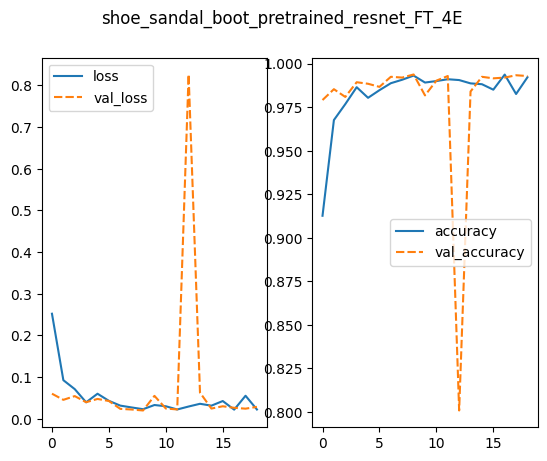

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_resnet_FT_4E_df = pd.DataFrame.from_dict(loaded_history_resnet_FT_4E)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('shoe_sandal_boot_pretrained_resnet_FT_4E')
sns.lineplot(ax=axes[0], data=history_resnet_FT_4E_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_resnet_FT_4E_df[['accuracy', 'val_accuracy']])

En estas curvas de validación, al igual que en el modelo *ssb_resnet_FT_5E*, se puede observar un ruido considerable. Los picos grandes en las curvas de validación pueden ser indicativos de **overfitting**. Una posible causa podría ser que el modelo esté memorizando el conjunto de entrenamiento en lugar de aprender patrones generales que se puedan aplicar a datos nuevos. Es por ello que el modelo que mejor funciona es en el que se ha desbloqueado únicamente el bloque convolucinal 16.


In [ ]:
# fig.savefig(BASE_FOLDER + 'plot_ssb_resnet_FT_4E.png')

#### 4.3.4.5. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_FT_4E, val_accuracy_FT_4E = loaded_sequential_model_resnet_FT_4E.evaluate(val_generator_64, verbose = True)
print("Validation Loss:", val_loss_FT_4E)
print("Validation Accuracy:", val_accuracy_FT_4E)

65/65 [==============================] - 15s 212ms/step - loss: 0.0159 - accuracy: 0.9961
Validation Loss: 0.015915801748633385
Validation Accuracy: 0.9961482882499695


In [ ]:
rendimiento.update({
    'FT_4E':{
        'Validation Loss': val_loss_FT_4E,
        'Validation Accuracy': val_accuracy_FT_4E
    }
})

In [ ]:
rendimiento['FT_4E']['Numer of Epochs'] = len(loaded_history_resnet_FT_4E['loss'])

In [ ]:
rendimiento

{'v1_32_256': {'Validation Loss': 0.01945103332400322,
  'Validation Accuracy': 0.9963890314102173,
  'Number of Epochs': 12},
 'v1_32_256_PL_BN_DO': {'Validation Loss': 0.017473746091127396,
  'Validation Accuracy': 0.9966297745704651,
  'Number of Epochs': 33},
 'v1_32_256_PL_BN_DO_DA': {'Validation Loss': 0.02470310591161251,
  'Validation Accuracy': 0.9927780628204346,
  'Number of Epochs': 63},
 'v1_32_256_PL_BN_DO_DA_64': {'Validation Loss': 0.024509461596608162,
  'Validation Accuracy': 0.993740975856781,
  'Number of Epochs': 52},
 'FT_5E': {'Validation Loss': 0.007794676348567009,
  'Validation Accuracy': 0.9980741739273071,
  'Numer of Epochs': 19},
 'FT_16B': {'Validation Loss': 0.00981892365962267,
  'Validation Accuracy': 0.9961482882499695,
  'Numer of Epochs': 30},
 'FT_4E': {'Validation Loss': 0.015915801748633385,
  'Validation Accuracy': 0.9961482882499695,
  'Numer of Epochs': 19}}

## Elegir el mejor modelo (ResNet)

Tras revisar el *loss* y el *accuracy* de etrenamiento y validación de todas las arquitecturas compilados, la red que mejor resultados ha dado, sin mostrar *overfiting* ni *underfiting* es el siguiente:

**ResNet con Fine-Tunning**:

Arquitectura:
- Resnet50v2 con el último bloque convolucional descongelado
- GlobalAveragePooling2D (reshaping layer)
- Batch Normalization (regularización)
- Dropout 50% (regularización)
- Capa densa con 256 neuronas y activación ReLU
- Capa densa con 3 neuronas y activación SofMax (output layer)

Algoritmo de entrenamiento:
- Learning Rate: 0.0001
- Número de épocas: 30 (número obtenido mediante Early Stopping)
- Batch Size: 128
- Optimizador Adam
- Función de pérdida Categorical Crossentropy

Regularización aplicada:
- Data Augmentation
- Early Stopping (patience 10)
- Batch Normalization
- Dropout (0.5)

Evaluación:
- Validation Loss: 0.012531100772321224
- Validation Accuracy: 0.9956762194633484

## 5.a. Evaluación del modelo predictivo (ResNet)

Después de entrenar completamente la red para obtener un rendimiento satisfactorio en los conjuntos de entrenamiento y validación, la utilizamos para realizar predicciones en el conjunto de *test*. La precisión de predicción del modelo en las nuevas imágenes se utilizará para medir el rendimiento de la red.

También es conveniente medir el rendimiento del modelo. Existen muchos métodos diferentes para medir el rendimiento y cuál utilizar dependerá del tipo de tarea que estemos intentando realizar.

En este caso, para comprobar la precisión del modelo en el conjunto de test, se utilizará accuracy_score() de sklearn.metrics.

**Accuracy: 0.9968888888888889**

### 5.1. Verificar el dataset de test

In [ ]:
# Verificar que se ha subido el mejor modelo
model_best_resnet = keras.models.load_model(BASE_FOLDER + "ssb_resnet_FT_16B.h5")
print('Estamos usando', model_best.name)

# Reset del test_generator
test_generator_64.reset()

# Número y forma de las imágenes cargada
num_images = len(test_generator_64.filenames)
shape_of_images = test_generator_64[0][0][0].shape

print("Número de imágenes cargadas:", num_images)
print("Forma de las imágenes cargadas:", shape_of_images)

# Número de etiquetas
num_labels = len(test_generator_64.class_indices)
print("Número de etiquetas:", num_labels)

Estamos usando ssb_resnet_FT_16B
Número de imágenes cargadas: 4154
Forma de las imágenes cargadas: (224, 224, 3)
Número de etiquetas: 3


### 5.2. Realizar las predicciones y medir el rendimiento

1/1 [==============================] - 3s 3s/step


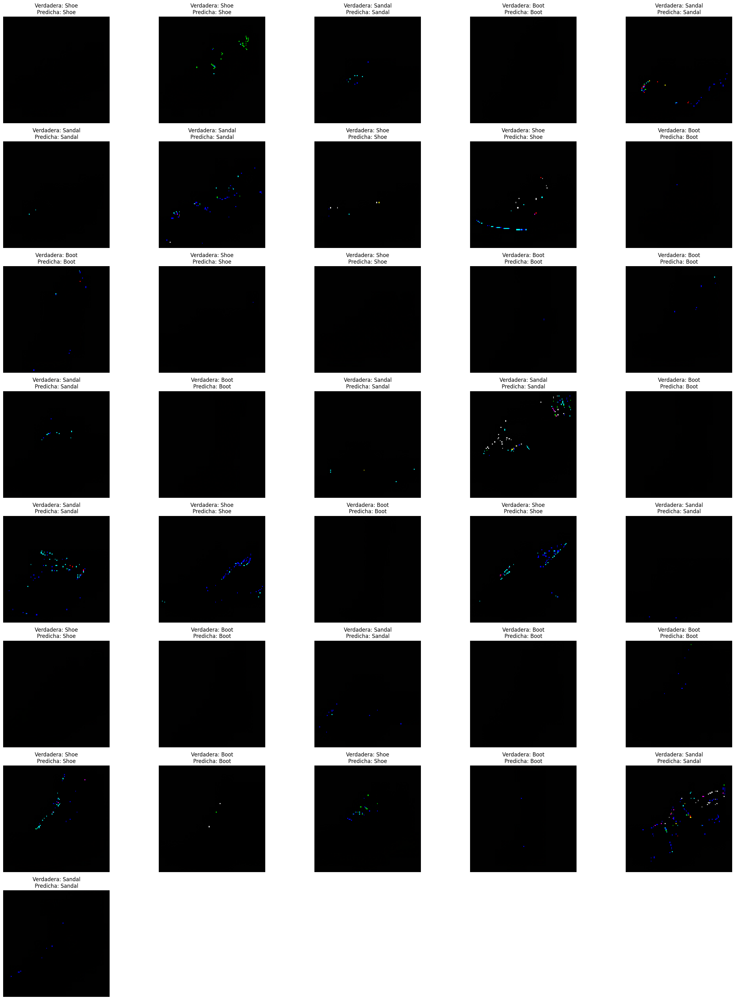

Accuracy: 0.9968888888888889
Total predicted images: 2250


In [ ]:
import math

# Restablecer el generador de datos
test_generator_64.reset()

# Definir las etiquetas de clase
class_labels = list(test_generator_64.class_indices.keys())

# Variables para almacenar las predicciones y etiquetas reales
predictions = []
true_labels = []

# Calcular el número de imágenes por batch size
total_images = test_generator_64.n
batch_size = 64
num_images = math.ceil(total_images / batch_size)

# Calcular el número de filas y columnas necesarias
num_rows = math.ceil(num_images / 5)
num_cols = min(num_images, 5)

# Definir el tamaño de la figura basado en el número de filas y columnas
plt.figure(figsize=(5*num_cols, 4*num_rows))

# Iterar sobre las imágenes y obtener las predicciones
for i in range(num_images):
    # Obtener la siguiente imagen del generador
    image, label = next(test_generator_64)

    # Redimensionar la imagen al tamaño esperado por el modelo (Para solucionar el error al no poner un tamaño adecuado en los modelos de fine-tunning)
    image_resized = tf.image.resize(image, (256, 256))

    # Realizar la predicción con el modelo
    prediction = model_best.predict(image_resized)

    # Obtener la clase predicha y verdadera
    predicted_class = np.argmax(prediction, axis=1)
    true_class = np.argmax(label, axis=1)

    # Agregar las predicciones y etiquetas reales a las listas
    predictions.extend(predicted_class)
    true_labels.extend(true_class)

    # Convertir la imagen al formato adecuado
    image = image[0]  # Tomar solo la primera imagen del lote
    image = image.astype('uint8')  # Convertir los valores de píxeles a enteros de 8 bits sin signo

    # Obtener la etiqueta predicha y verdadera
    predicted_class_label = class_labels[predicted_class[0]]
    true_class_label = class_labels[true_class[0]]

    # Mostrar la imagen real junto con la etiqueta predicha y la verdadera
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.title(f'Verdadera: {true_class_label}\nPredicha: {predicted_class_label}')
    plt.axis('off')

# Ajustar automáticamente el diseño de la figura
plt.tight_layout()
plt.show()

# Calcular la precisión utilizando accuracy_score
accuracy = accuracy_score(true_labels, predictions)
print(f'Accuracy: {accuracy}')

# Calcular el número total de imágenes predichas
total_predicted_images = len(predictions)
print(f'Total predicted images: {total_predicted_images}')


## 5.3. Matriz de Confusión

En el caso de las clasificaciones multiclase, cada valor de celda (Ci,j) es igual al número de observaciones que se sabe que están en el grupo i y que se predice que están en el grupo j. Las celdas diagonales de la matriz son aquellas en las que coinciden la clase verdadera y la clase predicha.

[[747   0   3]
 [  1 747   2]
 [  0   1 749]]


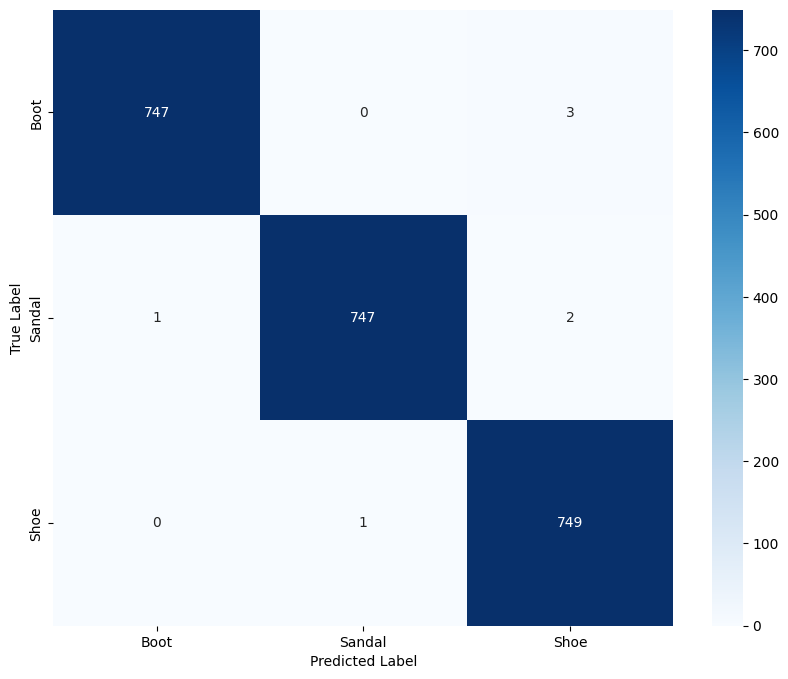

In [ ]:
# Crear la matriz de confusión
conf_matrix = confusion_matrix(true_labels, predictions)
print(conf_matrix)

# Convertir a dataframe
confusion_df = pd.DataFrame(conf_matrix, index=class_labels, columns=class_labels)

# Establecer los nombres de los ejes x e y para mejorar la legibilidad del mapa de calor
confusion_df.index.name = 'True Label'
confusion_df.columns.name = 'Predicted Label'

# Visualizar la matriz de confusión utilizando un mapa de calor de seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues')
plt.show()

La matriz de confusión ilustra que las predicciones son muy buenas. Este rendimiento era el esperado dada la *accuracy* obtenida con los datos de validación en el modelo ResNet elegido.

## 5.4. Estrategia 3a. Red pre-entrenada - Transfer Learning (InceptionV3)

**InceptionV3** destaca por su profundidad y capacidad para capturar características complejas en imágenes, lo que la hace especialmente adecuada para problemas de clasificación que involucran objetos con detalles y variaciones sutiles.

La clave de InceptionV3 radica en su diseño en bloques "Inception", que permite a la red realizar operaciones de convolución en paralelo a diferentes escalas y resoluciones, facilitando la captura de características contextuales y multi-escala.

Al igual que otras arquitecturas actuales, el uso de InceptionV3 se beneficia de técnicas como el pre-entrenamiento en grandes conjuntos de datos como ImageNet. Esto permite que la red adquiera un conocimiento previo amplio y generalizable sobre características visuales, que puede transferirse eficazmente a tareas específicas como la clasificación de botas, zapatillas y chanclas.

La información de esta red puede encontrarse en https://keras.io/api/applications/inceptionv3/

Nota: Para la generación de imágenes se ha utilizado un tamaño de imagen de 256x256, en concordancia con lo especificado en la documentación.

In [ ]:
# Crear generadores de imágenes para entrenamiento y prueba
train_datagen = ImageDataGenerator(
        # rescale=1./255, # Normalizar las imágenes
        preprocessing_function=preprocess_input, # Para aplicar la normalización de ImageNet
        )

val_datagen = ImageDataGenerator(
        # rescale=1./255, # Normalizar las imágenes
        preprocessing_function=preprocess_input, # Para aplicar la normalización de ImageNet
        )

test_datagen = ImageDataGenerator(
    # rescale=1./255 # Normalizar las imágenes
    preprocessing_function=preprocess_input # Para aplicar la normalización de ImageNet
    )

# Imágenes de entrenamiento
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(256,256),  # Redimensionar las imágenes
        class_mode='categorical', # Utilizar one-hot encoding para las etiquetas
        batch_size=32,
        shuffle=True)

# Imágenes de validación
val_generator = train_datagen.flow_from_directory(
        val_dir,
        target_size=(256,256),  # Redimensionar las imágenes
        class_mode='categorical', # Utilizar one-hot encoding para las etiquetas
        batch_size=32)

# Imágenes de prueba
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(256,256),  # Redimensionar las imágenes
        class_mode='categorical', # Utilizar one-hot encoding para las etiquetas
        batch_size=32)

Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


### 5.4.1. Construir una CNN - inceptionV3_V1

Se ha inicializado el modelo de la red de transfer learning de InceptionV3 con una arquitectura muy simple, compuesta de:

* **Capa Flatten**: Después del modelo base convolucional de InceptionV3, que extrae características de las imágenes, se ha utilizado una capa Flatten para transformar la salida de las capas convolucionales en un vector unidimensional. Esto es necesario para conectar la salida de la red convolucional a capas densamente conectadas.

* **Capa Densa** (Fully Connected): La capa densa con 256 neuronas es responsable de aprender características más abstractas de las características extraídas por InceptionV3. La función de activación ReLU se utiliza comúnmente en esta capa para introducir no linealidades en el modelo y permitir que la red aprenda relaciones más complejas entre las características.

* **Capa de Clasificación** (Softmax): La capa final del modelo es una capa densa con 3 neuronas, cada una correspondiente a una clase del conjunto de datos ("shoe", "sandal", "boot"). La función de activación softmax se usa aquí para convertir las salidas de las neuronas en probabilidades, donde cada neurona representa la probabilidad de pertenencia a una clase específica.

#### 5.4.1.1. Cargar la topología de CNN sin la capa de clasificación final (base model - **InceptionV3**)

In [ ]:
# Cargar base model de InceptionV3
base_model = InceptionV3(
    weights = 'imagenet',
    include_top = False,
    input_shape = (256,256,3)
    )

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

#### 5.4.1.2. Crear el top model y congelar todas las capas convolucionales (Transfer Learning)

In [ ]:
# Congelar las capas del modelo base
base_model.trainable = False

# Crear un modelo secuencial
sequential_model_inceptionv3_v1 = Sequential(name='tl_inceptionv3_v1')
sequential_model_inceptionv3_v1.add(base_model)

sequential_model_inceptionv3_v1.add(Flatten())
sequential_model_inceptionv3_v1.add(Dense(256, activation='relu'))
sequential_model_inceptionv3_v1.add(Dense(3, activation='softmax'))

sequential_model_inceptionv3_v1.summary()

Model: "tl_inceptionv3_v1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 flatten_1 (Flatten)         (None, 73728)             0         
                                                                 
 dense_4 (Dense)             (None, 256)               18874624  
                                                                 
 dense_5 (Dense)             (None, 3)                 771       
                                                                 
Total params: 40678179 (155.17 MB)
Trainable params: 18875395 (72.00 MB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


### 5.4.2. Compilar y entrenar inceptionV3_V1

In [ ]:
# Compilar el modelo
sequential_model_inceptionv3_v1.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
# Entrenar el modelo
history_inceptionv3_v1 = sequential_model_inceptionv3_v1.fit(
    train_generator,
    epochs = 20,
    validation_data = val_generator,
    )
"""

Epoch 1/20
300/300 [==============================] - 43s 126ms/step - loss: 0.1678 - accuracy: 0.9454 - val_loss: 0.0945 - val_accuracy: 0.9621
Epoch 2/20
300/300 [==============================] - 35s 118ms/step - loss: 0.0338 - accuracy: 0.9890 - val_loss: 0.0697 - val_accuracy: 0.9800
Epoch 3/20
300/300 [==============================] - 36s 119ms/step - loss: 0.0159 - accuracy: 0.9950 - val_loss: 0.0673 - val_accuracy: 0.9796
Epoch 4/20
300/300 [==============================] - 36s 119ms/step - loss: 0.0097 - accuracy: 0.9971 - val_loss: 0.0568 - val_accuracy: 0.9854
Epoch 5/20
300/300 [==============================] - 36s 120ms/step - loss: 0.0034 - accuracy: 0.9993 - val_loss: 0.0558 - val_accuracy: 0.9808
Epoch 6/20
300/300 [==============================] - 39s 130ms/step - loss: 0.0013 - accuracy: 0.9999 - val_loss: 0.0568 - val_accuracy: 0.9846
Epoch 7/20
300/300 [==============================] - 39s 129ms/step - loss: 4.8171e-04 - accuracy: 1.0000 - val_loss: 0.0626 - va

#### 5.4.2.1. Guardar y subir el modelo y el historial de entrenamiento

In [ ]:
"""
# Guardar el modelo en formato HDF5
sequential_model_inceptionv3_v1.save(BASE_FOLDER+"inceptionv3_transfer.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_sequential_model_inceptionv3_v1 = load_model(BASE_FOLDER + "inceptionv3_transfer.h5")

#### 5.4.2.2. Monitorizar el proceso de entrenamiento (Evalución del Modelo durante el entrenamiento)

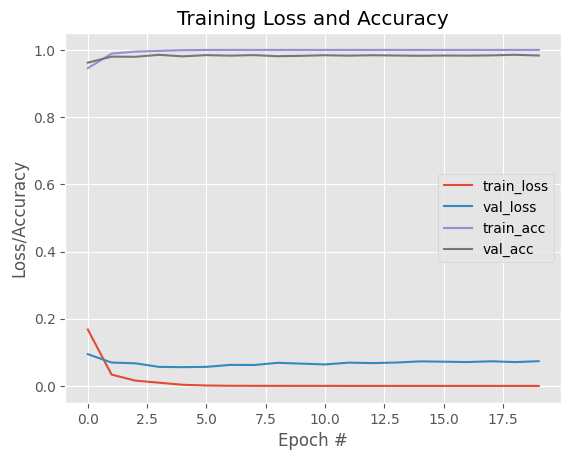

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 20), history_inceptionv3_v1.history["loss"], label="train_loss")
plt.plot(np.arange(0, 20), history_inceptionv3_v1.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 20), history_inceptionv3_v1.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 20), history_inceptionv3_v1.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

Se puede observar cómo en este caso, la pérdida de entrenamiento tiene un comportamiento como el esperado, sin embargo, la pérdida de validación se mantiene constante o incluso con un ligero crecimiento a lo largo del entrenamiento. Además, tenemos una precisión de entrenamiento perfecto (accuracy = 1) casi desde el inicio, mientras que la precisión de validación se mantiene constante.

Este es un comportamiento característico de un modelo con **overfitting**, es decir, se ha especializado demasiado en el conjunto de entrenamiento.

En este caso, **para hacer frente a este overfitting**
se va a entrenar un **nuevo modelo** aplicando **Data Augmentation**, de forma que se aumenta artificialmente el tamaño del dataset e introduciendo más variabilidad en los datos.

Adicionalmente se ha sustituido la capa Flatten por una **GlobalMaxPooling2D**. Esta capa (GlobalMaxPooling) realiza una operación de reducción espacial mediante la toma del valor máximo de cada mapa de características. Esto significa que para cada mapa de características, solo se conserva la característica más relevante (el valor máximo), lo que reduce significativamente la cantidad de parámetros en comparación con Flatten

Finalmente, para hacer frente al sobre ajuste del modelo se ha añadido una capa de **BatchNormalization** y otra de **Dropout**. Esto podría ayudar a mejorar el rendimiento y la capacidad de generalización del modelo, especialmente si estamos experimentando problemas de sobreajuste o inestabilidad en el entrenamiento.


#### 5.4.2.3. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v1, val_accuracy_v1 = loaded_sequential_model_inceptionv3_v1.evaluate(val_generator, verbose=2)
print("Validation Loss:", val_loss_v1)
print("Validation Accuracy:", val_accuracy_v1)

71/71 - 18s - loss: 0.0378 - accuracy: 0.9933 - 18s/epoch - 247ms/step
Validation Loss: 0.03776831179857254
Validation Accuracy: 0.9933333396911621


In [ ]:
rendimiento_iv3 = {
    'v1':{
        'Validation Loss': val_loss_v1,
        'Validation Accuracy': val_accuracy_v1,
        'Number of Epochs': 20
    }
}
rendimiento_iv3

{'v1': {'Validation Loss': 0.03776831179857254,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20}}

### 5.4.3 Aplicar Data Augmentation


In [ ]:
# Generador de imágenes para entrenamiento y prueba con data augmentation
train_datagen_augmentation = ImageDataGenerator(
    preprocessing_function=preprocess_input, # Preprocesamiento empleado en ResNet
    rotation_range=15,          # Rotación aleatoria en el rango de 0 a 15 grados
    width_shift_range=0.2,      # Desplazamiento aleatorio horizontal
    height_shift_range=0.2,     # Desplazamiento aleatorio vertical
    shear_range=0.2,            # Cizallamiento aleatorio
    zoom_range=0.2,             # Zoom aleatorio
    horizontal_flip=True,       # Volteo horizontal aleatorio
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Imágenes de entrenamiento con data augmentation
train_generator_aug = train_datagen_augmentation.flow_from_directory(
    train_dir,
    class_mode='categorical',
    batch_size=32,
    shuffle=True
)

# Imágenes de validación sin data augmentation
val_generator_aug = test_datagen.flow_from_directory(
    val_dir,
    class_mode='categorical',
    batch_size=32,
)

# Imágenes de prueba sin data augmentation
test_generator = test_datagen.flow_from_directory(
    test_dir,
    class_mode='categorical',
    batch_size=32
)

Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


### 5.4.4. Construir una CNN con Data Augmentation y regularización - inceptionV3_V2

A la siguiente iteración del modelo de transfer learning (al que se le aplica **Data Augmentation**), como se ha comentado, se le han añadido las siguientes capas:

* Global Max Pooling (Sustituye a Flatten)
* Batch Normalization
* Dropout de 0.5

#### 5.4.4.1. Cargar la topología de CNN sin la capa de clasificación final (base model - **InceptionV3**)

In [ ]:
# Cargar base model de InceptionV3
base_model = InceptionV3(
    weights = 'imagenet',
    include_top = False,
    input_shape = (256,256,3)
    )

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
base_model.summary()

#### 5.4.4.2. Crear el top model - inceptionV3_V2

In [ ]:
# Congelar las capas del modelo base
base_model.trainable = False

# Crear un modelo secuencial
aug_model_inceptionv3_maxpool = Sequential(name='tl_inceptionv3_v2')
aug_model_inceptionv3_maxpool.add(base_model)

aug_model_inceptionv3_maxpool.add(GlobalMaxPooling2D())
aug_model_inceptionv3_maxpool.add(Dense(256, activation='relu'))
aug_model_inceptionv3_maxpool.add(BatchNormalization())
aug_model_inceptionv3_maxpool.add(Dropout(0.5))
aug_model_inceptionv3_maxpool.add(Dense(3, activation='softmax'))

aug_model_inceptionv3_maxpool.summary()

Model: "tl_inceptionv3_v2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d (Glob  (None, 2048)              0         
 alMaxPooling2D)                                                 
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 batch_normalization_94 (Ba  (None, 256)               1024      
 tchNormalization)                                               
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 3)           

### 5.4.5. Compilar y entrenar - inceptionV3_V2

In [ ]:
# Compilar el modelo
aug_model_inceptionv3_maxpool.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
# Entrenar el modelo
early_stopping = EarlyStopping(
    monitor = 'val_loss',
    patience = 10,
    restore_best_weights = True
    )

H_aug_maxpool_inceptionv3_v2 = aug_model_inceptionv3_maxpool.fit(
    train_generator_aug,
    epochs=60,
    validation_data=val_generator_aug,
    callbacks=[early_stopping]
    )
"""

Epoch 1/60
329/329 [==============================] - 211s 601ms/step - loss: 0.4263 - accuracy: 0.8437 - val_loss: 0.1730 - val_accuracy: 0.9369
Epoch 2/60
329/329 [==============================] - 187s 570ms/step - loss: 0.2641 - accuracy: 0.9073 - val_loss: 0.1714 - val_accuracy: 0.9373
Epoch 3/60
329/329 [==============================] - 219s 665ms/step - loss: 0.2414 - accuracy: 0.9153 - val_loss: 0.1513 - val_accuracy: 0.9413
Epoch 4/60
329/329 [==============================] - 226s 687ms/step - loss: 0.2237 - accuracy: 0.9186 - val_loss: 0.1434 - val_accuracy: 0.9453
Epoch 5/60
329/329 [==============================] - 190s 576ms/step - loss: 0.2071 - accuracy: 0.9271 - val_loss: 0.1377 - val_accuracy: 0.9462
Epoch 6/60
329/329 [==============================] - 192s 584ms/step - loss: 0.1937 - accuracy: 0.9331 - val_loss: 0.1571 - val_accuracy: 0.9453
Epoch 7/60
329/329 [==============================] - 190s 578ms/step - loss: 0.1861 - accuracy: 0.9348 - val_loss: 0.1205 -

#### 5.4.5.1. Guardar y subir el modelo y el historial de entrenamiento - inceptionV3_V2

In [ ]:
"""
# Guardar el modelo en formato HDF5
aug_model_inceptionv3_maxpool.save(BASE_FOLDER+"inceptionv3_aug_maxpooling_DO05.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_sequential_model_inceptionv3_v2 = load_model(BASE_FOLDER + "inceptionv3_aug_maxpooling_DO05.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_aug_maxpool_DO05_inceptionv3.json', 'w') as f:
    json.dump(H_aug_maxpool_inceptionv3.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_aug_maxpool_DO05_inceptionv3.json', 'r') as f:
    loaded_history_inceptionv3_v2 = json.load(f)

#### 5.4.5.2. Monitorizar el proceso de entrenamiento - inceptionV3_V2

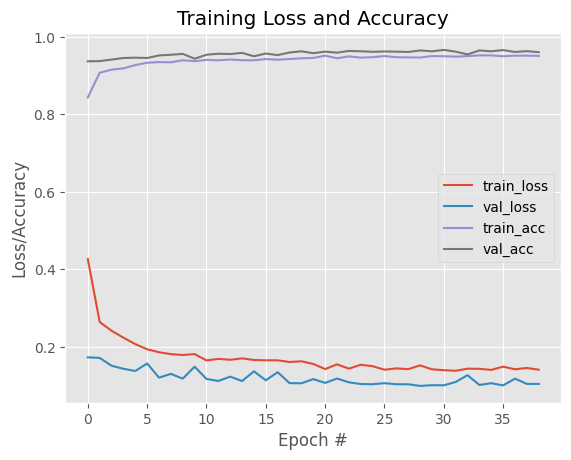

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 39), H_aug_maxpool_inceptionv3_v2.history["loss"], label="train_loss")
plt.plot(np.arange(0, 39), H_aug_maxpool_inceptionv3_v2.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 39), H_aug_maxpool_inceptionv3_v2.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 39), H_aug_maxpool_inceptionv3_v2.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

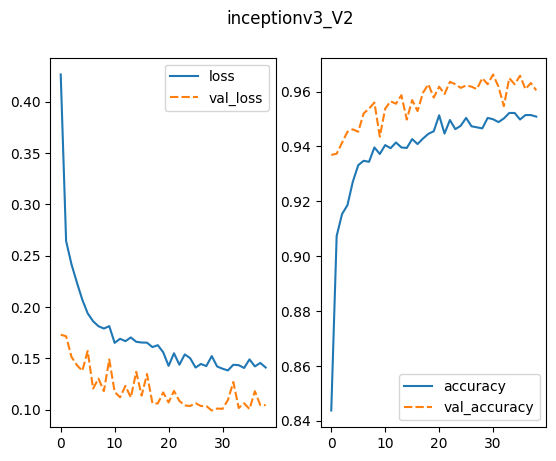

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_aug_maxpool_inceptionv3_v2_df = pd.DataFrame.from_dict(loaded_history_inceptionv3_v2)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_V2')
sns.lineplot(ax=axes[0], data=history_aug_maxpool_inceptionv3_v2_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_aug_maxpool_inceptionv3_v2_df[['accuracy', 'val_accuracy']])

Como se puede observar, estos cambios no han sido suficientes para hacer frente al overfitting. Además, como ya se ha explicado en el ajuste del modelo pre entrenado ResNet, este modelo presenta un comportamiento inestable (picos muy marcados) por lo que se va a **aplicar un aumento del tamaño del lote** y una **ligera reducción del dropout**.

Adicionalmente, en las siguientes iteraciones del modelo se ha añadido también regularización por **Early Stopping**, que ayuda a prevenir el sobreajuste deteniendo el entrenamiento del modelo cuando el rendimiento en el conjunto de validación comienza a empeorar

Nota: Se ha ido iterando desde un tamaño de lote de 32 hasta 128 para comprobar el efecto que este tiene sobre el comportamiento. Para no saturar el notebook solamente se presenta el **tamaño de lote de 128**, que es el que mejores resultados ha presentado.

#### 5.4.5.3. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v2, val_accuracy_v2 = loaded_sequential_model_inceptionv3_v2.evaluate(val_generator_aug, verbose=2)
print("Validation Loss:", val_loss_v2)
print("Validation Accuracy:", val_accuracy_v2)

71/71 - 7s - loss: 0.0900 - accuracy: 0.9667 - 7s/epoch - 99ms/step
Validation Loss: 0.09003417938947678
Validation Accuracy: 0.9666666388511658


In [ ]:
rendimiento_iv3.update({
    'v2':{
        'Validation Loss': val_loss_v2,
        'Validation Accuracy': val_accuracy_v2,
        'Number of Epochs': len(loaded_history_inceptionv3_v2['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.03776831179857254,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.09003417938947678,
  'Validation Accuracy': 0.9666666388511658,
  'Number of Epochs': 39}}

### 5.4.6. Incrementar tamaño del lote a 128

In [ ]:
# Generador de imágenes para entrenamiento y prueba con data augmentation
train_datagen_augmentation = ImageDataGenerator(
    preprocessing_function=preprocess_input, # Preprocesamiento empleado en ResNet
    rotation_range=15,          # Rotación aleatoria en el rango de 0 a 15 grados
    width_shift_range=0.2,      # Desplazamiento aleatorio horizontal
    height_shift_range=0.2,     # Desplazamiento aleatorio vertical
    shear_range=0.2,            # Cizallamiento aleatorio
    zoom_range=0.2,             # Zoom aleatorio
    horizontal_flip=True,       # Volteo horizontal aleatorio
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Imágenes de entrenamiento con data augmentation
train_generator_aug_128 = train_datagen_augmentation.flow_from_directory(
    train_dir,
    class_mode='categorical',
    batch_size=128,
    shuffle=True
)

# Imágenes de validación sin data augmentation
val_generator_aug_128 = test_datagen.flow_from_directory(
    val_dir,
    class_mode='categorical',
    batch_size=128,
)

# Imágenes de prueba sin data augmentation
test_generator_128 = test_datagen.flow_from_directory(
    test_dir,
    class_mode='categorical',
    batch_size=128
)

Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


### 5.4.7. Construir una CNN con Regularización y tamaño de lote de 128 - inceptionV3_V3

A la siguiente iteración del modelo de transfer learning (al que se le aplica **Data Augmentation**), como se ha comentado, se le han añadido las siguientes modificaciones:

* Batch Size de 128
* Dropout de 0.2 (Reducción del dropout de 0.5 a 0.2 para tratar de hacer frente a las inestabilidades de las curvas de pérdidas y precisión))


#### 5.4.7.1. Cargar la topología de CNN sin la capa de clasificación final (base model - **InceptionV3**)

In [ ]:
# Cargar base model de InceptionV3
base_model = InceptionV3(
    weights = 'imagenet',
    include_top = False,
    input_shape = (256,256,3)
    )

87910968/87910968 [==============================] - 1s 0us/step


#### 5.4.7.2. Crear el top model - inceptionV3_V3

In [ ]:
# Congelar las capas del modelo base
base_model.trainable = False

# Crear un modelo secuencial
aug_model_inceptionv3_maxpool = Sequential(name='tl_inceptionv3_v3')
aug_model_inceptionv3_maxpool.add(base_model)

aug_model_inceptionv3_maxpool.add(GlobalMaxPooling2D())
aug_model_inceptionv3_maxpool.add(Dense(256, activation='relu'))
aug_model_inceptionv3_maxpool.add(BatchNormalization())
aug_model_inceptionv3_maxpool.add(Dropout(0.2))
aug_model_inceptionv3_maxpool.add(Dense(3, activation='softmax'))

aug_model_inceptionv3_maxpool.summary()

Model: "tl_inceptionv3_v3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d_1 (Gl  (None, 2048)              0         
 obalMaxPooling2D)                                               
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 batch_normalization_189 (B  (None, 256)               1024      
 atchNormalization)                                              
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 3)           

### 5.4.8. Compilar y entrenar - inceptionV3_V3

In [ ]:
# Compilar el modelo
aug_model_inceptionv3_maxpool.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True
    )

H_aug_maxpool_inceptionv3_DO02 = aug_model_inceptionv3_maxpool.fit(
    train_generator_aug_128,
    epochs=60,
    validation_data=val_generator_aug_128,
    callbacks=[early_stopping]
    )
"""

Epoch 1/60
83/83 [==============================] - 236s 2s/step - loss: 0.4015 - accuracy: 0.8472 - val_loss: 0.2195 - val_accuracy: 0.9218
Epoch 2/60
83/83 [==============================] - 191s 2s/step - loss: 0.2264 - accuracy: 0.9150 - val_loss: 0.1599 - val_accuracy: 0.9369
Epoch 3/60
83/83 [==============================] - 192s 2s/step - loss: 0.1989 - accuracy: 0.9255 - val_loss: 0.1496 - val_accuracy: 0.9453
Epoch 4/60
83/83 [==============================] - 192s 2s/step - loss: 0.1791 - accuracy: 0.9360 - val_loss: 0.1370 - val_accuracy: 0.9502
Epoch 5/60
83/83 [==============================] - 191s 2s/step - loss: 0.1768 - accuracy: 0.9361 - val_loss: 0.1380 - val_accuracy: 0.9520
Epoch 6/60
83/83 [==============================] - 193s 2s/step - loss: 0.1641 - accuracy: 0.9404 - val_loss: 0.1391 - val_accuracy: 0.9476
Epoch 7/60
83/83 [==============================] - 192s 2s/step - loss: 0.1561 - accuracy: 0.9443 - val_loss: 0.1251 - val_accuracy: 0.9538
Epoch 8/60
83

#### 5.4.8.1. Guardar y subir el modelo y el historial de entrenamiento - inceptionV3_V3

In [ ]:
"""
# Guardar el modelo en formato HDF5
aug_model_inceptionv3_maxpool.save(BASE_FOLDER+"inceptionv3_aug_maxpooling_DO02_128.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_sequential_model_inceptionv3_v3 = load_model(BASE_FOLDER + "inceptionv3_aug_maxpooling_DO02_128.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_aug_maxpool_DO02_128_inceptionv3.json', 'w') as f:
    json.dump(H_aug_maxpool_inceptionv3_DO02.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_aug_maxpool_DO02_128_inceptionv3.json', 'r') as f:
    loaded_history_inceptionv3_v3 = json.load(f)

#### 5.4.8.2. Monitorizar el proceso de entrenamiento - inceptionV3_V3

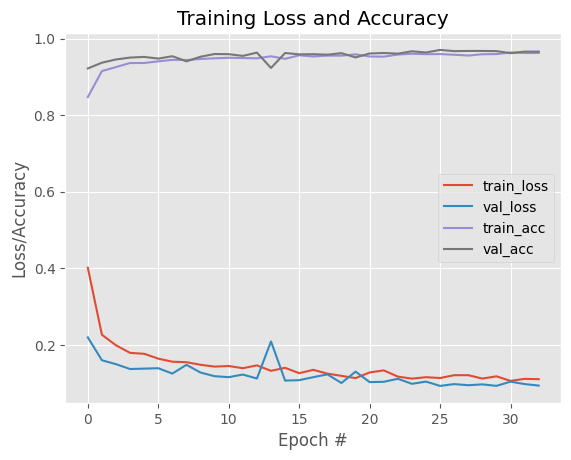

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 33), H_aug_maxpool_inceptionv3_DO02.history["loss"], label="train_loss")
plt.plot(np.arange(0, 33), H_aug_maxpool_inceptionv3_DO02.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 33), H_aug_maxpool_inceptionv3_DO02.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 33), H_aug_maxpool_inceptionv3_DO02.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

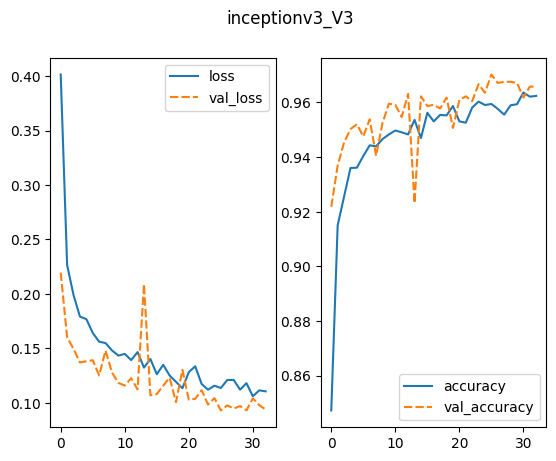

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_aug_maxpool_inceptionv3_DO02_128_df = pd.DataFrame.from_dict(loaded_history_inceptionv3_v3)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_V3')
sns.lineplot(ax=axes[0], data=history_aug_maxpool_inceptionv3_DO02_128_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_aug_maxpool_inceptionv3_DO02_128_df[['accuracy', 'val_accuracy']])

Se puede observar cómo, en general, las modificaciones aplicadas han mejorado ligeramente el ajuste del modelo. Sin embargo, todavía se observa insetabilidad y una ligera separación de las curvas.

En la siguiente iteración se ha incrementado el número de neuronas de la capa densa para comprobar el efecto que ésto tiene sobre la red.

#### 5.4.8.3. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v3, val_accuracy_v3 = loaded_sequential_model_inceptionv3_v3.evaluate(val_generator_aug_128, verbose=2)
print("Validation Loss:", val_loss_v3)
print("Validation Accuracy:", val_accuracy_v3)

18/18 - 29s - loss: 0.0796 - accuracy: 0.9716 - 29s/epoch - 2s/step
Validation Loss: 0.07957813143730164
Validation Accuracy: 0.9715555310249329


In [ ]:
rendimiento_iv3.update({
    'v3':{
        'Validation Loss': val_loss_v3,
        'Validation Accuracy': val_accuracy_v3,
        'Number of Epochs': len(loaded_history_inceptionv3_v3['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.03776831179857254,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.09003417938947678,
  'Validation Accuracy': 0.9666666388511658,
  'Number of Epochs': 39},
 'v3': {'Validation Loss': 0.07957813143730164,
  'Validation Accuracy': 0.9715555310249329,
  'Number of Epochs': 33}}

### 5.4.9. Construir una CNN con Regularización y tamaño de lote de 128 - inceptionV3_V4

A la siguiente iteración del modelo de transfer learning (al que se le aplica **Data Augmentation**), como se ha comentado, se le han añadido las siguientes modificaciones:

* Capa densa de 512 neuronas (Sustituye a la de 256 neuronas)

#### 5.4.9.1. Cargar la topología de CNN sin la capa de clasificación final (base model - **InceptionV3**)

In [ ]:
# Cargar ResNet pre-entrenada
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(256,256,3)
    )

#### 5.4.9.2. Crear el top model - inceptionV3_V4

In [ ]:
# Congelar las capas del modelo base
base_model.trainable = False

# Crear un modelo secuencial
aug_model_inceptionv3_maxpool = Sequential(name='tl_inceptionv3_v4')
aug_model_inceptionv3_maxpool.add(base_model)

aug_model_inceptionv3_maxpool.add(GlobalMaxPooling2D())
aug_model_inceptionv3_maxpool.add(Dense(512, activation='relu'))
aug_model_inceptionv3_maxpool.add(BatchNormalization())
aug_model_inceptionv3_maxpool.add(Dropout(0.2))
aug_model_inceptionv3_maxpool.add(Dense(3, activation='softmax'))

aug_model_inceptionv3_maxpool.summary()

Model: "tl_inceptionv3_v4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d_2 (Gl  (None, 2048)              0         
 obalMaxPooling2D)                                               
                                                                 
 dense_4 (Dense)             (None, 512)               1049088   
                                                                 
 batch_normalization_190 (B  (None, 512)               2048      
 atchNormalization)                                              
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 3)           

### 5.4.10. Compilar y entrenar - inceptionV3_V4

In [ ]:
# Compilar el modelo
aug_model_inceptionv3_maxpool.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True
    )

H_aug_maxpool_inceptionv3_DO02_2Dense = aug_model_inceptionv3_maxpool.fit(
    train_generator_aug_128,
    epochs=60,
    validation_data=val_generator_aug_128,
    callbacks=[early_stopping]
    )
"""

Epoch 1/60
83/83 [==============================] - 204s 2s/step - loss: 0.3578 - accuracy: 0.8653 - val_loss: 0.2169 - val_accuracy: 0.9267
Epoch 2/60
83/83 [==============================] - 189s 2s/step - loss: 0.2152 - accuracy: 0.9252 - val_loss: 0.1553 - val_accuracy: 0.9418
Epoch 3/60
83/83 [==============================] - 195s 2s/step - loss: 0.1756 - accuracy: 0.9359 - val_loss: 0.1745 - val_accuracy: 0.9413
Epoch 4/60
83/83 [==============================] - 192s 2s/step - loss: 0.1695 - accuracy: 0.9383 - val_loss: 0.1249 - val_accuracy: 0.9560
Epoch 5/60
83/83 [==============================] - 192s 2s/step - loss: 0.1604 - accuracy: 0.9399 - val_loss: 0.1275 - val_accuracy: 0.9502
Epoch 6/60
83/83 [==============================] - 195s 2s/step - loss: 0.1555 - accuracy: 0.9444 - val_loss: 0.1194 - val_accuracy: 0.9578
Epoch 7/60
83/83 [==============================] - 197s 2s/step - loss: 0.1515 - accuracy: 0.9446 - val_loss: 0.1237 - val_accuracy: 0.9524
Epoch 8/60
83

#### 5.4.10.1. Guardar y subir el modelo y el historial de entrenamiento - inceptionV3_V4

In [ ]:
"""
# Guardar el modelo en formato HDF5
aug_model_inceptionv3_maxpool.save(BASE_FOLDER+"inceptionv3_aug_maxpooling_DO02_2Dense_128.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_sequential_model_inceptionv3_v4 = load_model(BASE_FOLDER + "inceptionv3_aug_maxpooling_DO02_2Dense_128.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_aug_maxpool_DO02_2Dense_128_inceptionv3.json', 'w') as f:
    json.dump(H_aug_maxpool_inceptionv3_DO02_2Dense.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_aug_maxpool_DO02_2Dense_128_inceptionv3.json', 'r') as f:
    loaded_history_inceptionv3_v4 = json.load(f)

#### 5.4.10.2. Monitorizar el proceso de entrenamiento - inceptionV3_V4

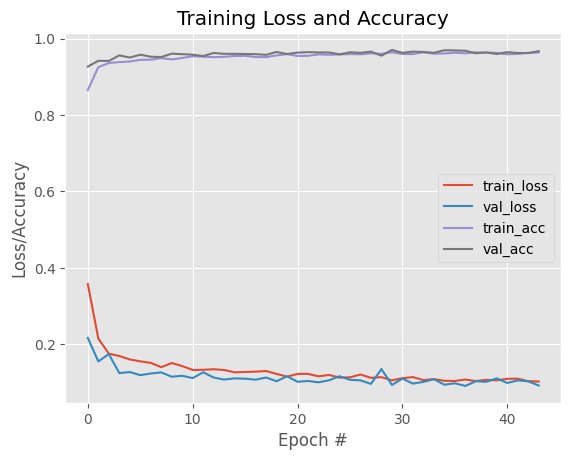

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 44), H_aug_maxpool_inceptionv3_DO02_2Dense.history["loss"], label="train_loss")
plt.plot(np.arange(0, 44), H_aug_maxpool_inceptionv3_DO02_2Dense.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 44), H_aug_maxpool_inceptionv3_DO02_2Dense.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 44), H_aug_maxpool_inceptionv3_DO02_2Dense.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

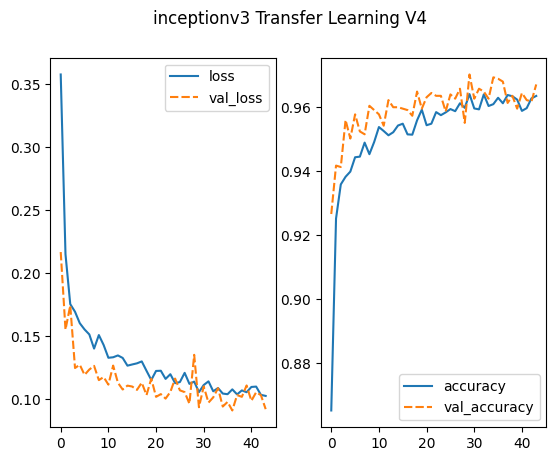

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_aug_maxpool_inceptionv3_DO02_2Dense_128_df = pd.DataFrame.from_dict(loaded_history_inceptionv3_v4)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_V4')
sns.lineplot(ax=axes[0], data=history_aug_maxpool_inceptionv3_DO02_2Dense_128_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_aug_maxpool_inceptionv3_DO02_2Dense_128_df[['accuracy', 'val_accuracy']])

Puede observarse cómo este último modelo presenta un comportamiento considerablemente mejor, aunque sigue presentando irregularidades o inestabilidades.

#### 5.4.10.3. Métricas de rendimiento

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_v4, val_accuracy_v4 = loaded_sequential_model_inceptionv3_v4.evaluate(val_generator_aug_128, verbose=2)
print("Validation Loss:", val_loss_v4)
print("Validation Accuracy:", val_accuracy_v4)

18/18 - 8s - loss: 0.0715 - accuracy: 0.9751 - 8s/epoch - 444ms/step
Validation Loss: 0.07150042057037354
Validation Accuracy: 0.9751111268997192


In [ ]:
rendimiento_iv3.update({
    'v4':{
        'Validation Loss': val_loss_v4,
        'Validation Accuracy': val_accuracy_v4,
        'Number of Epochs': len(loaded_history_inceptionv3_v4['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.03776831179857254,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.09003417938947678,
  'Validation Accuracy': 0.9666666388511658,
  'Number of Epochs': 39},
 'v3': {'Validation Loss': 0.07957813143730164,
  'Validation Accuracy': 0.9715555310249329,
  'Number of Epochs': 33},
 'v4': {'Validation Loss': 0.07150042057037354,
  'Validation Accuracy': 0.9751111268997192,
  'Number of Epochs': 44}}

### 5.4.11. Elección del mejor modelo de Transfer Learning para InceptionV3

Para determinar el mejor modelo obtenido en transfer learning de InceptionV3, se ha tenido en cuenta:

* **Precisión en Validación**: El modelo v4 tiene la mayor precisión en el conjunto de validación con una exactitud de aproximadamente 0.9751, seguido por el modelo v3 con 0.9716 y luego el modelo v2 con 0.9667.

* **Pérdida en Validación**: El modelo v4 tiene la pérdida más baja en el conjunto de validación, lo que indica que este modelo genera las predicciones más cercanas a las etiquetas reales en el conjunto de validación.

* **Número de Épocas**: El modelo v4 ha necesitado 44 épocas para entrenarse, seguido por el modelo v3 con 33 épocas y el modelo v2 con 39 épocas. Aunque el número de épocas por sí solo no determina la calidad del modelo, es importante considerar la eficiencia del entrenamiento.

Basándonos en estas métricas, el **modelo v4** parece ser el más prometedor entre las opciones.

#### 5.4.11.1 Predicción y evaluación - inceptionV3_V4

3/3 [==============================] - 0s 80ms/step


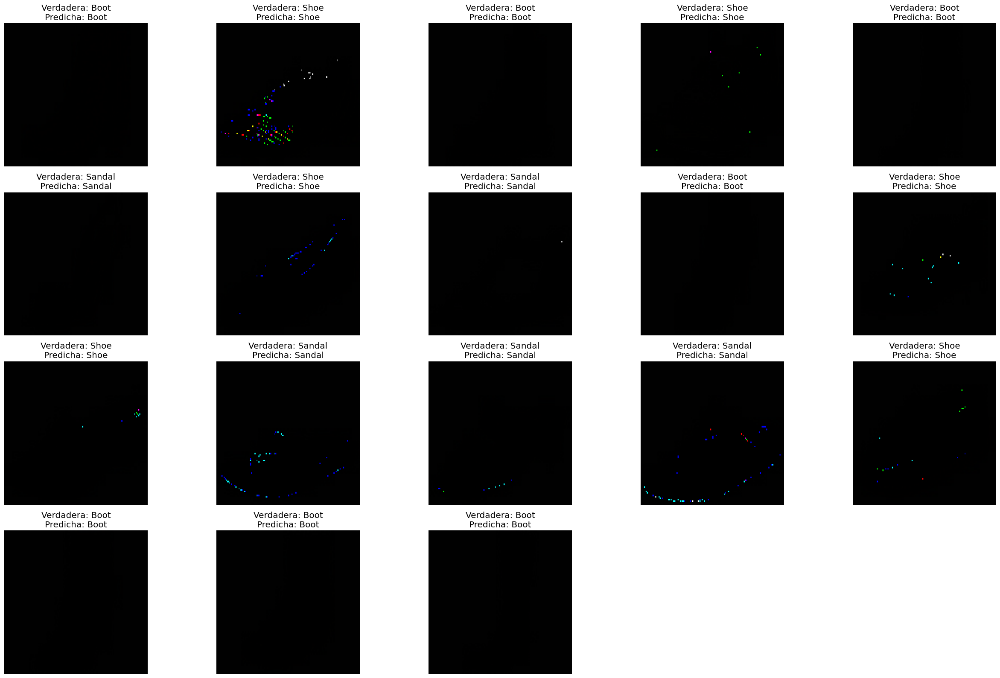

Accuracy: 0.9742222222222222
Precisión: 0.9743111000884047
Recall: 0.9742222222222222
F1-score: 0.9742454558093089
Total predicted images: 2250


In [ ]:
import math
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

# Restablecer el generador de datos
test_generator_128.reset()

# Definir las etiquetas de clase
class_labels = list(test_generator_128.class_indices.keys())

# Variables para almacenar las predicciones y etiquetas reales
predictions = []
true_labels = []

# Calcular el número de imágenes por batch size
total_images = test_generator_128.n
batch_size = 128
num_images = math.ceil(total_images / batch_size)

# Calcular el número de filas y columnas necesarias
num_rows = math.ceil(num_images / 5)
num_cols = min(num_images, 5)

# Definir el tamaño de la figura basado en el número de filas y columnas
plt.figure(figsize=(5*num_cols, 4*num_rows))

# Iterar sobre las imágenes y obtener las predicciones
for i in range(num_images):
    # Obtener la siguiente imagen del generador
    image, label = next(test_generator_128)

    # Redimensionar la imagen al tamaño esperado por el modelo (Para solucionar el error al no poner un tamaño adecuado en los modelos de fine-tunning)
    image_resized = tf.image.resize(image, (256, 256))

    # Realizar la predicción con el modelo
    prediction = loaded_sequential_model_inceptionv3_v4.predict(image_resized)

    # Obtener la clase predicha y verdadera
    predicted_class = np.argmax(prediction, axis=1)
    true_class = np.argmax(label, axis=1)

    # Agregar las predicciones y etiquetas reales a las listas
    predictions.extend(predicted_class)
    true_labels.extend(true_class)

    # Convertir la imagen al formato adecuado
    image = image[0]  # Tomar solo la primera imagen del lote
    image = image.astype('uint8')  # Convertir los valores de píxeles a enteros de 8 bits sin signo

    # Obtener la etiqueta predicha y verdadera
    predicted_class_label = class_labels[predicted_class[0]]
    true_class_label = class_labels[true_class[0]]

    # Mostrar la imagen real junto con la etiqueta predicha y la verdadera
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.title(f'Verdadera: {true_class_label}\nPredicha: {predicted_class_label}')
    plt.axis('off')

# Ajustar automáticamente el diseño de la figura
plt.tight_layout()
plt.show()

# Calcular la precisión utilizando accuracy_score
accuracy = accuracy_score(true_labels, predictions)
print(f'Accuracy: {accuracy}')

# Calcular la precisión
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precisión: {precision}')

# Calcular el recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall}')

# Calcular el F1-score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-score: {f1}')

# Calcular el número total de imágenes predichas
total_predicted_images = len(predictions)
print(f'Total predicted images: {total_predicted_images}')


En general, observando las métricas, parece que el modelo es capaz de realizar predicciones buenas:   

*   El Accuracy nos indica que 97.42% de las predicciones realizadas por el modelo son correctas.
*  Una precisión de 0.9743 indica que aproximadamente el 97.43% de las imágenes predichas como una clase específica son realmente de esa clase.
*   El F1-score es del 97.42%.

Si analizamos la matriz de confusión, se puede comprobar de manera muy visual la buena capacidad del modelo para realizar predicciones precisas.

[[733   6  11]
 [  3 733  14]
 [  5  19 726]]


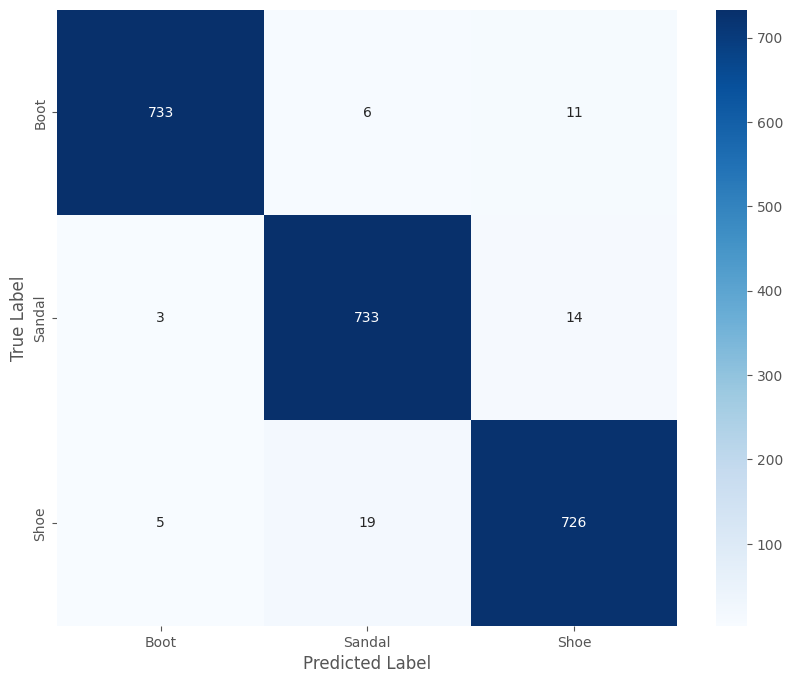

In [ ]:
# Crear la matriz de confusión
conf_matrix = confusion_matrix(true_labels, predictions)
print(conf_matrix)

# Convertir a dataframe
confusion_df = pd.DataFrame(conf_matrix, index=class_labels, columns=class_labels)

# Establecer los nombres de los ejes x e y para mejorar la legibilidad del mapa de calor
confusion_df.index.name = 'True Label'
confusion_df.columns.name = 'Predicted Label'

# Visualizar la matriz de confusión utilizando un mapa de calor de seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues')
plt.show()

## 5.5. Estrategia 3b. Red pre-entrenada - Fine Tuning (InceptionV3)

Para aplicar Fine Tuning al modelo inception se ha comenzado utilizando la arquitectura del mejor modelo obtenido en Transfer Learning.

Arquitectura del top model en transfer learning de InceptionV3:
* GlobalMaxPooling2D
* Capa densa con 512 neuronas (ReLU)
* Batch Normalization
* Dropout 0.2
* Capa densa con 3 neuronas (Sofmax)

Hiperparámetros de entrenamiento utilizados:
* Learning Rate: 0.0001
* Número de épocas: 44 (Early Stopping)
* Batch Size: 128
* Optimizador: Adam
* Función de pérdida: Categorical Crossentropy

En este caso, el fine tuning se va a llevar a cabo descongelando las últimas 249 capas. Estas capas corresponden a los últimos bloques convolucionales de la red, tal como se especifica en la documentación (https://keras.io/guides/transfer_learning/)

La arquitectura del modelo inceptionV3 se puede encontrar en: https://cloud.google.com/tpu/docs/inception-v3-advanced?hl=es-419

### 5.5.1. Construir una CNN a partir de la red pre-entrenada (InceptionV3 Fine Tuning) - inceptionV3_FT_V1

#### 5.5.1.1. Cargar la topología de CNN sin la capa de clasificación final (base model - InceptionV3)

In [ ]:
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(256,256,3)
    )
base_model.summary()

87910968/87910968 [==============================] - 0s 0us/step


#### 5.5.1.2. Crear el top model y descongelar las últimas 249 capas (Fine-Tunning) - ft_inceptionV3_V1

In [ ]:
for i,layer in enumerate(base_model.layers):
    print(i,layer.name)

0 input_1
1 conv2d
2 batch_normalization
3 activation
4 conv2d_1
5 batch_normalization_1
6 activation_1
7 conv2d_2
8 batch_normalization_2
9 activation_2
10 max_pooling2d
11 conv2d_3
12 batch_normalization_3
13 activation_3
14 conv2d_4
15 batch_normalization_4
16 activation_4
17 max_pooling2d_1
18 conv2d_8
19 batch_normalization_8
20 activation_8
21 conv2d_6
22 conv2d_9
23 batch_normalization_6
24 batch_normalization_9
25 activation_6
26 activation_9
27 average_pooling2d
28 conv2d_5
29 conv2d_7
30 conv2d_10
31 conv2d_11
32 batch_normalization_5
33 batch_normalization_7
34 batch_normalization_10
35 batch_normalization_11
36 activation_5
37 activation_7
38 activation_10
39 activation_11
40 mixed0
41 conv2d_15
42 batch_normalization_15
43 activation_15
44 conv2d_13
45 conv2d_16
46 batch_normalization_13
47 batch_normalization_16
48 activation_13
49 activation_16
50 average_pooling2d_1
51 conv2d_12
52 conv2d_14
53 conv2d_17
54 conv2d_18
55 batch_normalization_12
56 batch_normalization_14
5

In [ ]:
for layer in base_model.layers[:249]:
   layer.trainable = False
for layer in base_model.layers[249:]:
   layer.trainable = True

In [ ]:
# Crear un modelo secuencial
ft_model_v1 = Sequential(name='ft_inceptionv3_v1')
ft_model_v1.add(base_model)

ft_model_v1.add(GlobalMaxPooling2D())
ft_model_v1.add(Dense(512, activation='relu'))
ft_model_v1.add(BatchNormalization())
ft_model_v1.add(Dropout(0.2))
ft_model_v1.add(Dense(3, activation='softmax'))

ft_model_v1.summary()

Model: "ft_inceptionv3_v1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d_1 (Gl  (None, 2048)              0         
 obalMaxPooling2D)                                               
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 batch_normalization_95 (Ba  (None, 512)               2048      
 tchNormalization)                                               
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 3)           

### 5.5.2. Compilar y entrenar - ft_inceptionV3_V1

In [ ]:
ft_model_v1.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True
    )

H_ft_inceptionv3_v1 = ft_model_v1.fit(
    train_generator_aug_128,
    epochs=100,
    validation_data=val_generator_aug_128,
    callbacks=[early_stopping]
    )
"""

Epoch 1/100
83/83 [==============================] - 236s 2s/step - loss: 0.2696 - accuracy: 0.8995 - val_loss: 0.1396 - val_accuracy: 0.9578
Epoch 2/100
83/83 [==============================] - 195s 2s/step - loss: 0.1133 - accuracy: 0.9599 - val_loss: 0.0617 - val_accuracy: 0.9813
Epoch 3/100
83/83 [==============================] - 194s 2s/step - loss: 0.0795 - accuracy: 0.9720 - val_loss: 0.0753 - val_accuracy: 0.9747
Epoch 4/100
83/83 [==============================] - 198s 2s/step - loss: 0.0777 - accuracy: 0.9737 - val_loss: 0.0610 - val_accuracy: 0.9818
Epoch 5/100
83/83 [==============================] - 187s 2s/step - loss: 0.0590 - accuracy: 0.9798 - val_loss: 0.0559 - val_accuracy: 0.9836
Epoch 6/100
83/83 [==============================] - 191s 2s/step - loss: 0.0628 - accuracy: 0.9793 - val_loss: 0.0439 - val_accuracy: 0.9827
Epoch 7/100
83/83 [==============================] - 188s 2s/step - loss: 0.0515 - accuracy: 0.9811 - val_loss: 0.0409 - val_accuracy: 0.9884
Epoch 

#### 5.5.2.1. Guardar y subir el modelo y historial de entrenamiento - ft_inceptionV3_V1

In [ ]:
"""
# Guardar el modelo en formato HDF5
ft_model_v1.save(BASE_FOLDER+"ft_inceptionv3_v1.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_model_FT_inceptionv3_v1 = load_model(BASE_FOLDER + "ft_inceptionv3_v1.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_FT_inceptionv3_v1.json', 'w') as f:
    json.dump(H_ft_inceptionv3_v1.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_FT_inceptionv3_v1.json', 'r') as f:
    loaded_history_FT_inceptionv3_v1 = json.load(f)

#### 5.5.2.2. Monitorizar el proceso de entrenamiento - ft_inceptionV3_V1

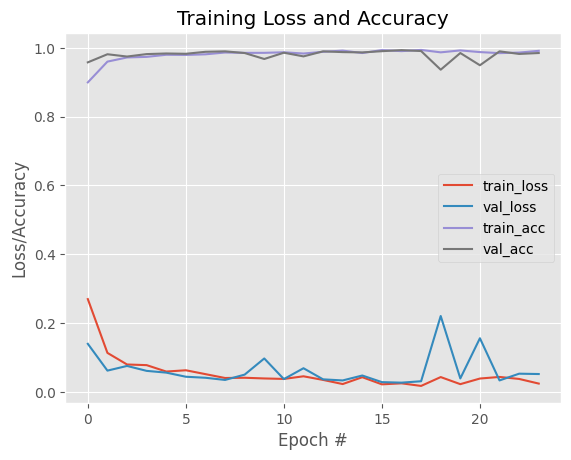

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 24), H_ft_inceptionv3_v1.history["loss"], label="train_loss")
plt.plot(np.arange(0, 24), H_ft_inceptionv3_v1.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 24), H_ft_inceptionv3_v1.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 24), H_ft_inceptionv3_v1.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

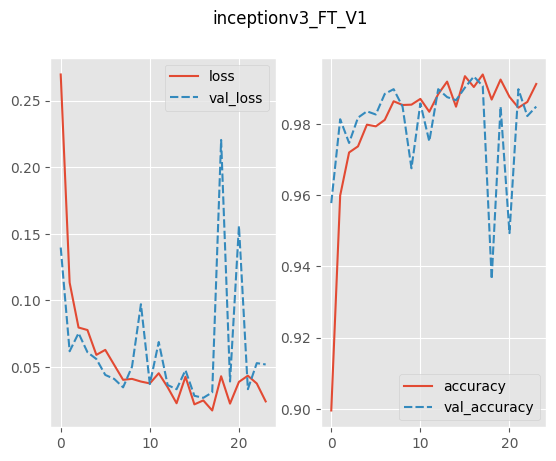

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_FT_inceptionv3_v1_df = pd.DataFrame.from_dict(loaded_history_FT_inceptionv3_v1)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_FT_V1')
sns.lineplot(ax=axes[0], data=history_FT_inceptionv3_v1_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_FT_inceptionv3_v1_df[['accuracy', 'val_accuracy']])

De igual forma que pasaba en el fine tuning del modelo ResNet, en estas curvas de validación, se puede observar un ruido considerable. Como ya se ha indicado anteriormente, los picos grandes en las curvas de validación pueden ser indicativos de overfitting.

Para comprobar si un número mayor de épocas de entrenamiento puede reducir este efecto, se ha realizado una **nueva iteración** de este modelo con una **paciencia en early stopping de 10**


#### 5.5.2.3. Métricas de rendimiento - ft_inceptionV3_V1

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_ft_v1, val_accuracy_ft_v1 = loaded_model_FT_inceptionv3_v1.evaluate(val_generator_aug_128, verbose=2)
print("Validation Loss:", val_loss_ft_v1)
print("Validation Accuracy:", val_accuracy_ft_v1)

18/18 - 9s - loss: 0.0156 - accuracy: 0.9956 - 9s/epoch - 527ms/step
Validation Loss: 0.015587537549436092
Validation Accuracy: 0.995555579662323


In [ ]:
rendimiento_iv3.update({
    'ft_v1':{
        'Validation Loss': val_loss_ft_v1,
        'Validation Accuracy': val_accuracy_ft_v1,
        'Number of Epochs': len(loaded_history_FT_inceptionv3_v1['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.035742271691560745,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.07093150168657303,
  'Validation Accuracy': 0.9773333072662354,
  'Number of Epochs': 39},
 'v3': {'Validation Loss': 0.06353873014450073,
  'Validation Accuracy': 0.9800000190734863,
  'Number of Epochs': 33},
 'v4': {'Validation Loss': 0.05725669488310814,
  'Validation Accuracy': 0.9826666712760925,
  'Number of Epochs': 44},
 'ft_v1': {'Validation Loss': 0.015587537549436092,
  'Validation Accuracy': 0.995555579662323,
  'Number of Epochs': 24}}

### 5.5.3. Construir una CNN con mayor patience en Early Stopping - ft_inceptionV3_V2

A esta iteración del modelo de fine tuning, como se ha comentado en el apartado de monitorización de la iteración anterior, se le han añadido las siguientes modificaciones:

* Incremento de la paciencia del Eraly Stopping de 7 a 10.

Se pretende comprobar si una mayor paciencia permite al modelo un entrenamiento menos restringido, de forma que pueda avanzar en el entrenamiento hasta etapas más estables.



#### 5.5.3.1. Cargar la topología de CNN sin la capa de clasificación final (base model - InceptionV3)

In [ ]:
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(256,256,3)
    )

#### 5.5.3.2. Crear el top model y descongelar las últimas 249 capas (Fine-Tunning) - ft_inceptionV3_V2

In [ ]:
for layer in base_model.layers[:249]:
   layer.trainable = False
for layer in base_model.layers[249:]:
   layer.trainable = True

In [ ]:
# Crear un modelo secuencial
ft_model_v1_10p = Sequential(name='ft_inceptionv3_v1')
ft_model_v1_10p.add(base_model)

ft_model_v1_10p.add(GlobalMaxPooling2D())
ft_model_v1_10p.add(Dense(512, activation='relu'))
ft_model_v1_10p.add(BatchNormalization())
ft_model_v1_10p.add(Dropout(0.2))
ft_model_v1_10p.add(Dense(3, activation='softmax'))

ft_model_v1_10p.summary()

Model: "ft_inceptionv3_v1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d_2 (Gl  (None, 2048)              0         
 obalMaxPooling2D)                                               
                                                                 
 dense_4 (Dense)             (None, 512)               1049088   
                                                                 
 batch_normalization_190 (B  (None, 512)               2048      
 atchNormalization)                                              
                                                                 
 dropout_2 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 3)           

### 5.5.4. Compilar y entrenar - ft_inceptionV3_V2

In [ ]:
ft_model_v1_10p.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

H_ft_inceptionv3_v1_10p = ft_model_v1_10p.fit(
    train_generator_aug_128,
    epochs=100,
    validation_data=val_generator_aug_128,
    callbacks=[early_stopping]
    )
"""

Epoch 1/100
83/83 [==============================] - 205s 2s/step - loss: 0.2776 - accuracy: 0.9002 - val_loss: 0.1000 - val_accuracy: 0.9702
Epoch 2/100
83/83 [==============================] - 194s 2s/step - loss: 0.1052 - accuracy: 0.9630 - val_loss: 0.0688 - val_accuracy: 0.9733
Epoch 3/100
83/83 [==============================] - 190s 2s/step - loss: 0.0846 - accuracy: 0.9704 - val_loss: 0.0831 - val_accuracy: 0.9707
Epoch 4/100
83/83 [==============================] - 192s 2s/step - loss: 0.0553 - accuracy: 0.9792 - val_loss: 0.0744 - val_accuracy: 0.9791
Epoch 5/100
83/83 [==============================] - 193s 2s/step - loss: 0.0555 - accuracy: 0.9800 - val_loss: 0.0994 - val_accuracy: 0.9649
Epoch 6/100
83/83 [==============================] - 195s 2s/step - loss: 0.0639 - accuracy: 0.9783 - val_loss: 0.0549 - val_accuracy: 0.9800
Epoch 7/100
83/83 [==============================] - 195s 2s/step - loss: 0.0516 - accuracy: 0.9829 - val_loss: 0.0559 - val_accuracy: 0.9822
Epoch 

#### 5.5.4.1. Guardar y subir el modelo y historial de entrenamiento - ft_inceptionV3_V2

In [ ]:
"""
# Guardar el modelo en formato HDF5
ft_model_v1_10p.save(BASE_FOLDER+"ft_inceptionv3_v1_10p.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_model_FT_inceptionv3_v2 = load_model(BASE_FOLDER + "ft_inceptionv3_v1_10p.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_FT_inceptionv3_v1_10p.json', 'w') as f:
    json.dump(H_ft_inceptionv3_v1_10p.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_FT_inceptionv3_v1_10p.json', 'r') as f:
    loaded_history_FT_inceptionv3_v2 = json.load(f)

#### 5.5.4.2. Monitorizar el proceso de entrenamiento - ft_inceptionV3_V2

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 28), H_ft_inceptionv3_v1_10p.history["loss"], label="train_loss")
plt.plot(np.arange(0, 28), H_ft_inceptionv3_v1_10p.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, 28), H_ft_inceptionv3_v1_10p.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, 28), H_ft_inceptionv3_v1_10p.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

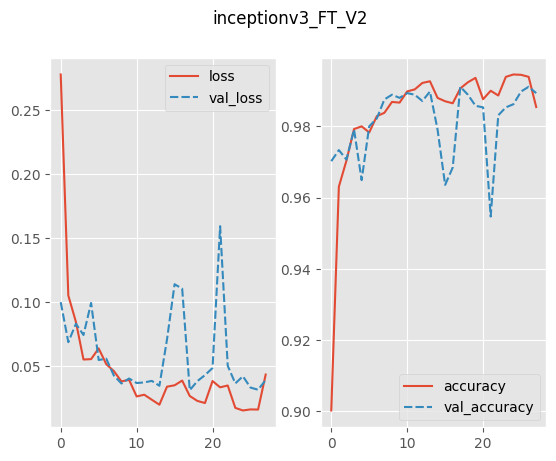

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_FT_inceptionv3_v2_df = pd.DataFrame.from_dict(loaded_history_FT_inceptionv3_v2)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_FT_V2')
sns.lineplot(ax=axes[0], data=history_FT_inceptionv3_v2_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_FT_inceptionv3_v2_df[['accuracy', 'val_accuracy']])

Las curvas del modelo con mayor paciencia en Early Stopping no ha mostrado ningún tipo de mejora respecto al anterior, por lo que en la siguiente iteración se ha decidido modificar la arquitectura del top_model. En concreto se ha **sustituido la capa de GlobalMaxPooling2D por una AverageMaxPooling2D** y se ha **incrementado el dropout de 0.2 a 0.5**. El AveragePooling2D toma el promedio de las características en lugar de seleccionar el valor máximo, lo que podría ser beneficioso para capturar características más generales y suavizar la representación de las características.

#### 5.5.4.3. Métricas de rendimiento - ft_inceptionV3_V2

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_ft_v2, val_accuracy_ft_v2 = loaded_model_FT_inceptionv3_v2.evaluate(val_generator_aug_128, verbose=2)
print("Validation Loss:", val_loss_ft_v2)
print("Validation Accuracy:", val_accuracy_ft_v2)

18/18 - 8s - loss: 0.0253 - accuracy: 0.9938 - 8s/epoch - 447ms/step
Validation Loss: 0.025349849835038185
Validation Accuracy: 0.9937777519226074


In [ ]:
rendimiento_iv3.update({
    'ft_v2':{
        'Validation Loss': val_loss_ft_v2,
        'Validation Accuracy': val_accuracy_ft_v2,
        'Number of Epochs': len(loaded_history_FT_inceptionv3_v2['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.035742271691560745,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.07093150168657303,
  'Validation Accuracy': 0.9773333072662354,
  'Number of Epochs': 39},
 'v3': {'Validation Loss': 0.06353873014450073,
  'Validation Accuracy': 0.9800000190734863,
  'Number of Epochs': 33},
 'v4': {'Validation Loss': 0.05725669488310814,
  'Validation Accuracy': 0.9826666712760925,
  'Number of Epochs': 44},
 'ft_v1': {'Validation Loss': 0.015587537549436092,
  'Validation Accuracy': 0.995555579662323,
  'Number of Epochs': 24},
 'ft_v2': {'Validation Loss': 0.025349849835038185,
  'Validation Accuracy': 0.9937777519226074,
  'Number of Epochs': 28}}

### 5.5.5. Construir una CNN con cambios en la arquitectura - ft_inceptionV3_V3

A la siguiente iteración del modelo de fine tuning, como se ha comentado en el apartado de monitorización de la iteración anterior, se le han añadido las siguientes modificaciones:

* Capa GlobalAverageMaxPooling2D (Sustituye a GlobalMaxPooling2D)
* Se incrementa el dropout de 0.2 a 0.5

Se pretende comprobar si la arquitectura anterior era propensa a las inestabilidades mostradas y otro tipo de capa es capaz de solucionarlo.

#### 5.5.5.1. Cargar la topología de CNN sin la capa de clasificación final (base model - InceptionV3)

In [ ]:
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(256,256,3)
    )

#### 5.5.5.2. Crear el top model y descongelar las últimas 249 capas (Fine-Tunning) - ft_inceptionV3_V3

In [ ]:
for layer in base_model.layers[:249]:
   layer.trainable = False
for layer in base_model.layers[249:]:
   layer.trainable = True

In [ ]:
# Crear un modelo secuencial
ft_model_v3 = Sequential(name='ft_inceptionv3_v3')
ft_model_v3.add(base_model)

ft_model_v3.add(GlobalAveragePooling2D())
ft_model_v3.add(Dense(512, activation='relu'))
ft_model_v3.add(BatchNormalization())
ft_model_v3.add(Dropout(0.5))
ft_model_v3.add(Dense(3, activation='softmax'))

ft_model_v3.summary()

Model: "ft_inceptionv3_v3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 batch_normalization_283 (B  (None, 512)               2048      
 atchNormalization)                                              
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 3)           

### 5.5.6. Compilar y entrenar - ft_inceptionV3_V3

In [ ]:
ft_model_v3.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

H_ft_inceptionv3_v3 = ft_model_v3.fit(
    train_generator_aug_128,
    epochs=100,
    validation_data=val_generator_aug_128,
    callbacks=[early_stopping]
    )
"""

Epoch 1/100
83/83 [==============================] - 198s 2s/step - loss: 0.2569 - accuracy: 0.9113 - val_loss: 0.1093 - val_accuracy: 0.9680
Epoch 2/100
83/83 [==============================] - 188s 2s/step - loss: 0.1297 - accuracy: 0.9575 - val_loss: 0.0811 - val_accuracy: 0.9756
Epoch 3/100
83/83 [==============================] - 188s 2s/step - loss: 0.0906 - accuracy: 0.9674 - val_loss: 0.0738 - val_accuracy: 0.9760
Epoch 4/100
83/83 [==============================] - 186s 2s/step - loss: 0.0863 - accuracy: 0.9697 - val_loss: 0.0521 - val_accuracy: 0.9849
Epoch 5/100
83/83 [==============================] - 187s 2s/step - loss: 0.0697 - accuracy: 0.9765 - val_loss: 0.0676 - val_accuracy: 0.9804
Epoch 6/100
83/83 [==============================] - 188s 2s/step - loss: 0.0597 - accuracy: 0.9794 - val_loss: 0.0531 - val_accuracy: 0.9858
Epoch 7/100
83/83 [==============================] - 187s 2s/step - loss: 0.0527 - accuracy: 0.9820 - val_loss: 0.0478 - val_accuracy: 0.9871
Epoch 

#### 5.5.6.1. Guardar y subir el modelo y historial de entrenamiento - ft_inceptionV3_V3

In [ ]:
"""
# Guardar el modelo en formato HDF5
ft_model_v3.save(BASE_FOLDER+"ft_inceptionv3_v3.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_model_FT_inceptionv3_v3 = load_model(BASE_FOLDER + "ft_inceptionv3_v3.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_FT_inceptionv3_v3.json', 'w') as f:
    json.dump(H_ft_inceptionv3_v3.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_FT_inceptionv3_v3.json', 'r') as f:
    loaded_history_FT_inceptionv3_v3 = json.load(f)

#### 5.5.6.2. Monitorizar el proceso de entrenamiento - ft_inceptionV3_V3

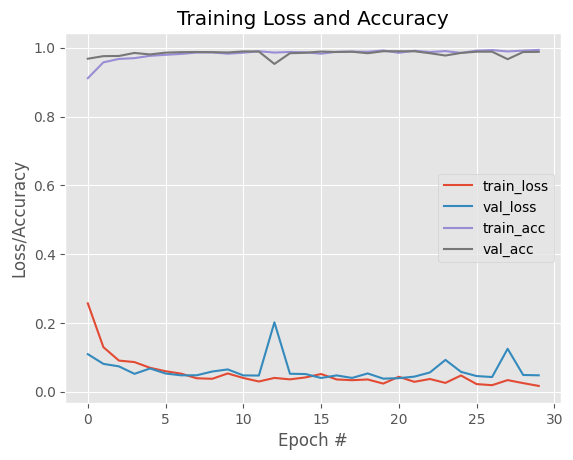

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v3['loss'])), H_ft_inceptionv3_v3.history["loss"], label="train_loss")
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v3['loss'])), H_ft_inceptionv3_v3.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v3['loss'])), H_ft_inceptionv3_v3.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v3['loss'])), H_ft_inceptionv3_v3.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

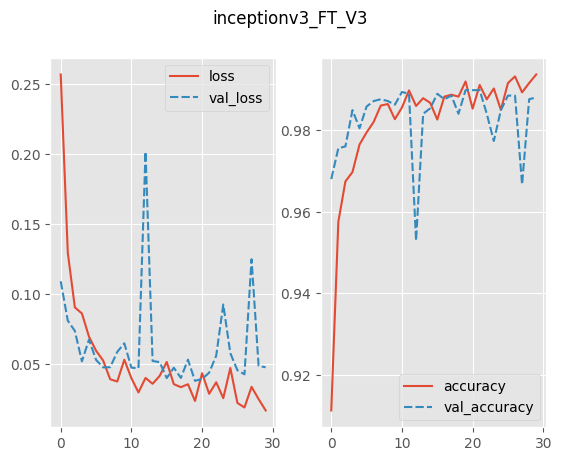

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_FT_inceptionv3_v3_df = pd.DataFrame.from_dict(loaded_history_FT_inceptionv3_v3)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_FT_V3')
sns.lineplot(ax=axes[0], data=history_FT_inceptionv3_v3_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_FT_inceptionv3_v3_df[['accuracy', 'val_accuracy']])

Parece que la nueva arquitectura y regularización han tenido un efecto positivo, aunque se sigue viendo un claro comportamiento inestable, sobre todo de las curvas de validación. En la siguiente iteración se ha **incrementado el tamaño del lote hasta 256** para comprobar si de esta manera el modelo es capaz de mejorar su entrenamiento y validación

#### 5.5.6.3. Métricas de rendimiento - ft_inceptionV3_V3

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_ft_v3, val_accuracy_ft_v3 = loaded_model_FT_inceptionv3_v3.evaluate(val_generator_aug_128, verbose=2)
print("Validation Loss:", val_loss_ft_v3)
print("Validation Accuracy:", val_accuracy_ft_v3)

18/18 - 8s - loss: 0.0381 - accuracy: 0.9898 - 8s/epoch - 450ms/step
Validation Loss: 0.03814297914505005
Validation Accuracy: 0.9897778034210205


In [ ]:
rendimiento_iv3.update({
    'ft_v3':{
        'Validation Loss': val_loss_ft_v3,
        'Validation Accuracy': val_accuracy_ft_v3,
        'Number of Epochs': len(loaded_history_FT_inceptionv3_v3['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.035742271691560745,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.07093150168657303,
  'Validation Accuracy': 0.9773333072662354,
  'Number of Epochs': 39},
 'v3': {'Validation Loss': 0.06353873014450073,
  'Validation Accuracy': 0.9800000190734863,
  'Number of Epochs': 33},
 'v4': {'Validation Loss': 0.05725669488310814,
  'Validation Accuracy': 0.9826666712760925,
  'Number of Epochs': 44},
 'ft_v1': {'Validation Loss': 0.015587537549436092,
  'Validation Accuracy': 0.995555579662323,
  'Number of Epochs': 24},
 'ft_v2': {'Validation Loss': 0.025349849835038185,
  'Validation Accuracy': 0.9937777519226074,
  'Number of Epochs': 28},
 'ft_v3': {'Validation Loss': 0.03814297914505005,
  'Validation Accuracy': 0.9897778034210205,
  'Number of Epochs': 30}}

### 5.5.7. Incrementar tamaño del lote a 256

In [ ]:
# Generador de imágenes para entrenamiento y prueba con data augmentation
train_datagen_augmentation = ImageDataGenerator(
    preprocessing_function=preprocess_input, # Preprocesamiento empleado en ResNet
    rotation_range=15,          # Rotación aleatoria en el rango de 0 a 15 grados
    width_shift_range=0.2,      # Desplazamiento aleatorio horizontal
    height_shift_range=0.2,     # Desplazamiento aleatorio vertical
    shear_range=0.2,            # Cizallamiento aleatorio
    zoom_range=0.2,             # Zoom aleatorio
    horizontal_flip=True,       # Volteo horizontal aleatorio
)

val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

# Imágenes de entrenamiento con data augmentation
train_generator_aug_256 = train_datagen_augmentation.flow_from_directory(
    train_dir,
    class_mode='categorical',
    batch_size=256,
    shuffle=True
)

# Imágenes de validación sin data augmentation
val_generator_aug_256 = test_datagen.flow_from_directory(
    val_dir,
    class_mode='categorical',
    batch_size=256,
)

# Imágenes de prueba sin data augmentation
test_generator_256 = test_datagen.flow_from_directory(
    test_dir,
    class_mode='categorical',
    batch_size=256
)

Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


### 5.5.8. Construir una CNN con GlobalMaxPooling y BatchSize de 256 - ft_inceptionV3_V4

A esta iteración del modelo de fine tuning, como se ha comentado en el apartado de monitorización de la iteración anterior, se le han añadido las siguientes modificaciones:
* Revertir a GlobalMaxPooling2D
* Revertir a Dropout de 0.2
* Incremento del Batch Size a 256.

Para comprobar si de esta manera el modelo es capaz de mejorar su entrenamiento y validación

#### 5.5.8.1. Cargar la topología de CNN sin la capa de clasificación final (base model - InceptionV3)

In [ ]:
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(256,256,3)
    )

#### 5.5.8.2. Crear el top model y descongelar las últimas 249 capas (Fine-Tunning) - ft_inceptionV3_V4

In [ ]:
for layer in base_model.layers[:249]:
   layer.trainable = False
for layer in base_model.layers[249:]:
   layer.trainable = True

In [ ]:
# Crear un modelo secuencial
ft_model_v4 = Sequential(name='ft_inceptionv3_v3')
ft_model_v4.add(base_model)

ft_model_v4.add(GlobalMaxPooling2D())
ft_model_v4.add(Dense(512, activation='relu'))
ft_model_v4.add(BatchNormalization())
ft_model_v4.add(Dropout(0.2))
ft_model_v4.add(Dense(3, activation='softmax'))

ft_model_v4.summary()

Model: "ft_inceptionv3_v3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_max_pooling2d (Glob  (None, 2048)              0         
 alMaxPooling2D)                                                 
                                                                 
 dense_6 (Dense)             (None, 512)               1049088   
                                                                 
 batch_normalization_379 (B  (None, 512)               2048      
 atchNormalization)                                              
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 3)           

### 5.5.9. Compilar y entrenar - ft_inceptionV3_V4

In [ ]:
ft_model_v4.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
    )

In [ ]:
"""
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
    )

H_ft_inceptionv3_v4 = ft_model_v4.fit(
    train_generator_aug_256,
    epochs=100,
    validation_data=val_generator_aug_256,
    callbacks=[early_stopping]
    )
"""

Epoch 1/100
42/42 [==============================] - 194s 5s/step - loss: 0.2391 - accuracy: 0.9237 - val_loss: 0.1576 - val_accuracy: 0.9578
Epoch 2/100
42/42 [==============================] - 191s 5s/step - loss: 0.1608 - accuracy: 0.9448 - val_loss: 0.1438 - val_accuracy: 0.9591
Epoch 3/100
42/42 [==============================] - 191s 5s/step - loss: 0.1162 - accuracy: 0.9590 - val_loss: 0.0931 - val_accuracy: 0.9756
Epoch 4/100
42/42 [==============================] - 190s 4s/step - loss: 0.1107 - accuracy: 0.9629 - val_loss: 0.0923 - val_accuracy: 0.9711
Epoch 5/100
42/42 [==============================] - 194s 5s/step - loss: 0.0916 - accuracy: 0.9691 - val_loss: 0.0787 - val_accuracy: 0.9778
Epoch 6/100
42/42 [==============================] - 189s 5s/step - loss: 0.0827 - accuracy: 0.9711 - val_loss: 0.0613 - val_accuracy: 0.9840
Epoch 7/100
42/42 [==============================] - 188s 4s/step - loss: 0.0725 - accuracy: 0.9733 - val_loss: 0.0653 - val_accuracy: 0.9840
Epoch 

#### 5.5.9.1. Guardar y subir el modelo y historial de entrenamiento - ft_inceptionV3_V4

In [ ]:
"""
# Guardar el modelo en formato HDF5
ft_model_v4.save(BASE_FOLDER+"ft_inceptionv3_v4.h5")
"""

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Cargar el modelo
loaded_model_FT_inceptionv3_v4 = load_model(BASE_FOLDER + "ft_inceptionv3_v4.h5")

In [ ]:
"""
with open(BASE_FOLDER + 'history_FT_inceptionv3_v4.json', 'w') as f:
    json.dump(H_ft_inceptionv3_v4.history, f)
"""

In [ ]:
with open(BASE_FOLDER + 'history_FT_inceptionv3_v4.json', 'r') as f:
    loaded_history_FT_inceptionv3_v4 = json.load(f)

#### 5.5.9.2. Monitorizar el proceso de entrenamiento - ft_inceptionV3_V4

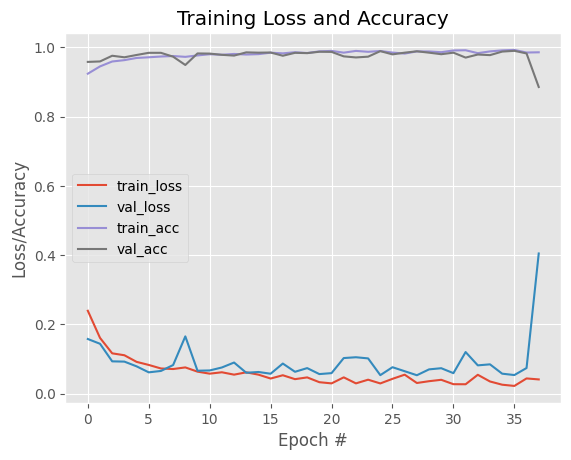

In [ ]:
# Gráficas
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v4['loss'])), H_ft_inceptionv3_v4.history["loss"], label="train_loss")
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v4['loss'])), H_ft_inceptionv3_v4.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v4['loss'])), H_ft_inceptionv3_v4.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, len(loaded_history_FT_inceptionv3_v4['loss'])), H_ft_inceptionv3_v4.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.show()

<Axes: >

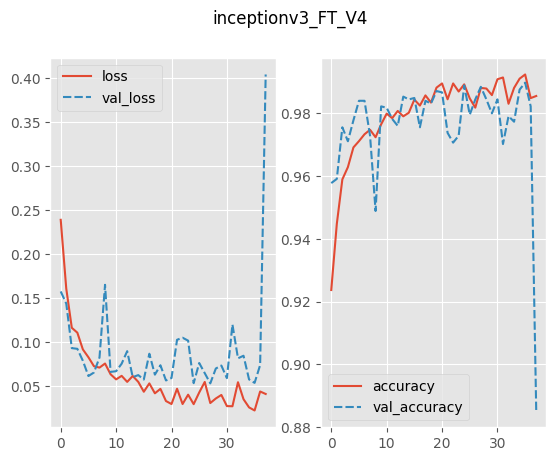

In [ ]:
# Evaluación del Modelo durante el Entrenamiento

# Convert the history to a dataframe for plotting
history_FT_inceptionv3_v4_df = pd.DataFrame.from_dict(loaded_history_FT_inceptionv3_v4)

# plot the loss and accuracy from the training process
fig, axes = plt.subplots(1, 2)
fig.suptitle('inceptionv3_FT_V4')
sns.lineplot(ax=axes[0], data=history_FT_inceptionv3_v4_df[['loss', 'val_loss']])
sns.lineplot(ax=axes[1], data=history_FT_inceptionv3_v4_df[['accuracy', 'val_accuracy']])

Como vemos, el aumento del Batch Size a 256 ha llevado a un peor modelo. Esto podría deberse a que un tamaño de lote más grande significa que se utilizan menos lotes durante cada época de entrenamiento. Esto puede resultar en una menor regularización por lote. Además, con un tamaño de lote más grande, se realizan menos actualizaciones de los pesos del modelo por cada época de entrenamiento. Esto puede hacer que el proceso de optimización sea menos efectivo, ya que el modelo se actualiza con menos información en cada paso, lo que puede llevar a un ajuste más lento de los pesos y a un aprendizaje menos eficiente.



#### 5.5.9.3. Métricas de rendimiento - ft_inceptionV3_V4

In [ ]:
# Evaluación del modelo en el conjunto de validación
val_loss_ft_v4, val_accuracy_ft_v4 = loaded_model_FT_inceptionv3_v4.evaluate(val_generator_aug_256, verbose=2)
print("Validation Loss:", val_loss_ft_v4)
print("Validation Accuracy:", val_accuracy_ft_v4)

9/9 - 8s - loss: 0.0530 - accuracy: 0.9884 - 8s/epoch - 927ms/step
Validation Loss: 0.05295179411768913
Validation Accuracy: 0.988444447517395


In [ ]:
rendimiento_iv3.update({
    'ft_v4':{
        'Validation Loss': val_loss_ft_v4,
        'Validation Accuracy': val_accuracy_ft_v4,
        'Number of Epochs': len(loaded_history_FT_inceptionv3_v4['loss'])
    }
})

rendimiento_iv3

{'v1': {'Validation Loss': 0.035742271691560745,
  'Validation Accuracy': 0.9933333396911621,
  'Number of Epochs': 20},
 'v2': {'Validation Loss': 0.07093150168657303,
  'Validation Accuracy': 0.9773333072662354,
  'Number of Epochs': 39},
 'v3': {'Validation Loss': 0.06353873014450073,
  'Validation Accuracy': 0.9800000190734863,
  'Number of Epochs': 33},
 'v4': {'Validation Loss': 0.05725669488310814,
  'Validation Accuracy': 0.9826666712760925,
  'Number of Epochs': 44},
 'ft_v1': {'Validation Loss': 0.015587537549436092,
  'Validation Accuracy': 0.995555579662323,
  'Number of Epochs': 24},
 'ft_v2': {'Validation Loss': 0.025349849835038185,
  'Validation Accuracy': 0.9937777519226074,
  'Number of Epochs': 28},
 'ft_v3': {'Validation Loss': 0.03814297914505005,
  'Validation Accuracy': 0.9897778034210205,
  'Number of Epochs': 30},
 'ft_v4': {'Validation Loss': 0.05295179411768913,
  'Validation Accuracy': 0.988444447517395,
  'Number of Epochs': 38}}

### 5.5.10. Elección del mejor modelo de Fine Tuning para InceptionV3

Basándonos en las métricas anteriores de los modelos, se ha tomado la Validation Accuracy como la principal métrica para determinar el mejor modelo. Una mayor precisión indica que el modelo ha logrado mejores resultados en la clasificación de datos de validación.

Por lo tanto, considerando la Validation Accuracy, el Modelo ft_inceptionv3_v1 es el que tiene la precisión más alta con un valor de aproximadamente 0.9956, es decir, logra una clasificación más precisa en el conjunto de datos de validación en comparación con los otros modelos.

En conclusión, basándonos en la Validation Accuracy y la Validation Loss, el Modelo **ft_inception_v1 parece ser el mejor modelo** obtenido para el Fine tuning de InceptionV3.

#### 5.5.10.1 Predicción y evaluación - ft_inceptionV3_V1

3/3 [==============================] - 1s 80ms/step


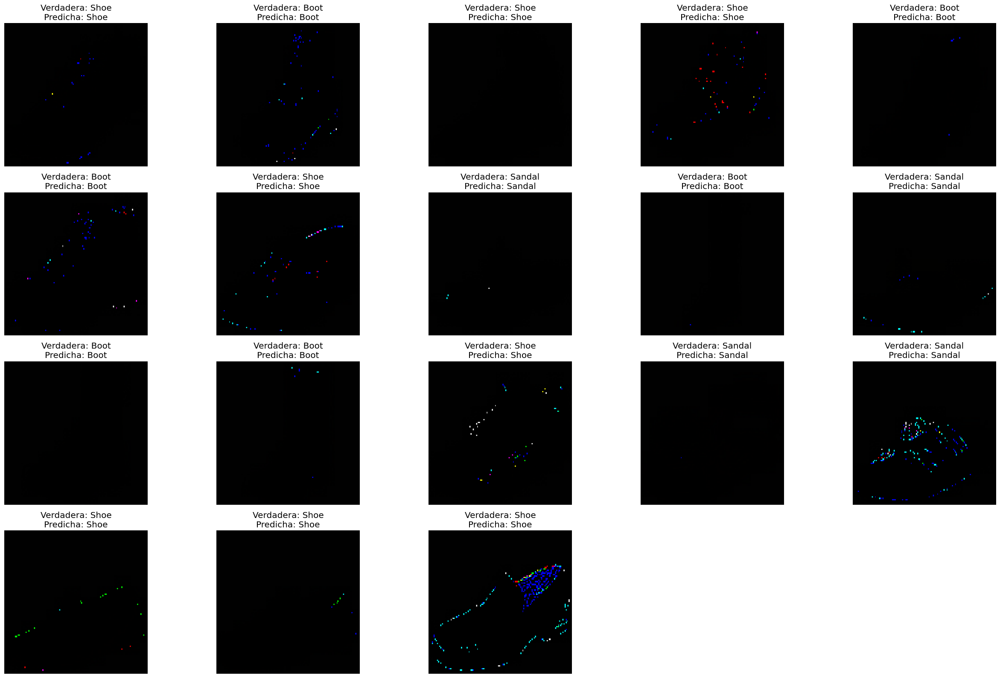

Accuracy: 0.9973333333333333
Precisión: 0.9973333238391592
Recall: 0.9973333333333333
F1-score: 0.9973324414787116
Total predicted images: 2250


In [ ]:
import math
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

# Restablecer el generador de datos
test_generator_128.reset()

# Definir las etiquetas de clase
class_labels = list(test_generator_128.class_indices.keys())

# Variables para almacenar las predicciones y etiquetas reales
predictions = []
true_labels = []

# Calcular el número de imágenes por batch size
total_images = test_generator_128.n
batch_size = 128
num_images = math.ceil(total_images / batch_size)

# Calcular el número de filas y columnas necesarias
num_rows = math.ceil(num_images / 5)
num_cols = min(num_images, 5)

# Definir el tamaño de la figura basado en el número de filas y columnas
plt.figure(figsize=(5*num_cols, 4*num_rows))

# Iterar sobre las imágenes y obtener las predicciones
for i in range(num_images):
    # Obtener la siguiente imagen del generador
    image, label = next(test_generator_128)

    # Redimensionar la imagen al tamaño esperado por el modelo (Para solucionar el error al no poner un tamaño adecuado en los modelos de fine-tunning)
    image_resized = tf.image.resize(image, (256, 256))

    # Realizar la predicción con el modelo
    prediction = loaded_model_FT_inceptionv3_v1.predict(image_resized)

    # Obtener la clase predicha y verdadera
    predicted_class = np.argmax(prediction, axis=1)
    true_class = np.argmax(label, axis=1)

    # Agregar las predicciones y etiquetas reales a las listas
    predictions.extend(predicted_class)
    true_labels.extend(true_class)

    # Convertir la imagen al formato adecuado
    image = image[0]  # Tomar solo la primera imagen del lote
    image = image.astype('uint8')  # Convertir los valores de píxeles a enteros de 8 bits sin signo

    # Obtener la etiqueta predicha y verdadera
    predicted_class_label = class_labels[predicted_class[0]]
    true_class_label = class_labels[true_class[0]]

    # Mostrar la imagen real junto con la etiqueta predicha y la verdadera
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.title(f'Verdadera: {true_class_label}\nPredicha: {predicted_class_label}')
    plt.axis('off')

# Ajustar automáticamente el diseño de la figura
plt.tight_layout()
plt.show()

# Calcular la precisión utilizando accuracy_score
accuracy = accuracy_score(true_labels, predictions)
print(f'Accuracy: {accuracy}')

# Calcular la precisión
precision = precision_score(true_labels, predictions, average='weighted')
print(f'Precisión: {precision}')

# Calcular el recall
recall = recall_score(true_labels, predictions, average='weighted')
print(f'Recall: {recall}')

# Calcular el F1-score
f1 = f1_score(true_labels, predictions, average='weighted')
print(f'F1-score: {f1}')

# Calcular el número total de imágenes predichas
total_predicted_images = len(predictions)
print(f'Total predicted images: {total_predicted_images}')


En general, observando las métricas, parece que el modelo es capaz de realizar predicciones muy precisas:   

*   El Accuracy nos indica que 99.73% de las predicciones realizadas por el modelo son correctas.
*  Una precisión de 0.9973 indica que aproximadamente el 99.73% de las imágenes predichas como una clase específica son realmente de esa clase.
*   El F1-score es del 99.73%.

Si analizamos la matriz de confusión, se puede comprobar de manera muy visual la excelente capacidad del modelo para realizar predicciones precisas.

[[750   0   0]
 [  1 746   3]
 [  0   2 748]]


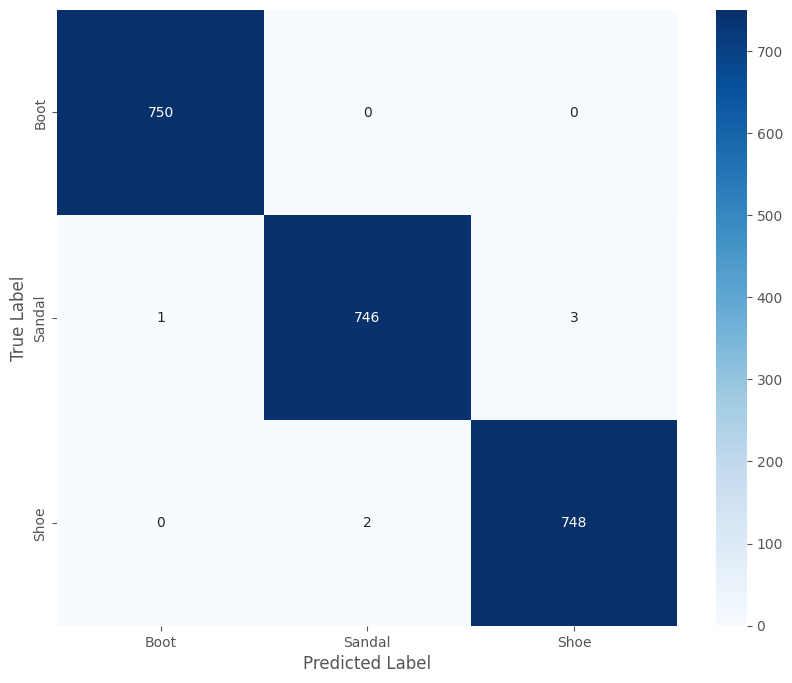

In [ ]:
# Crear la matriz de confusión
conf_matrix = confusion_matrix(true_labels, predictions)
print(conf_matrix)

# Convertir a dataframe
confusion_df = pd.DataFrame(conf_matrix, index=class_labels, columns=class_labels)

# Establecer los nombres de los ejes x e y para mejorar la legibilidad del mapa de calor
confusion_df.index.name = 'True Label'
confusion_df.columns.name = 'Predicted Label'

# Visualizar la matriz de confusión utilizando un mapa de calor de seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues')
plt.show()

# 6. Conclusiones

Después de llevar a cabo el desarrollo de múltiples modelos utilizando diferentes estrategias, incluyendo desde la construcción completa (from scratch) hasta el aprendizaje por transferencia y el ajuste fino (fine-tuning) utilizando las arquitecturas pre-entrenadas VGG16 y InceptionV3, hemos procedido a seleccionar el mejor modelo en cada caso. A continuación, se compararán y se contrastarán estos modelos seleccionados.

| Estrategia | Mejor Modelo | Accuracy | Descripción
| --- | --- | --- | --- |
| From Scratch | scratch_V2_droput  | 0,98533 |  Dos bloques convolucionales con dropout y dos capas densas (ReLu + softmax)
| ResNet | ssb_resnet_FT_16B| 0,99688 | Resnet50v2 con el último bloque convolucional descongelado
| InceptionV3 | ft_inceptionV3_V1 | 0,99733| InceptionV3 con las últimas 249 capas descongeladas + top_model (GlobalMaxPooling + Densa512(ReLU) + BatchNorm + Dropout0.2 + Densa3(softmax)

Tras analizar la tabla, se observa claramente que las estrategias que involucran el uso de redes pre-entrenadas han obtenido las mejores métricas. Aunque la estrategia de comenzar desde cero, o "from scratch", resulta muy útil para comprender a fondo el funcionamiento de un modelo, se ve limitada por los conocimientos del creador y la capacidad de ejecución del entorno. En cambio, el transfer learning ha demostrado ser una opción altamente efectiva al permitir aprovechar los pesos pre-entrenados de redes ampliamente utilizadas. Además, el fine-tuning brinda la flexibilidad de adaptar el entrenamiento a las  características específicas del problema, lo que ha mostrado ser un enfoque efectivo para mejorar el rendimiento de los modelos en nuestra tarea de clasidicación concreta.

En cuanto a las dos redes pre-entrenadas utilizadas, ResNet e InceptionV3, se observa que esta última ha obtenido un accuracy ligeramente superior. Aunque esto podría atribuirse a que InceptionV3 emplea una arquitectura más profunda y compleja en comparación con ResNet, es importante destacar que la diferencia entre ambas no resulta excesivamente significativa.

En resumen, en el análisis realizado con el objetivo de resolver la tarea de clasificación de imágenes de botas, zapatos y sandalias se refuerza la eficacia de los modelos que utilizan redes pre-entrenadas. Esta conclusión resalta la importancia del transfer learning y el fine-tuning en problemas de visión por computadora, al tiempo que reconoce la viabilidad de ambas redes pre-entrenadas para esta tarea específica.